#  Amazon Fine Food Reviews Analysis


Data Source: https://www.kaggle.com/snap/amazon-fine-food-reviews

The Amazon Fine Food Reviews dataset consists of reviews of fine foods from Amazon.<br>

Number of reviews: 568,454<br>
Number of users: 256,059<br>
Number of products: 74,258<br>
Timespan: Oct 1999 - Oct 2012<br>
Number of Attributes/Columns in data: 10 

Attribute Information:

1. Id
2. ProductId - unique identifier for the product
3. UserId - unqiue identifier for the user
4. ProfileName
5. HelpfulnessNumerator - number of users who found the review helpful
6. HelpfulnessDenominator - number of users who indicated whether they found the review helpful or not
7. Score - rating between 1 and 5
8. Time - timestamp for the review
9. Summary - brief summary of the review
10. Text - text of the review


#### Objective:
Given a review, determine whether the review is positive (Rating of 4 or 5) or negative (rating of 1 or 2).

<br>
[Q] How to determine if a review is positive or negative?<br>
<br> 
[Ans] We could use the Score/Rating. A rating of 4 or 5 could be cosnidered a positive review. A review of 1 or 2 could be considered negative. A review of 3 is nuetral and ignored. This is an approximate and proxy way of determining the polarity (positivity/negativity) of a review.




##  Loading the data

The dataset is available in two forms
1. .csv file
2. SQLite Database

In order to load the data, We have used the SQLITE dataset as it easier to query the data and visualise the data efficiently.
<br> 

Here as we only want to get the global sentiment of the recommendations (positive or negative), we will purposefully ignore all Scores equal to 3. If the score id above 3, then the recommendation wil be set to "positive". Otherwise, it will be set to "negative".

### Importing Packages

In [1]:
%matplotlib inline
import sqlite3
import pandas as pd
import numpy as np
import nltk
import string
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics import confusion_matrix
from sklearn import metrics
from sklearn.metrics import classification_report
from sklearn.metrics import roc_curve, auc
from nltk.stem.porter import PorterStemmer
from sklearn.metrics import accuracy_score
from sklearn.model_selection import cross_val_score
from sklearn.naive_bayes import MultinomialNB
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import normalize
from sklearn.metrics import f1_score
from sklearn.model_selection import RandomizedSearchCV
from sklearn.linear_model import LogisticRegression
from scipy.stats import uniform
from sklearn import tree
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn import svm
from sklearn.metrics import accuracy_score
import time
from sklearn.metrics.classification import accuracy_score, log_loss
import warnings
warnings.filterwarnings("ignore")
from sklearn.manifold import TSNE

from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from collections import Counter
from sklearn.decomposition import TruncatedSVD
from imblearn.over_sampling import SMOTE 
from sklearn.svm import LinearSVC
from sklearn.metrics import hinge_loss
from scipy.sparse import hstack
from wordcloud import WordCloud, STOPWORDS
from os import path
from PIL import Image
import xgboost as xgb
from sklearn.cluster import KMeans
from sklearn.preprocessing import LabelEncoder
from sklearn.cluster import AgglomerativeClustering
from prettytable import PrettyTable
from sklearn.preprocessing import StandardScaler

In [7]:
# using the SQLite Table to read data.
con = sqlite3.connect('database.sqlite') 
#filtering only positive and negative reviews i.e. 
# not taking into consideration those reviews with Score=3
filtered_data = pd.read_sql_query("""
SELECT *
FROM Reviews
WHERE Score != 3
""", con) 
# Give reviews with Score>3 a positive rating, and reviews with a score<3 a negative rating.
def partition(x):
    if x < 3:
        return 'negative'
    return 'positive'
#changing reviews with score less than 3 to be positive and vice-versa
actualScore = filtered_data['Score']
positiveNegative = actualScore.map(partition) 
filtered_data['Score'] = positiveNegative

In [4]:
print(filtered_data.shape) #looking at the number of attributes and size of the data
filtered_data.head()

(525814, 10)


,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text
0,1,B001E4KFG0,A3SGXH7AUHU8GW,delmartian,1,1,positive,1303862400,Good Quality Dog Food,I have bought several of the Vitality canned d...
1,2,B00813GRG4,A1D87F6ZCVE5NK,dll pa,0,0,negative,1346976000,Not as Advertised,Product arrived labeled as Jumbo Salted Peanut...
2,3,B000LQOCH0,ABXLMWJIXXAIN,"Natalia Corres ""Natalia Corres""",1,1,positive,1219017600,"""Delight"" says it all",This is a confection that has been around a fe...
3,4,B000UA0QIQ,A395BORC6FGVXV,Karl,3,3,negative,1307923200,Cough Medicine,If you are looking for the secret ingredient i...
4,5,B006K2ZZ7K,A1UQRSCLF8GW1T,"Michael D. Bigham ""M. Wassir""",0,0,positive,1350777600,Great taffy,Great taffy at a great price. There was a wid...


#  Exploratory Data Analysis

##  Data Cleaning: Deduplication

It is observed (as shown in the table below) that the reviews data had many duplicate entries. Hence it was necessary to remove duplicates in order to get unbiased results for the analysis of the data.  Following is an example:

In [8]:
display= pd.read_sql_query("""
SELECT *
FROM Reviews
WHERE Score != 3 AND UserId="AR5J8UI46CURR"
ORDER BY ProductID
""", con)
display

,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text
0,78445,B000HDL1RQ,AR5J8UI46CURR,Geetha Krishnan,2,2,5,1199577600,LOACKER QUADRATINI VANILLA WAFERS,DELICIOUS WAFERS. I FIND THAT EUROPEAN WAFERS ...
1,138317,B000HDOPYC,AR5J8UI46CURR,Geetha Krishnan,2,2,5,1199577600,LOACKER QUADRATINI VANILLA WAFERS,DELICIOUS WAFERS. I FIND THAT EUROPEAN WAFERS ...
2,138277,B000HDOPYM,AR5J8UI46CURR,Geetha Krishnan,2,2,5,1199577600,LOACKER QUADRATINI VANILLA WAFERS,DELICIOUS WAFERS. I FIND THAT EUROPEAN WAFERS ...
3,73791,B000HDOPZG,AR5J8UI46CURR,Geetha Krishnan,2,2,5,1199577600,LOACKER QUADRATINI VANILLA WAFERS,DELICIOUS WAFERS. I FIND THAT EUROPEAN WAFERS ...
4,155049,B000PAQ75C,AR5J8UI46CURR,Geetha Krishnan,2,2,5,1199577600,LOACKER QUADRATINI VANILLA WAFERS,DELICIOUS WAFERS. I FIND THAT EUROPEAN WAFERS ...


As can be seen above the same user has multiple reviews of the with the same values for HelpfulnessNumerator, HelpfulnessDenominator, Score, Time, Summary and Text  and on doing analysis it was found that <br>
<br> 
ProductId=B000HDOPZG was Loacker Quadratini Vanilla Wafer Cookies, 8.82-Ounce Packages (Pack of 8)<br>
<br> 
ProductId=B000HDL1RQ was Loacker Quadratini Lemon Wafer Cookies, 8.82-Ounce Packages (Pack of 8) and so on<br>

It was inferred after analysis that reviews with same parameters other than ProductId belonged to the same product just having different flavour or quantity. Hence in order to reduce redundancy it was decided to eliminate the rows having same parameters.<br>

The method used for the same was that we first sort the data according to ProductId and then just keep the first similar product review and delelte the others. for eg. in the above just the review for ProductId=B000HDL1RQ remains. This method ensures that there is only one representative for each product and deduplication without sorting would lead to possibility of different representatives still existing for the same product.

In [9]:
#Sorting data according to ProductId in ascending order
sorted_data=filtered_data.sort_values('ProductId', axis=0, ascending=True, inplace=False, kind='quicksort', na_position='last')

In [10]:
#Deduplication of entries
final=sorted_data.drop_duplicates(subset={"UserId","ProfileName","Time","Text"}, keep='first', inplace=False)
final.shape

(364173, 10)

In [11]:
#Checking to see how much % of data still remains
(final['Id'].size*1.0)/(filtered_data['Id'].size*1.0)*100

69.25890143662969

<b>Observation:-</b> It was also seen that in two rows given below the value of HelpfulnessNumerator is greater than HelpfulnessDenominator which is not practically possible hence these two rows too are removed from calcualtions

In [12]:
display= pd.read_sql_query("""
SELECT *
FROM Reviews
WHERE Score != 3 AND Id=44737 OR Id=64422
ORDER BY ProductID
""", con)
display

,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text
0,64422,B000MIDROQ,A161DK06JJMCYF,"J. E. Stephens ""Jeanne""",3,1,5,1224892800,Bought This for My Son at College,My son loves spaghetti so I didn't hesitate or...
1,44737,B001EQ55RW,A2V0I904FH7ABY,Ram,3,2,4,1212883200,Pure cocoa taste with crunchy almonds inside,It was almost a 'love at first bite' - the per...


In [13]:
final=final[final.HelpfulnessNumerator<=final.HelpfulnessDenominator]

In [14]:
#Before starting the next phase of preprocessing lets see the number of entries left
print(final.shape)
#How many positive and negative reviews are present in our dataset?
final['Score'].value_counts()

(364171, 10)


positive    307061
negative     57110
Name: Score, dtype: int64

## Text Preprocessing: Stemming, stop-word removal and Lemmatization.

Now that we have finished deduplication our data requires some preprocessing before we go on further with analysis and making the prediction model.

Hence in the Preprocessing phase we do the following in the order below:-

1. Begin by removing the html tags
2. Remove any punctuations or limited set of special characters like , or . or # etc.
3. Check if the word is made up of english letters and is not alpha-numeric
4. Check to see if the length of the word is greater than 2 (as it was researched that there is no adjective in 2-letters)
5. Convert the word to lowercase
6. Remove Stopwords
7. Finally Snowball Stemming the word (it was obsereved to be better than Porter Stemming)<br>

After which we collect the words used to describe positive and negative reviews

In [15]:
# find sentences containing HTML tags
import re
i=0;
for sent in final['Text'].values:
    if (len(re.findall('<.*?>', sent))):
        print(i)
        print(sent)
        break;
    i += 1;            

6
I set aside at least an hour each day to read to my son (3 y/o). At this point, I consider myself a connoisseur of children's books and this is one of the best. Santa Clause put this under the tree. Since then, we've read it perpetually and he loves it.<br /><br />First, this book taught him the months of the year.<br /><br />Second, it's a pleasure to read. Well suited to 1.5 y/o old to 4+.<br /><br />Very few children's books are worth owning. Most should be borrowed from the library. This book, however, deserves a permanent spot on your shelf. Sendak's best.


In [2]:
import re
import string
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from nltk.stem.wordnet import WordNetLemmatizer

stop = set(stopwords.words('english')) #set of stopwords
l = ["mightn't","mustn","shouldn","don't","nor","doesn't","won't","needn","weren't","couldn","wouldn't","mightn","haven't","don","doesn","shouldn't","no","didn't","hadn","wasn","aren","couldn't","wouldn","mustn't","didn","don","doesn","no","isn't","ain","not","needn't","hadn't","weren","wasn't","aren't","haven","hasn","isn","mustn"]
stop = stop - set(l)                   # deleting word related to not from set of stopword
sno = nltk.stem.SnowballStemmer('english') #initialising the snowball stemmer


def cleanhtml(sentence): #function to clean the word of any html-tags
    cleanr = re.compile('<.*?>')
    cleantext = re.sub(cleanr, ' ', sentence)
    return cleantext
def cleanpunc(sentence): #function to clean the word of any punctuation or special characters
    cleaned = re.sub(r'[?|!|\'|"|#]',r'',sentence)
    cleaned = re.sub(r'[.|,|)|(|\|/]',r' ',cleaned)
    return  cleaned
print(stop)
print('************************************')
print(sno.stem('bestie'))

{'as', "you'll", 'had', 'on', 'when', 'yours', 'here', "shan't", 'between', 'few', 'that', 'shan', 'such', 'at', 'what', 'me', 'after', 'itself', 'each', 'and', 'him', 'doing', 'until', 'are', 'before', 'your', 'they', 'both', 'my', 'than', 'their', 's', 'have', 'being', 'only', 'into', 'having', 've', 'but', 'very', 'how', 'against', 'most', 'out', 'll', 'during', 'them', 'why', 'ours', 'were', 'below', 'an', 'with', 'can', 'under', 'its', 'who', 'won', 'was', 'any', 'more', 'if', 'theirs', 'which', 'above', 're', 'to', 'a', 'should', 'or', 'd', 'all', 'so', 'about', 't', 'his', 'from', 'our', 'i', 'you', 'too', 'off', 'hers', 'he', 'once', 'o', "should've", "it's", 'we', 'up', 'through', 'myself', 'been', "you'd", 'over', 'because', 'it', 'be', 'do', 'm', 'themselves', "you've", 'other', "you're", 'yourselves', 'same', 'then', 'ourselves', 'further', 'those', "hasn't", 'of', 'himself', 'these', 'herself', 'is', 'down', 'the', 'in', 'has', 'will', 'does', 'yourself', 'this', 'for', 'w

### Preprocessing text data

In [17]:
i=0
str1=' '
final_string=[]
all_positive_words=[] # store words from +ve reviews here
all_negative_words=[] # store words from -ve reviews here.
s=''
for sent in final['Text'].values:
    filtered_sentence=[]
    #print(sent);
    sent=cleanhtml(sent) # remove HTMl tags
    for w in sent.split():
        for cleaned_words in cleanpunc(w).split():
            if((cleaned_words.isalpha()) & (len(cleaned_words)>2)):    
                if(cleaned_words.lower() not in stop):
                    s=(sno.stem(cleaned_words.lower())).encode('utf8')
                    filtered_sentence.append(s)
                    if (final['Score'].values)[i] == 'positive': 
                        all_positive_words.append(s) #list of all words used to describe positive reviews
                    if(final['Score'].values)[i] == 'negative':
                        all_negative_words.append(s) #list of all words used to describe negative reviews reviews
                else:
                    continue
            else:
                continue 
    #print(filtered_sentence)
    str1 = b" ".join(filtered_sentence) #final string of cleaned words
    #print("***********************************************************************")
    
    final_string.append(str1)
    i+=1

In [18]:
final['NewCleanedText']= final_string

In [19]:
final.head(1) #below the processed review can be seen in the CleanedText Column 

,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text,NewCleanedText
138706,150524,0006641040,ACITT7DI6IDDL,shari zychinski,0,0,positive,939340800,EVERY book is educational,this witty little book makes my son laugh at l...,b'witti littl book make son laugh loud recit c...


### Preprocessing Summary Text

In [36]:
start=time.time()
i=0
str1=' '
final_string=[]
all_positive_words=[] # store words from +ve reviews here
all_negative_words=[] # store words from -ve reviews here.
s=''
for sent in final['Summary'].values:
    filtered_sentence=[]
    #print(sent);
    sent=cleanhtml(sent) # remove HTMl tags
    for w in sent.split():                                              # splitting sentence into words
        for cleaned_words in cleanpunc(w).split():                      # cleaning punctuation then splitting
            if((cleaned_words.isalpha()) & (len(cleaned_words)>2)):     # if length of word is grater than 2 and not alphanumeric
                if(cleaned_words.lower() not in stop):                  # if word is not in stopwords
                    s=(sno.stem(cleaned_words.lower())).encode('utf8')  # converting into lowercase then snowball steming
                    filtered_sentence.append(s)
                    if (final['Score'].values)[i] == 'positive': 
                        all_positive_words.append(s) #list of all words used to describe positive reviews
                    if(final['Score'].values)[i] == 'negative':
                        all_negative_words.append(s) #list of all words used to describe negative reviews reviews
                else:
                    continue
            else:
                continue 
    #print(filtered_sentence)
    str1 = b" ".join(filtered_sentence) #final string of cleaned words
    #print("***********************************************************************")
    
    final_string.append(str1)
    i+=1
print('Summary text preprocessing time: ' ,(time.time() - start))       # printing time taken in text preprocessing

Summary text preprocessing time:  36.92266368865967


In [37]:
final['NewCleanedSummary']=final_string   #adding a column of CleanedSummary which displays the data after pre-processing of the review 

In [38]:
final.head(1)  # printing first  point

,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text,NewCleanedText,NewCleanedSummary
138706,150524,0006641040,ACITT7DI6IDDL,shari zychinski,0,0,positive,939340800,EVERY book is educational,this witty little book makes my son laugh at l...,b'witti littl book make son laugh loud recit c...,b'everi book educ'


### Addding text length and summary length as features

In [ ]:
len_txt = [len(i.split()) for i in final['Text']]
len_sum = [len(i.split()) for i in final['Summary']]

final['Text_length'] = len_txt
final['Summary_length']=len_sum

### Storing File for  Future use

In [2]:
# store final table into an SQlLite table for future.
conn = sqlite3.connect('NewCleaned_text_summary.sqlite')
c=conn.cursor()
conn.text_factory = str
final.to_sql('Reviews', conn, schema=None, if_exists='replace', index=True, index_label=None, chunksize=None, dtype=None)

NameError: name 'final' is not defined

### NewCleaned_text_summary contain cleaned text and cleaned summary

In [3]:
# using the SQLite Table to read data.
con = sqlite3.connect('NewCleaned_text_summary.sqlite')     # estbalshing connection to database
final = pd.read_sql_query("""         
SELECT *
FROM Reviews
""", con) 

In [27]:
final.head(1)

,level_0,index,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text,NewCleanedText,NewCleanedSummary,Text_length,Summary_length
0,0,138706,150524,0006641040,ACITT7DI6IDDL,shari zychinski,0,0,positive,939340800,EVERY book is educational,this witty little book makes my son laugh at l...,b'witti littl book make son laugh loud recit c...,b'everi book educ',74,4


# ------------------------------------------------------------------------------------------------------------

# TSNE

In [28]:
# Taking 3000 Reviews
tsne_df = final.sample(n = 3000,random_state = 123)   # taking only 3000 reviews
print(tsne_df.shape)                                  # printing the shape of tsne_df
print(tsne_df['Score'].value_counts())                # printing the counts of positive and negative reviews
label = tsne_df['Score']                              # labeling Score
tsne_df.head(1)                                       #printing first 2 reviews

(3000, 16)
positive    2555
negative     445
Name: Score, dtype: int64


,level_0,index,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text,NewCleanedText,NewCleanedSummary,Text_length,Summary_length
253564,253564,499556,540125,B002W08W56,A2STPOZAT37RNE,Betty Baker,1,1,positive,1300320000,"Wonderful, but surprised to find this size can...",Great beans....the best texture hands down. T...,b'great bean best textur hand seem great tast ...,b'wonder surpris find size',151,8


In [29]:
# performs t-sne with different perplexity values and their repective plots..
# creting a function tsne_perform
def tsne_perform(X_data, y_data, perplexities, n_iter=1000, image_name_prefix='t-sne'):
        
    for index,perplexity in enumerate(perplexities):
        # performing  t-sne
        print('\nperforming tsne with perplexity {} and with {} iterations at max'.format(perplexity, n_iter))
        X_reduced = TSNE(verbose=2, perplexity=perplexity).fit_transform(X_data)
        print('Done..')
        
        # prepare the data for seaborn  to visualize       
        print('Creating plot for this t-sne visualization..')
        df = pd.DataFrame({'x':X_reduced[:,0], 'y':X_reduced[:,1] ,'label':y_data})   # taking top two features
        
        # draw the plot in appropriate place in the grid
        sns.lmplot(data=df, x='x', y='y', hue='label', fit_reg=False, height=5,\
                   palette="Set1",markers=['s','o'])
        plt.title("perplexity : {} and max_iter : {}".format(perplexity, n_iter))
        img_name = image_name_prefix + '_perp_{}_iter_{}.png'.format(perplexity, n_iter)
        print('saving this plot as image in present working directory...')
        plt.savefig(img_name)
        plt.show()
        print('Done')

# BOW  as word featurization


In [31]:
count_vect = CountVectorizer(min_df = 5)                                          # creating object of countvectorizercwith default parameter
final_counts = count_vect.fit_transform(tsne_df['NewCleanedText'].values)  #fitting object on cleanedtext to covert them into vector
print("the type of count vectorizer ",type(final_counts))
print("the shape of out text BOW vectorizer ",final_counts.get_shape())
print("the number of unique words ", final_counts.get_shape()[1])
type(final_counts)

the type of count vectorizer  <class 'scipy.sparse.csr.csr_matrix'>
the shape of out text BOW vectorizer  (3000, 2250)
the number of unique words  2250


scipy.sparse.csr.csr_matrix


performing tsne with perplexity 2 and with 1000 iterations at max
[t-SNE] Computing 7 nearest neighbors...
[t-SNE] Indexed 3000 samples in 0.381s...
[t-SNE] Computed neighbors for 3000 samples in 29.028s...
[t-SNE] Computed conditional probabilities for sample 1000 / 3000
[t-SNE] Computed conditional probabilities for sample 2000 / 3000
[t-SNE] Computed conditional probabilities for sample 3000 / 3000
[t-SNE] Mean sigma: 0.656834
[t-SNE] Computed conditional probabilities in 0.120s
[t-SNE] Iteration 50: error = 131.1677399, gradient norm = 0.2950150 (50 iterations in 2.116s)
[t-SNE] Iteration 100: error = 126.4869156, gradient norm = 0.2922274 (50 iterations in 2.509s)
[t-SNE] Iteration 150: error = 126.8019867, gradient norm = 0.2698119 (50 iterations in 2.622s)
[t-SNE] Iteration 200: error = 128.7103882, gradient norm = 0.2656649 (50 iterations in 2.508s)
[t-SNE] Iteration 250: error = 123.3080521, gradient norm = 0.3074573 (50 iterations in 2.380s)
[t-SNE] KL divergence after 250 i

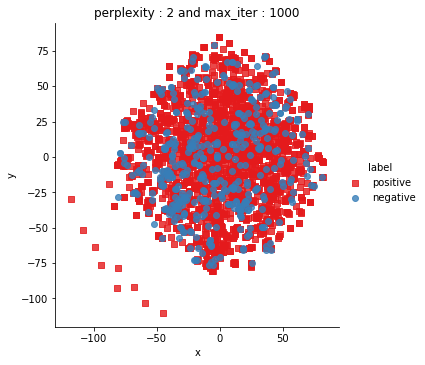

Done

performing tsne with perplexity 5 and with 1000 iterations at max
[t-SNE] Computing 16 nearest neighbors...
[t-SNE] Indexed 3000 samples in 0.451s...
[t-SNE] Computed neighbors for 3000 samples in 34.204s...
[t-SNE] Computed conditional probabilities for sample 1000 / 3000
[t-SNE] Computed conditional probabilities for sample 2000 / 3000
[t-SNE] Computed conditional probabilities for sample 3000 / 3000
[t-SNE] Mean sigma: 0.877103
[t-SNE] Computed conditional probabilities in 0.078s
[t-SNE] Iteration 50: error = 126.0451965, gradient norm = 0.2722658 (50 iterations in 1.960s)
[t-SNE] Iteration 100: error = 123.2253799, gradient norm = 0.2537029 (50 iterations in 1.817s)
[t-SNE] Iteration 150: error = 128.6947784, gradient norm = 0.2193673 (50 iterations in 1.805s)
[t-SNE] Iteration 200: error = 131.4036407, gradient norm = 0.2073862 (50 iterations in 2.190s)
[t-SNE] Iteration 250: error = 131.2041016, gradient norm = 0.2056504 (50 iterations in 2.796s)
[t-SNE] KL divergence after

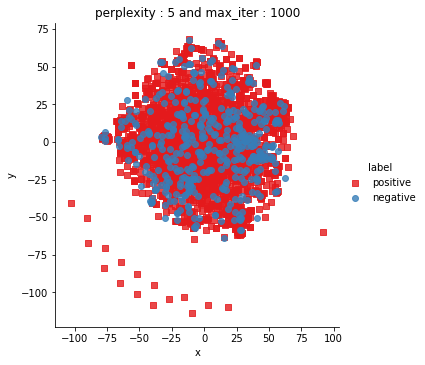

Done

performing tsne with perplexity 10 and with 1000 iterations at max
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 3000 samples in 0.450s...
[t-SNE] Computed neighbors for 3000 samples in 27.650s...
[t-SNE] Computed conditional probabilities for sample 1000 / 3000
[t-SNE] Computed conditional probabilities for sample 2000 / 3000
[t-SNE] Computed conditional probabilities for sample 3000 / 3000
[t-SNE] Mean sigma: 1.035555
[t-SNE] Computed conditional probabilities in 0.062s
[t-SNE] Iteration 50: error = 119.2427368, gradient norm = 0.2813111 (50 iterations in 2.272s)
[t-SNE] Iteration 100: error = 121.2454605, gradient norm = 0.2411091 (50 iterations in 1.930s)
[t-SNE] Iteration 150: error = 124.9055710, gradient norm = 0.1720447 (50 iterations in 2.078s)
[t-SNE] Iteration 200: error = 124.9654465, gradient norm = 0.2322665 (50 iterations in 1.960s)
[t-SNE] Iteration 250: error = 122.4812012, gradient norm = 0.2530510 (50 iterations in 2.249s)
[t-SNE] KL divergence afte

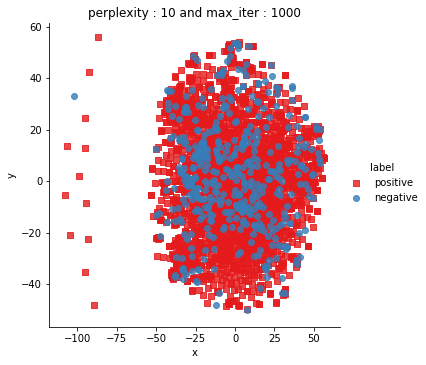

Done

performing tsne with perplexity 20 and with 1000 iterations at max
[t-SNE] Computing 61 nearest neighbors...
[t-SNE] Indexed 3000 samples in 0.338s...
[t-SNE] Computed neighbors for 3000 samples in 28.079s...
[t-SNE] Computed conditional probabilities for sample 1000 / 3000
[t-SNE] Computed conditional probabilities for sample 2000 / 3000
[t-SNE] Computed conditional probabilities for sample 3000 / 3000
[t-SNE] Mean sigma: 1.160506
[t-SNE] Computed conditional probabilities in 0.204s
[t-SNE] Iteration 50: error = 110.1810455, gradient norm = 0.2591425 (50 iterations in 3.059s)
[t-SNE] Iteration 100: error = 114.1649399, gradient norm = 0.2159063 (50 iterations in 3.134s)
[t-SNE] Iteration 150: error = 116.1701660, gradient norm = 0.2002341 (50 iterations in 3.048s)
[t-SNE] Iteration 200: error = 116.4177246, gradient norm = 0.1762965 (50 iterations in 4.084s)
[t-SNE] Iteration 250: error = 117.1279221, gradient norm = 0.2154552 (50 iterations in 3.727s)
[t-SNE] KL divergence afte

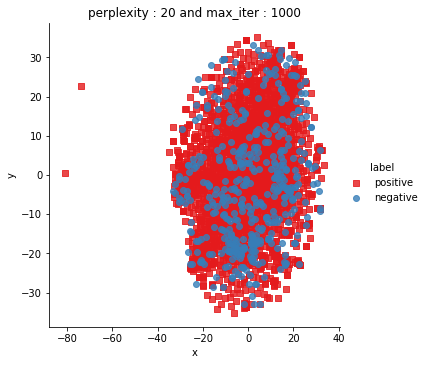

Done

performing tsne with perplexity 50 and with 1000 iterations at max
[t-SNE] Computing 151 nearest neighbors...
[t-SNE] Indexed 3000 samples in 0.445s...
[t-SNE] Computed neighbors for 3000 samples in 30.710s...
[t-SNE] Computed conditional probabilities for sample 1000 / 3000
[t-SNE] Computed conditional probabilities for sample 2000 / 3000
[t-SNE] Computed conditional probabilities for sample 3000 / 3000
[t-SNE] Mean sigma: 1.300978
[t-SNE] Computed conditional probabilities in 0.633s
[t-SNE] Iteration 50: error = 95.4393005, gradient norm = 0.2599095 (50 iterations in 3.804s)
[t-SNE] Iteration 100: error = 101.0332642, gradient norm = 0.2067607 (50 iterations in 3.631s)
[t-SNE] Iteration 150: error = 102.7963409, gradient norm = 0.1858514 (50 iterations in 3.712s)
[t-SNE] Iteration 200: error = 100.0605164, gradient norm = 0.2336643 (50 iterations in 3.948s)
[t-SNE] Iteration 250: error = 103.4605637, gradient norm = 0.1718813 (50 iterations in 3.678s)
[t-SNE] KL divergence afte

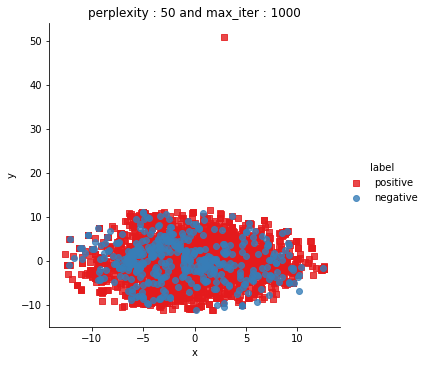

Done


In [32]:
final_den = final_counts.toarray()                                          # converting sparse matrix into array
tsne_perform(X_data = final_den,y_data=label, perplexities =[2,5,10,20,50]) # calling tsne_perform function with different perplexities

##### Observation:
Maximum points are overlapping means both positive and negative reviews have lot of similar words.

# Tfidf for vector featurization of text

In [33]:
tf_idf_vect = TfidfVectorizer(min_df=5)                                # minimum count of word is 5
final_tf_idf = tf_idf_vect.fit_transform(tsne_df['NewCleanedText'].values)
print("the type of count vectorizer ",type(final_tf_idf))
print("the shape of out text TFIDF vectorizer ",final_tf_idf.get_shape())
print("the number of unique words including both unigrams ", final_tf_idf.get_shape()[1])

the type of count vectorizer  <class 'scipy.sparse.csr.csr_matrix'>
the shape of out text TFIDF vectorizer  (3000, 2250)
the number of unique words including both unigrams  2250



performing tsne with perplexity 2 and with 1000 iterations at max
[t-SNE] Computing 7 nearest neighbors...
[t-SNE] Indexed 3000 samples in 0.352s...
[t-SNE] Computed neighbors for 3000 samples in 28.446s...
[t-SNE] Computed conditional probabilities for sample 1000 / 3000
[t-SNE] Computed conditional probabilities for sample 2000 / 3000
[t-SNE] Computed conditional probabilities for sample 3000 / 3000
[t-SNE] Mean sigma: 0.156680
[t-SNE] Computed conditional probabilities in 0.094s
[t-SNE] Iteration 50: error = 112.8498764, gradient norm = 0.1775042 (50 iterations in 2.609s)
[t-SNE] Iteration 100: error = 107.7665787, gradient norm = 0.1701519 (50 iterations in 2.023s)
[t-SNE] Iteration 150: error = 107.0049210, gradient norm = 0.1443551 (50 iterations in 2.085s)
[t-SNE] Iteration 200: error = 105.5074768, gradient norm = 0.1545155 (50 iterations in 1.887s)
[t-SNE] Iteration 250: error = 104.4478760, gradient norm = 0.1839886 (50 iterations in 1.811s)
[t-SNE] KL divergence after 250 i

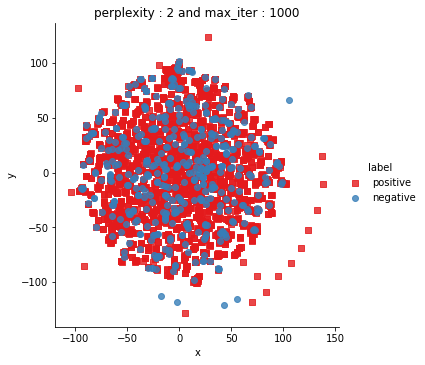

Done

performing tsne with perplexity 5 and with 1000 iterations at max
[t-SNE] Computing 16 nearest neighbors...
[t-SNE] Indexed 3000 samples in 0.335s...
[t-SNE] Computed neighbors for 3000 samples in 31.113s...
[t-SNE] Computed conditional probabilities for sample 1000 / 3000
[t-SNE] Computed conditional probabilities for sample 2000 / 3000
[t-SNE] Computed conditional probabilities for sample 3000 / 3000
[t-SNE] Mean sigma: 0.208245
[t-SNE] Computed conditional probabilities in 0.063s
[t-SNE] Iteration 50: error = 105.0103760, gradient norm = 0.1416416 (50 iterations in 3.340s)
[t-SNE] Iteration 100: error = 105.3443680, gradient norm = 0.1337523 (50 iterations in 2.071s)
[t-SNE] Iteration 150: error = 104.0219498, gradient norm = 0.1394608 (50 iterations in 1.860s)
[t-SNE] Iteration 200: error = 105.1459961, gradient norm = 0.1326534 (50 iterations in 1.660s)
[t-SNE] Iteration 250: error = 106.0570908, gradient norm = 0.0986556 (50 iterations in 1.772s)
[t-SNE] KL divergence after

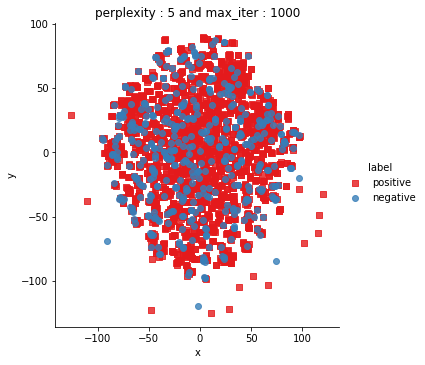

Done

performing tsne with perplexity 10 and with 1000 iterations at max
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 3000 samples in 0.331s...
[t-SNE] Computed neighbors for 3000 samples in 31.816s...
[t-SNE] Computed conditional probabilities for sample 1000 / 3000
[t-SNE] Computed conditional probabilities for sample 2000 / 3000
[t-SNE] Computed conditional probabilities for sample 3000 / 3000
[t-SNE] Mean sigma: 0.241357
[t-SNE] Computed conditional probabilities in 0.075s
[t-SNE] Iteration 50: error = 97.0393524, gradient norm = 0.0932483 (50 iterations in 2.037s)
[t-SNE] Iteration 100: error = 97.2993317, gradient norm = 0.0914365 (50 iterations in 2.797s)
[t-SNE] Iteration 150: error = 97.7109833, gradient norm = 0.0804245 (50 iterations in 2.673s)
[t-SNE] Iteration 200: error = 97.3748016, gradient norm = 0.0899872 (50 iterations in 2.504s)
[t-SNE] Iteration 250: error = 98.4651184, gradient norm = 0.0642756 (50 iterations in 3.143s)
[t-SNE] KL divergence after 250

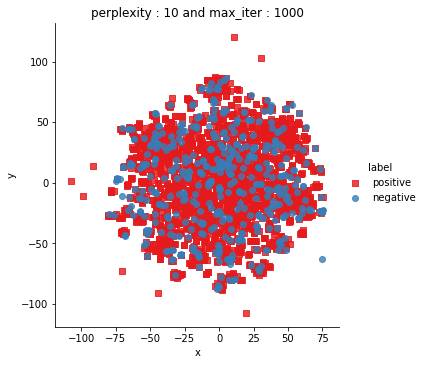

Done

performing tsne with perplexity 20 and with 1000 iterations at max
[t-SNE] Computing 61 nearest neighbors...
[t-SNE] Indexed 3000 samples in 0.387s...
[t-SNE] Computed neighbors for 3000 samples in 28.042s...
[t-SNE] Computed conditional probabilities for sample 1000 / 3000
[t-SNE] Computed conditional probabilities for sample 2000 / 3000
[t-SNE] Computed conditional probabilities for sample 3000 / 3000
[t-SNE] Mean sigma: 0.268022
[t-SNE] Computed conditional probabilities in 0.115s
[t-SNE] Iteration 50: error = 88.5270844, gradient norm = 0.0636906 (50 iterations in 3.898s)
[t-SNE] Iteration 100: error = 88.7892685, gradient norm = 0.0673199 (50 iterations in 3.008s)
[t-SNE] Iteration 150: error = 88.8277969, gradient norm = 0.0749587 (50 iterations in 2.355s)
[t-SNE] Iteration 200: error = 88.3647537, gradient norm = 0.0830940 (50 iterations in 2.164s)
[t-SNE] Iteration 250: error = 88.0889053, gradient norm = 0.0950053 (50 iterations in 2.272s)
[t-SNE] KL divergence after 250

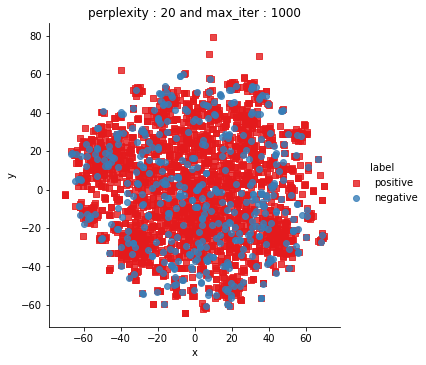

Done

performing tsne with perplexity 50 and with 1000 iterations at max
[t-SNE] Computing 151 nearest neighbors...
[t-SNE] Indexed 3000 samples in 0.351s...
[t-SNE] Computed neighbors for 3000 samples in 33.419s...
[t-SNE] Computed conditional probabilities for sample 1000 / 3000
[t-SNE] Computed conditional probabilities for sample 2000 / 3000
[t-SNE] Computed conditional probabilities for sample 3000 / 3000
[t-SNE] Mean sigma: 0.291615
[t-SNE] Computed conditional probabilities in 0.320s
[t-SNE] Iteration 50: error = 76.8151855, gradient norm = 0.0420949 (50 iterations in 8.204s)
[t-SNE] Iteration 100: error = 76.9213791, gradient norm = 0.0426883 (50 iterations in 7.966s)
[t-SNE] Iteration 150: error = 76.9441299, gradient norm = 0.0576839 (50 iterations in 9.615s)
[t-SNE] Iteration 200: error = 76.9291000, gradient norm = 0.0719656 (50 iterations in 6.891s)
[t-SNE] Iteration 250: error = 76.8656006, gradient norm = 0.0455381 (50 iterations in 8.448s)
[t-SNE] KL divergence after 25

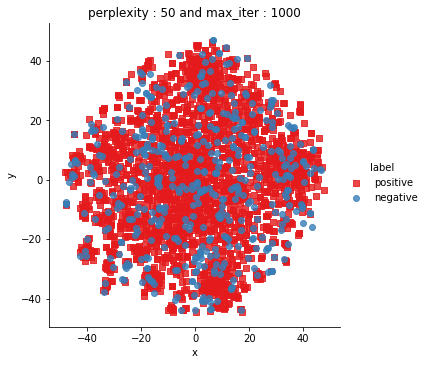

Done


In [34]:
final_den = final_tf_idf.toarray()                                          # sparse matrix to array conversion
tsne_perform(X_data = final_den,y_data=label, perplexities =[2,5,10,20,50])

### Observation
Tried different perplexities but 
Maximum points are overlapping means both positive and negative reviews have lot of similar words.

# Avg W2V for featurization of Text

In [35]:
from sklearn.externals import joblib           # importing joblib to load our trained model
filename = 'trained_w2v_model.sav'
# load the model from disk
w2v_model = joblib.load(filename)    
w2v_words = list(w2v_model.wv.vocab)

sent_vectors = [];                             # the avg-w2v for each sentence/review is stored in this list
for sent in tsne_df['NewCleanedText'].values:     # for each review/sentence
    sent_vec = np.zeros(50)                    # as word vectors are of zero length
    cnt_words =0;                              # num of words with a valid vector in the sentence/review
    for word in sent:                          # for each word in a review/sentence
        if word in w2v_words:
            vec = w2v_model.wv[word]           # obtaining vector for word
            sent_vec += vec
            cnt_words += 1
    if cnt_words != 0:
        sent_vec /= cnt_words
    sent_vectors.append(sent_vec)
print(len(sent_vectors))
print(len(sent_vectors[0]))

3000
50



performing tsne with perplexity 2 and with 1000 iterations at max
[t-SNE] Computing 7 nearest neighbors...
[t-SNE] Indexed 3000 samples in 0.023s...
[t-SNE] Computed neighbors for 3000 samples in 0.894s...
[t-SNE] Computed conditional probabilities for sample 1000 / 3000
[t-SNE] Computed conditional probabilities for sample 2000 / 3000
[t-SNE] Computed conditional probabilities for sample 3000 / 3000
[t-SNE] Mean sigma: 0.000000
[t-SNE] Computed conditional probabilities in 0.050s
[t-SNE] Iteration 50: error = 182.3145142, gradient norm = 0.1012655 (50 iterations in 2.282s)
[t-SNE] Iteration 100: error = 139.2046051, gradient norm = 0.3028346 (50 iterations in 2.022s)
[t-SNE] Iteration 150: error = 167.0861206, gradient norm = 0.1452187 (50 iterations in 2.887s)
[t-SNE] Iteration 200: error = 147.0607300, gradient norm = 0.3946401 (50 iterations in 2.074s)
[t-SNE] Iteration 250: error = 159.2216339, gradient norm = 0.2507749 (50 iterations in 1.836s)
[t-SNE] KL divergence after 250 it

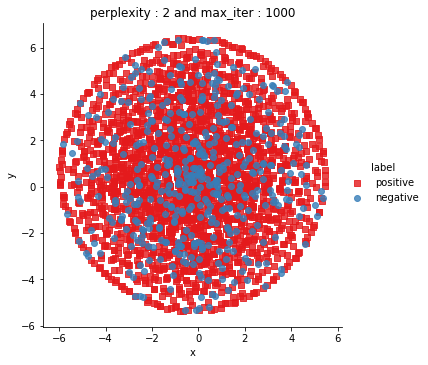

Done

performing tsne with perplexity 5 and with 1000 iterations at max
[t-SNE] Computing 16 nearest neighbors...
[t-SNE] Indexed 3000 samples in 0.019s...
[t-SNE] Computed neighbors for 3000 samples in 0.797s...
[t-SNE] Computed conditional probabilities for sample 1000 / 3000
[t-SNE] Computed conditional probabilities for sample 2000 / 3000
[t-SNE] Computed conditional probabilities for sample 3000 / 3000
[t-SNE] Mean sigma: 0.000000
[t-SNE] Computed conditional probabilities in 0.142s
[t-SNE] Iteration 50: error = 149.9443359, gradient norm = 0.3162207 (50 iterations in 1.676s)
[t-SNE] Iteration 100: error = 145.4016113, gradient norm = 0.3068504 (50 iterations in 1.858s)
[t-SNE] Iteration 150: error = 140.5584259, gradient norm = 0.3066628 (50 iterations in 1.991s)
[t-SNE] Iteration 200: error = 147.9611206, gradient norm = 0.3681248 (50 iterations in 1.987s)
[t-SNE] Iteration 250: error = 138.5913239, gradient norm = 0.3799522 (50 iterations in 1.938s)
[t-SNE] KL divergence after 

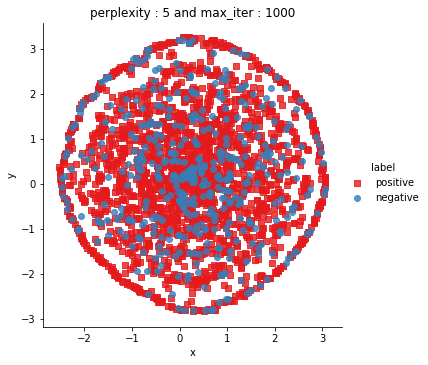

Done

performing tsne with perplexity 10 and with 1000 iterations at max
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 3000 samples in 0.019s...
[t-SNE] Computed neighbors for 3000 samples in 0.776s...
[t-SNE] Computed conditional probabilities for sample 1000 / 3000
[t-SNE] Computed conditional probabilities for sample 2000 / 3000
[t-SNE] Computed conditional probabilities for sample 3000 / 3000
[t-SNE] Mean sigma: 0.000000
[t-SNE] Computed conditional probabilities in 0.178s
[t-SNE] Iteration 50: error = 122.1147385, gradient norm = 0.2994121 (50 iterations in 1.949s)
[t-SNE] Iteration 100: error = 134.6206360, gradient norm = 0.2612277 (50 iterations in 1.959s)
[t-SNE] Iteration 150: error = 137.3288116, gradient norm = 0.2953711 (50 iterations in 1.807s)
[t-SNE] Iteration 200: error = 140.0890503, gradient norm = 0.3427531 (50 iterations in 1.526s)
[t-SNE] Iteration 250: error = 130.9080505, gradient norm = 0.3815444 (50 iterations in 1.400s)
[t-SNE] KL divergence after

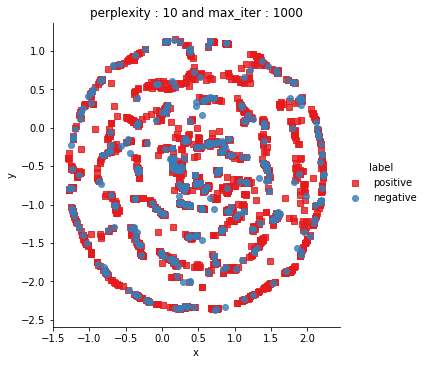

Done

performing tsne with perplexity 20 and with 1000 iterations at max
[t-SNE] Computing 61 nearest neighbors...
[t-SNE] Indexed 3000 samples in 0.019s...
[t-SNE] Computed neighbors for 3000 samples in 0.771s...
[t-SNE] Computed conditional probabilities for sample 1000 / 3000
[t-SNE] Computed conditional probabilities for sample 2000 / 3000
[t-SNE] Computed conditional probabilities for sample 3000 / 3000
[t-SNE] Mean sigma: 0.000000
[t-SNE] Computed conditional probabilities in 0.340s
[t-SNE] Iteration 50: error = 119.3763199, gradient norm = 0.3491831 (50 iterations in 2.000s)
[t-SNE] Iteration 100: error = 122.7082901, gradient norm = 0.3793776 (50 iterations in 1.818s)
[t-SNE] Iteration 150: error = 127.1670303, gradient norm = 0.2875644 (50 iterations in 1.705s)
[t-SNE] Iteration 200: error = 131.6281738, gradient norm = 0.2749820 (50 iterations in 1.850s)
[t-SNE] Iteration 250: error = 128.0964661, gradient norm = 0.2956438 (50 iterations in 2.037s)
[t-SNE] KL divergence after

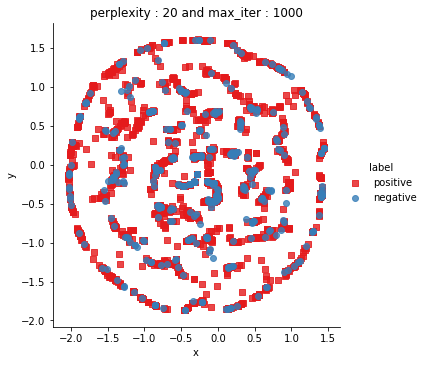

Done

performing tsne with perplexity 30 and with 1000 iterations at max
[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 3000 samples in 0.014s...
[t-SNE] Computed neighbors for 3000 samples in 0.582s...
[t-SNE] Computed conditional probabilities for sample 1000 / 3000
[t-SNE] Computed conditional probabilities for sample 2000 / 3000
[t-SNE] Computed conditional probabilities for sample 3000 / 3000
[t-SNE] Mean sigma: 0.000000
[t-SNE] Computed conditional probabilities in 0.373s
[t-SNE] Iteration 50: error = 116.3812103, gradient norm = 0.3366883 (50 iterations in 1.675s)
[t-SNE] Iteration 100: error = 116.9161911, gradient norm = 0.3190668 (50 iterations in 1.614s)
[t-SNE] Iteration 150: error = 117.1279449, gradient norm = 0.3227388 (50 iterations in 1.740s)
[t-SNE] Iteration 200: error = 118.8151016, gradient norm = 0.3406333 (50 iterations in 1.609s)
[t-SNE] Iteration 250: error = 114.9864349, gradient norm = 0.2794655 (50 iterations in 2.158s)
[t-SNE] KL divergence after

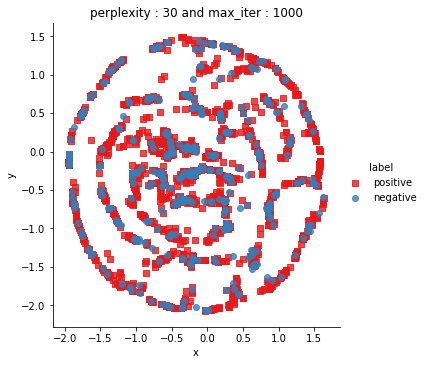

Done

performing tsne with perplexity 40 and with 1000 iterations at max
[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 3000 samples in 0.019s...
[t-SNE] Computed neighbors for 3000 samples in 0.800s...
[t-SNE] Computed conditional probabilities for sample 1000 / 3000
[t-SNE] Computed conditional probabilities for sample 2000 / 3000
[t-SNE] Computed conditional probabilities for sample 3000 / 3000
[t-SNE] Mean sigma: 0.000000
[t-SNE] Computed conditional probabilities in 0.659s
[t-SNE] Iteration 50: error = 107.8096390, gradient norm = 0.3381878 (50 iterations in 2.448s)
[t-SNE] Iteration 100: error = 111.9007339, gradient norm = 0.3175698 (50 iterations in 2.405s)
[t-SNE] Iteration 150: error = 114.4618149, gradient norm = 0.2784444 (50 iterations in 2.440s)
[t-SNE] Iteration 200: error = 111.5433502, gradient norm = 0.3426863 (50 iterations in 1.706s)
[t-SNE] Iteration 250: error = 116.0094452, gradient norm = 0.3334729 (50 iterations in 2.001s)
[t-SNE] KL divergence afte

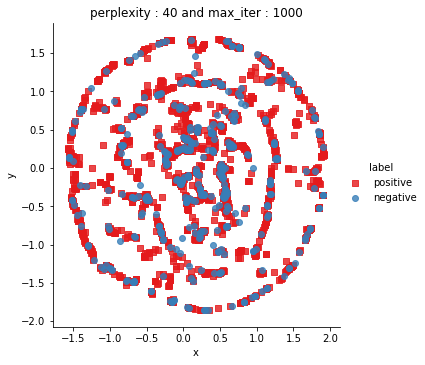

Done


In [36]:
tsne_perform(X_data = sent_vectors,y_data=label, perplexities =[2,5,10,20,30,40])

### Observation

1. On perplexity of 2 we get some negative reviews at the center of the cluster but maximum are overlapping.

2.Tried different perplexities but maximum points are overlapping means both positive and negative reviews have lots of    similiar word.Do not get any separate cluster so we need to perform on  more data to get some good results.

# Tfidf-W2V as featurization of text

In [37]:
tfidf_feature = tf_idf_vect.get_feature_names()    # tfidf words/col-names
# final_tf_idf is the sparse matrix with row= sentence, col=word and cell_val = tfidf
tfidf_sent_vectors = [];                           # the tfidf-w2v for each sentence/review is stored in this list
row=0;
for sent in tsne_df['NewCleanedText']:                # for each review/sentence 
    sent_vec = np.zeros(50)                        # as word vectors are of zero length
    weight_sum =0;                                 # num of words with a valid vector in the sentence/review
    for word in sent:
        try:
            if word in w2v_words:                  # obtain the tf_idfidf of a word in a sentence/review
                vec = w2v_model.wv[word]
                tf_idf = final_tf_idf[row, tfidf_feature.index(word)]
                sent_vec += (vec * tf_idf)
                weight_sum += tf_idf
               # for each word in a review/sentence
        except:
            pass
    if weight_sum != 0:
        sent_vec /= weight_sum
    tfidf_sent_vectors.append(sent_vec)
    row += 1
print(len(tfidf_sent_vectors))
print(len(tfidf_sent_vectors[0]))

3000
50



performing tsne with perplexity 2 and with 1000 iterations at max
[t-SNE] Computing 7 nearest neighbors...
[t-SNE] Indexed 3000 samples in 0.015s...
[t-SNE] Computed neighbors for 3000 samples in 0.572s...
[t-SNE] Computed conditional probabilities for sample 1000 / 3000
[t-SNE] Computed conditional probabilities for sample 2000 / 3000
[t-SNE] Computed conditional probabilities for sample 3000 / 3000
[t-SNE] Mean sigma: 0.000000
[t-SNE] Computed conditional probabilities in 0.035s
[t-SNE] Iteration 50: error = 172.3494720, gradient norm = 0.0984552 (50 iterations in 1.270s)
[t-SNE] Iteration 100: error = 160.6584167, gradient norm = 0.3132271 (50 iterations in 1.379s)
[t-SNE] Iteration 150: error = 171.4369965, gradient norm = 0.2989483 (50 iterations in 1.743s)
[t-SNE] Iteration 200: error = 179.5099182, gradient norm = 0.1194180 (50 iterations in 2.107s)
[t-SNE] Iteration 250: error = 158.9406128, gradient norm = 0.3546710 (50 iterations in 1.733s)
[t-SNE] KL divergence after 250 it

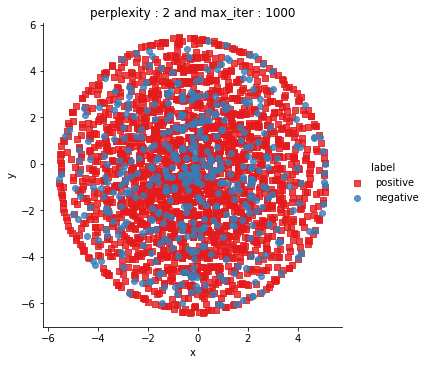

Done

performing tsne with perplexity 5 and with 1000 iterations at max
[t-SNE] Computing 16 nearest neighbors...
[t-SNE] Indexed 3000 samples in 0.018s...
[t-SNE] Computed neighbors for 3000 samples in 0.754s...
[t-SNE] Computed conditional probabilities for sample 1000 / 3000
[t-SNE] Computed conditional probabilities for sample 2000 / 3000
[t-SNE] Computed conditional probabilities for sample 3000 / 3000
[t-SNE] Mean sigma: 0.000000
[t-SNE] Computed conditional probabilities in 0.106s
[t-SNE] Iteration 50: error = 159.0740051, gradient norm = 0.2508991 (50 iterations in 1.536s)
[t-SNE] Iteration 100: error = 159.1184998, gradient norm = 0.2555900 (50 iterations in 1.971s)
[t-SNE] Iteration 150: error = 151.1106873, gradient norm = 0.2114091 (50 iterations in 2.175s)
[t-SNE] Iteration 200: error = 146.1187744, gradient norm = 0.3621366 (50 iterations in 2.509s)
[t-SNE] Iteration 250: error = 148.6670532, gradient norm = 0.1651499 (50 iterations in 1.286s)
[t-SNE] KL divergence after 

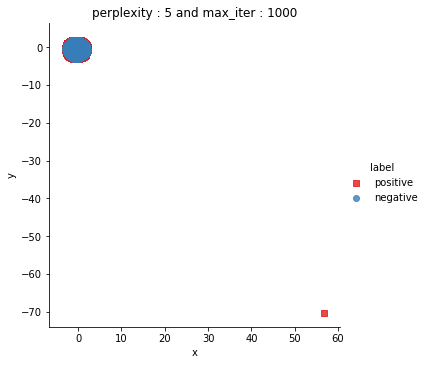

Done

performing tsne with perplexity 10 and with 1000 iterations at max
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 3000 samples in 0.018s...
[t-SNE] Computed neighbors for 3000 samples in 0.756s...
[t-SNE] Computed conditional probabilities for sample 1000 / 3000
[t-SNE] Computed conditional probabilities for sample 2000 / 3000
[t-SNE] Computed conditional probabilities for sample 3000 / 3000
[t-SNE] Mean sigma: 0.000000
[t-SNE] Computed conditional probabilities in 0.207s
[t-SNE] Iteration 50: error = 128.6698303, gradient norm = 0.2583085 (50 iterations in 1.758s)
[t-SNE] Iteration 100: error = 129.3685150, gradient norm = 0.2171733 (50 iterations in 1.861s)
[t-SNE] Iteration 150: error = 136.5000458, gradient norm = 0.3572292 (50 iterations in 1.698s)
[t-SNE] Iteration 200: error = 139.2862244, gradient norm = 0.3279386 (50 iterations in 1.378s)
[t-SNE] Iteration 250: error = 144.6203766, gradient norm = 0.2655600 (50 iterations in 1.496s)
[t-SNE] KL divergence after

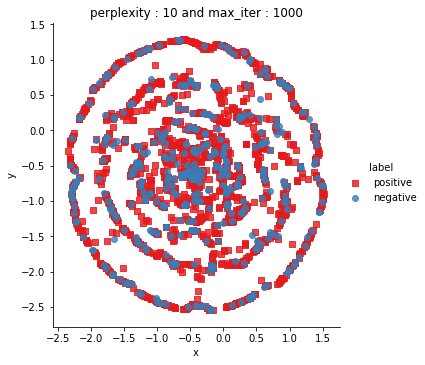

Done

performing tsne with perplexity 20 and with 1000 iterations at max
[t-SNE] Computing 61 nearest neighbors...
[t-SNE] Indexed 3000 samples in 0.013s...
[t-SNE] Computed neighbors for 3000 samples in 0.578s...
[t-SNE] Computed conditional probabilities for sample 1000 / 3000
[t-SNE] Computed conditional probabilities for sample 2000 / 3000
[t-SNE] Computed conditional probabilities for sample 3000 / 3000
[t-SNE] Mean sigma: 0.000000
[t-SNE] Computed conditional probabilities in 0.277s
[t-SNE] Iteration 50: error = 116.9418945, gradient norm = 0.3162320 (50 iterations in 1.539s)
[t-SNE] Iteration 100: error = 126.8248901, gradient norm = 0.2702463 (50 iterations in 1.487s)
[t-SNE] Iteration 150: error = 127.1957397, gradient norm = 0.3340038 (50 iterations in 1.582s)
[t-SNE] Iteration 200: error = 124.9782181, gradient norm = 0.3329211 (50 iterations in 1.865s)
[t-SNE] Iteration 250: error = 126.7701797, gradient norm = 0.2929538 (50 iterations in 1.807s)
[t-SNE] KL divergence after

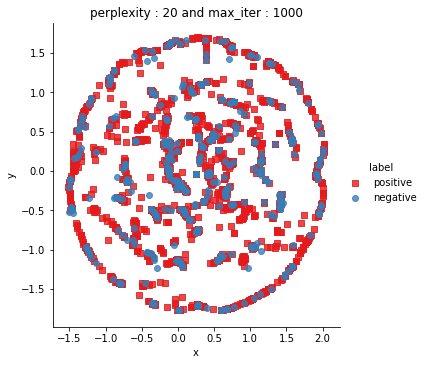

Done

performing tsne with perplexity 30 and with 1000 iterations at max
[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 3000 samples in 0.021s...
[t-SNE] Computed neighbors for 3000 samples in 0.797s...
[t-SNE] Computed conditional probabilities for sample 1000 / 3000
[t-SNE] Computed conditional probabilities for sample 2000 / 3000
[t-SNE] Computed conditional probabilities for sample 3000 / 3000
[t-SNE] Mean sigma: 0.000000
[t-SNE] Computed conditional probabilities in 0.535s
[t-SNE] Iteration 50: error = 113.1206131, gradient norm = 0.2870741 (50 iterations in 2.499s)
[t-SNE] Iteration 100: error = 117.5054474, gradient norm = 0.2869161 (50 iterations in 2.445s)
[t-SNE] Iteration 150: error = 116.6593246, gradient norm = 0.2957361 (50 iterations in 2.505s)
[t-SNE] Iteration 200: error = 116.4553604, gradient norm = 0.3196185 (50 iterations in 2.374s)
[t-SNE] Iteration 250: error = 118.3716202, gradient norm = 0.3096354 (50 iterations in 2.290s)
[t-SNE] KL divergence after

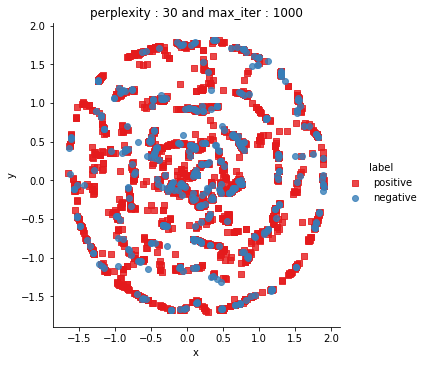

Done

performing tsne with perplexity 40 and with 1000 iterations at max
[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 3000 samples in 0.015s...
[t-SNE] Computed neighbors for 3000 samples in 0.591s...
[t-SNE] Computed conditional probabilities for sample 1000 / 3000
[t-SNE] Computed conditional probabilities for sample 2000 / 3000
[t-SNE] Computed conditional probabilities for sample 3000 / 3000
[t-SNE] Mean sigma: 0.000000
[t-SNE] Computed conditional probabilities in 0.490s
[t-SNE] Iteration 50: error = 114.1272049, gradient norm = 0.3213489 (50 iterations in 1.937s)
[t-SNE] Iteration 100: error = 110.6263123, gradient norm = 0.3083878 (50 iterations in 1.787s)
[t-SNE] Iteration 150: error = 110.9899368, gradient norm = 0.3098981 (50 iterations in 1.786s)
[t-SNE] Iteration 200: error = 111.4997864, gradient norm = 0.3137028 (50 iterations in 2.449s)
[t-SNE] Iteration 250: error = 112.6963577, gradient norm = 0.3426023 (50 iterations in 2.464s)
[t-SNE] KL divergence afte

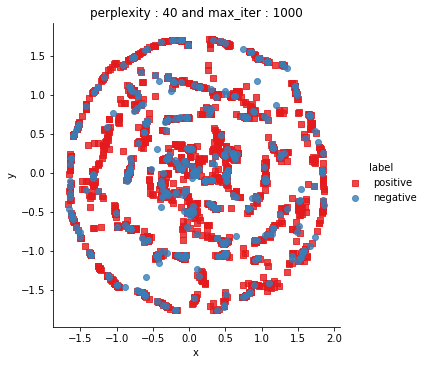

Done


In [38]:
tsne_perform(X_data = tfidf_sent_vectors,y_data=label, perplexities =[2,5,10,20,30,40])

### Observation
1.On perplexity of 5 ,Tsne shrinked the cluster,and both classses are almost fully overlapping.

2.maximum reviews are overlapping ,we need to perform tsne on more data.

### Freeing Memory

In [39]:
del tfidf_sent_vectors,sent_vectors,final_den,final_tf_idf,final_counts,tsne_df

# --------------------------------------------------------------------------------------------------------

## Taking sample of 100k Reviews 

In [4]:
df_100k = final.sample(n = 100000,random_state = 123)
final_100k = df_100k.sort_values('Time')               # sorting according to time for Time based spliting
print(final_100k['Score'].value_counts())
y = final_100k['Score'].values
final_100k.head(1)

positive    84404
negative    15596
Name: Score, dtype: int64


,level_0,index,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text,NewCleanedText,NewCleanedSummary,Text_length,Summary_length
0,0,138706,150524,0006641040,ACITT7DI6IDDL,shari zychinski,0,0,positive,939340800,EVERY book is educational,this witty little book makes my son laugh at l...,b'witti littl book make son laugh loud recit c...,b'everi book educ',74,4


##### The number of positive reviews are more as comapred to negative reviews ,so our data is imbalanced 

### Train Test Split of final_100k

In [5]:
from sklearn.preprocessing import LabelEncoder
labelencoder_X=LabelEncoder()
y = labelencoder_X.fit_transform(y)
from sklearn.model_selection import train_test_split,StratifiedKFold
X_train, X_test, y_train, y_test = train_test_split(final_100k, y,stratify=y, test_size = 0.20, random_state = 123) # create four variable

In [5]:
print('Number of data points in train data:', X_train.shape[0])
print('Number of data points in test data:', X_test.shape[0])

Number of data points in train data: 80000
Number of data points in test data: 20000


In [6]:
# This function plots the confusion matrices
def plot_confusion_matrix(y_test, y_predict):
    C = confusion_matrix(y_test, y_predict)
    # C = 2,2 matrix, each cell (i,j) represents number of points of class i are predicted class j
    A =(((C.T)/(C.sum(axis=1))).T)
    #divid each element of the confusion matrix with the sum of elements in that column
    B =(C/C.sum(axis=0))
    plt.figure(figsize=(20,4))
    
    labels = [0,1]         
    # representing A in heatmap format
    cmap=sns.light_palette("green")
    plt.subplot(1, 3, 1)
    sns.heatmap(C, annot=True, cmap=cmap, fmt=".3f", xticklabels=labels, yticklabels=labels)
    plt.xlabel('Predicted Class')
    plt.ylabel('Original Class')
    plt.title("Confusion matrix")
    
    plt.subplot(1, 3, 2)
    sns.heatmap(B, annot=True, cmap=cmap, fmt=".3f", xticklabels=labels, yticklabels=labels)
    plt.xlabel('Predicted Class')
    plt.ylabel('Original Class')
    plt.title("Precision matrix")
    
    plt.subplot(1, 3, 3)
    # representing B in heatmap format
    sns.heatmap(A, annot=True, cmap=cmap, fmt=".3f", xticklabels=labels, yticklabels=labels)
    plt.xlabel('Predicted Class')
    plt.ylabel('Original Class')
    plt.title("Recall matrix")
    
    plt.show()

### BOW on CleanedText

In [6]:
# building a CountVectorizer with all the words that occured minimum 5 times in train data
text_bow_vectorizer = CountVectorizer(min_df = 5)
train_bow_text_feature_onehotCoding = text_bow_vectorizer.fit_transform(X_train['NewCleanedText'])
# getting all the feature names (words)
train_bow_text_features= text_bow_vectorizer.get_feature_names()
# train_text_feature_onehotCoding.sum(axis=0).A1 will sum every row and returns (1*number of features) vector
train_bow_text_fea_counts = train_bow_text_feature_onehotCoding.sum(axis=0).A1
# zip(list(text_features),text_fea_counts) will zip a word with its number of times it occured
text_bow_fea_dict = dict(zip(list(train_bow_text_features),train_bow_text_fea_counts))
# we use the same vectorizer that was trained on train data
test_bow_text_feature_onehotCoding = text_bow_vectorizer.transform(X_test['NewCleanedText'])
print("Total number of unique words in train text data :", len(train_bow_text_features))

Total number of unique words in train text data : 10700


In [7]:
# normalize train text features
train_bow_text_feature_onehotCoding = normalize(train_bow_text_feature_onehotCoding, axis=0)
# normalize test text features
test_bow_text_feature_onehotCoding = normalize(test_bow_text_feature_onehotCoding, axis=0)

# Applying different models on our BOW features of Text and Summary

## Naive Bayes on only Text Data

#### Grid Search on alpha

alpha = (Additive (Laplace/Lidstone) smoothing parameter (0 for no smoothing))

Classifier used here is Multinomial Naive Bayes.

10-fold cross validation and scoring is negative log loss
    

In [13]:
start = time.time()                                                      # starting time
clf= MultinomialNB()                                                     # create a object of multinomial classifier
grid_parameters = {'alpha':[ 0.0001, 0.001, 0.1, 1,1.1,1.5]}             ## alpha is the parameter to search by grid
grid_search = GridSearchCV(clf, grid_parameters, cv=10,scoring="neg_log_loss",n_jobs=-1)  # creating gridsearch object with parameter as log loss,and 10 fold cross validation 
grid_result = grid_search.fit(train_bow_text_feature_onehotCoding,y_train)                         # fitting grid object on train data
print("GridSearch Time: ",(time.time() - start))


GridSearch Time:  3.76759672164917


### Plot : alpha vs Log Loss

Best: 0.386156 using {'alpha': 0.1}
0.423850 (0.006808) with: {'alpha': 0.0001}
0.407959 (0.004936) with: {'alpha': 0.001}
0.386156 (0.001804) with: {'alpha': 0.1}
0.396445 (0.001313) with: {'alpha': 1}
0.397436 (0.001321) with: {'alpha': 1.1}
0.400943 (0.001329) with: {'alpha': 1.5}


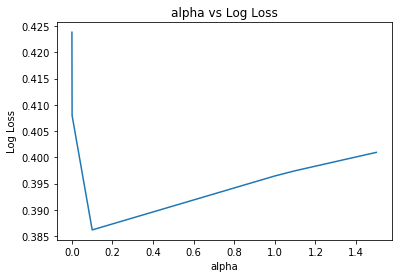

In [14]:
# summarize results
print("Best: %f using %s" % (-grid_result.best_score_, grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (-mean, stdev, param))
# plot
plt.errorbar([ 0.0001, 0.001, 0.1, 1,1.1,1.5], -means)
plt.title("alpha vs Log Loss")
plt.xlabel('alpha')
plt.ylabel('Log Loss')
plt.show()

Best aplha is 0.1 and log loss is 0.386156

### Training model using best alpha

#### Accuracy and Log Loss

In [15]:
optimal_i=0.1
nb = MultinomialNB(alpha=optimal_i)
# fitting the model
nb.fit(train_bow_text_feature_onehotCoding, y_train)
pred = nb.predict(train_bow_text_feature_onehotCoding)
# evaluate accuracy
acc = accuracy_score(y_train, pred) * 100
print('\nThe Train accuracy of the NB classifier for i = %d is %f%%' % (optimal_i, acc))
# predict the response
pred = nb.predict(test_bow_text_feature_onehotCoding)
# evaluate accuracy
acc = accuracy_score(y_test, pred) * 100
print('\nThe Test accuracy of the NB classifier for i = %d is %f%%' % (optimal_i, acc))
print('***************************************************')
predict_y = nb.predict_proba(train_bow_text_feature_onehotCoding)
print('GridSearch')
print("The train log loss is:",log_loss(y_train, predict_y, labels=nb.classes_, eps=1e-15))
predict_y = nb.predict_proba(test_bow_text_feature_onehotCoding)
print("The test log loss is:",log_loss(y_test, predict_y, labels=nb.classes_, eps=1e-15))



The Train accuracy of the NB classifier for i = 0 is 85.046250%

The Test accuracy of the NB classifier for i = 0 is 85.425000%
***************************************************
GridSearch
The train log loss is: 0.361489200087982
The test log loss is: 0.36036087694906016


Both train and test loss are almost equal means we are not overfitting

### F1 Score ,Classification report and Confusion matrix

F1 Score:  0.920130421678494
              precision    recall  f1-score   support

           0       0.77      0.09      0.17      3119
           1       0.86      0.99      0.92     16881

   micro avg       0.85      0.85      0.85     20000
   macro avg       0.81      0.54      0.54     20000
weighted avg       0.84      0.85      0.80     20000

******************************************


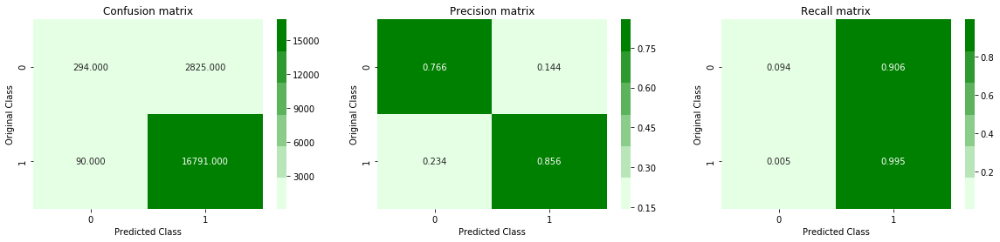

In [16]:
print("F1 Score: ",f1_score(y_test,pred))
print(classification_report(y_test, pred))


print("******************************************")
plot_confusion_matrix(y_test, pred)


Precision for class 0 is good but recall in not good 

### Testing model with class probabilities

In [17]:
test_point_ind = 1
no_feature = 100
predicted_cls = nb.predict(test_bow_text_feature_onehotCoding[test_point_ind])
print("Actual Class :", y_test[test_point_ind])
print("Predicted Class :", predicted_cls[0])
print("Predicted Class Probabilities:", np.round(nb.predict_proba(test_bow_text_feature_onehotCoding[test_point_ind]),4))


Actual Class : 1
Predicted Class : 1
Predicted Class Probabilities: [[0.0602 0.9398]]


### AUC 

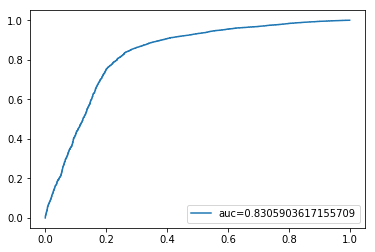

In [18]:
y_pred_proba = nb.predict_proba(test_bow_text_feature_onehotCoding)[::,1]
fpr, tpr, _ = metrics.roc_curve(y_test,  y_pred_proba)
auc = metrics.roc_auc_score(y_test, y_pred_proba)
plt.plot(fpr,tpr,label="auc="+str(auc))
plt.legend(loc=4)
plt.show()

### Top positive and negative word

In [19]:
pos_class_prob_sorted = nb.feature_log_prob_[0, :].argsort()
neg_class_prob_sorted = nb.feature_log_prob_[1, :].argsort()
topn = neg_class_prob_sorted[:10]
topp = pos_class_prob_sorted[:10]

terms = text_bow_vectorizer.get_feature_names()
ter= summary_vectorizer.get_feature_names()
print('*********Neagative words  ****')
for ind in topn:
    if ind < len(ter)+1:
        print(' ',ter[ind])
    if ind < len(terms) + 1:
        print(' ',terms[ind])
print('*******positive words   ******')    
for ind in topp:
    if ind < len(ter)+1:
        print(ter[ind])
    if ind < len(terms) + 1:
        print(terms[ind])

*********Neagative words  ****
  martek
  liar
  summer
  disruptor
  font
  inexcus
  misrepres
  petrolatum
  wasp
  misrepresent
  lesion
*******positive words   ******
abl
aafco
trio
dulc
simplest
tripl
duls
tropic
dummi
sill
trust
dunde
trident
duke
tube
duo
silken


## Improving model by taking more data,summary features and using bi-gram

Taking whole data we have in our original dataframe

Bi-gram is used to retain some of sematic meaning of the words

In [8]:
final_all = final.sort_values('Time')          # sorting the data for Time based splitting

y = final_all['Score'].values                          # taking score value as dependent variable

from sklearn.preprocessing import LabelEncoder         # importing label encoder to encode our y values as 0 or 1
labelencoder_X=LabelEncoder()                          # creating object of label encoder
y = labelencoder_X.fit_transform(y)                    #fitting label encoder object on y
from sklearn.model_selection import train_test_split,StratifiedKFold      # importing train test split from model selection 
# create four variable with test size 20%
X_Train, X_Test, Y_train, Y_test = train_test_split(final_all, y,stratify=y, test_size = 0.20, random_state = 123) 

In [9]:
# building a CountVectorizer with all the words that occured minimum 10 times in train data
Text_bow_vectorizer = CountVectorizer(ngram_range=(1, 2),min_df = 25)
Train_bow_text_feature_onehotCoding = Text_bow_vectorizer.fit_transform(X_Train['NewCleanedText'])
# getting all the feature names (words)
Train_bow_text_features= Text_bow_vectorizer.get_feature_names()
# train_text_feature_onehotCoding.sum(axis=0).A1 will sum every row and returns (1*number of features) vector
Train_bow_text_fea_counts = Train_bow_text_feature_onehotCoding.sum(axis=0).A1
# zip(list(text_features),text_fea_counts) will zip a word with its number of times it occured
Text_bow_fea_dict = dict(zip(list(Train_bow_text_features),Train_bow_text_fea_counts))
# we use the same vectorizer that was trained on train data
Test_bow_text_feature_onehotCoding = Text_bow_vectorizer.transform(X_Test['NewCleanedText'].values)
print("Total number of unique words in train text data :", len(Train_bow_text_features))


# normalize train text features
Train_bow_text_feature_onehotCoding = normalize(Train_bow_text_feature_onehotCoding, axis=0)
# normalize test text features
Test_bow_text_feature_onehotCoding = normalize(Test_bow_text_feature_onehotCoding, axis=0)

Total number of unique words in train text data : 67175


In [10]:
Summary_vectorizer = CountVectorizer(ngram_range=(1,2),min_df = 5)
Train_summary_feature_onehotCoding = Summary_vectorizer.fit_transform(X_Train['NewCleanedSummary'])
Train_summary_features= Summary_vectorizer.get_feature_names()
# we use the same vectorizer that was trained on train data
Test_summary_feature_onehotCoding = Summary_vectorizer.transform(X_Test['NewCleanedSummary'])
print("Total number of unique words in summary train data :", len(Train_summary_features))

# normalize summary feature
Train_summary_feature_onehotCoding = normalize(Train_summary_feature_onehotCoding, axis=0)
# normalize summary feature
Test_summary_feature_onehotCoding = normalize(Test_summary_feature_onehotCoding, axis=0)

Total number of unique words in summary train data : 20901


In [11]:
# combining the text and summary features
Train_bow = hstack((Train_summary_feature_onehotCoding, Train_bow_text_feature_onehotCoding)).tocsr()
Test_bow = hstack((Test_summary_feature_onehotCoding, Test_bow_text_feature_onehotCoding)).tocsr()

### Naive Bayes on text and summary features with bi gram

#### Grid Search on alpha

In [35]:
start = time.time()                                                      # starting time
clf= MultinomialNB()                                                     # create a object of multinomial classifier
grid_parameters = {'alpha':[ 0.0001, 0.001, 0.1, 1,1.1,1.5]}             ## alpha is the parameter to search by grid
grid_search = GridSearchCV(clf, grid_parameters, cv=10,scoring="neg_log_loss",n_jobs=-1)  # creating gridsearch object with parameter as log loss,and 10 fold cross validation 
grid_result = grid_search.fit(Train_bow,Y_train)                         # fitting grid object on train data
print("GridSearch Time: ",(time.time() - start))

GridSearch Time:  26.870400428771973


Best: 0.254676 using {'alpha': 0.1}
0.271054 (0.002095) with: {'alpha': 0.0001}
0.259021 (0.001711) with: {'alpha': 0.001}
0.254676 (0.001339) with: {'alpha': 0.1}
0.298426 (0.001126) with: {'alpha': 1}
0.301639 (0.001109) with: {'alpha': 1.1}
0.312879 (0.001045) with: {'alpha': 1.5}


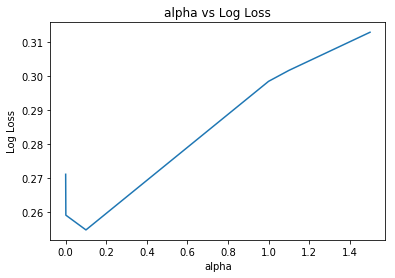

In [36]:
# summarize results
print("Best: %f using %s" % (-grid_result.best_score_, grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (-mean, stdev, param))
# plot
plt.errorbar([ 0.0001, 0.001, 0.1, 1,1.1,1.5], -means)
plt.title("alpha vs Log Loss")
plt.xlabel('alpha')
plt.ylabel('Log Loss')
plt.show()

Best alpha is 0.1 and corresponding log loss is 0.254676

### Training model on best alpha value

#### Accuracy and Log Loss

In [37]:
optimal_i=0.1
nb = MultinomialNB(alpha=optimal_i)
# fitting the model
nb.fit(Train_bow, Y_train)
pred = nb.predict(Train_bow)
# evaluate accuracy
acc = accuracy_score(Y_train, pred) * 100
print('\nThe Train accuracy of the NB classifier for i = %d is %f%%' % (optimal_i, acc))
# predict the response
pred = nb.predict(Test_bow)
# evaluate accuracy
acc = accuracy_score(Y_test, pred) * 100
print('\nThe Test accuracy of the NB classifier for i = %d is %f%%' % (optimal_i, acc))
print('***************************************************')
predict_y = nb.predict_proba(Train_bow)
print('GridSearch')
print("The train log loss is:",log_loss(Y_train, predict_y, labels=nb.classes_, eps=1e-15))
predict_y = nb.predict_proba(Test_bow)
print("The test log loss is:",log_loss(Y_test, predict_y, labels=nb.classes_, eps=1e-15))


The Train accuracy of the NB classifier for i = 0 is 89.357306%

The Test accuracy of the NB classifier for i = 0 is 91.280291%
***************************************************
GridSearch
The train log loss is: 0.22485575891241444
The test log loss is: 0.2090473840781959


F1 Score:  0.9501323052521651
******************************************


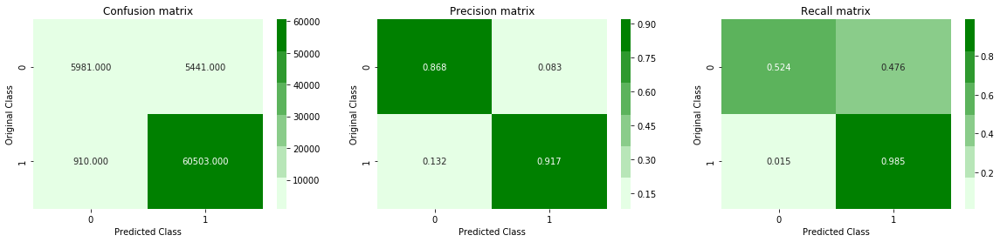

In [38]:
print("F1 Score: ",f1_score(Y_test,pred))
print("******************************************")
plot_confusion_matrix(Y_test, pred)

In [39]:
print(classification_report(Y_test, pred))

              precision    recall  f1-score   support

           0       0.87      0.52      0.65     11422
           1       0.92      0.99      0.95     61413

   micro avg       0.91      0.91      0.91     72835
   macro avg       0.89      0.75      0.80     72835
weighted avg       0.91      0.91      0.90     72835



#### Probabilities of each class on Given Text Point

In [40]:
test_point_ind = 1
no_feature = 100
predicted_cls = nb.predict(Test_bow[test_point_ind])
print("Actual Class :", Y_test[test_point_ind])
print("Predicted Class :", predicted_cls[0])
print("Predicted Class Probabilities:", np.round(nb.predict_proba(Test_bow[test_point_ind]),4))

Actual Class : 1
Predicted Class : 1
Predicted Class Probabilities: [[0.0312 0.9688]]


#### Auc Curve

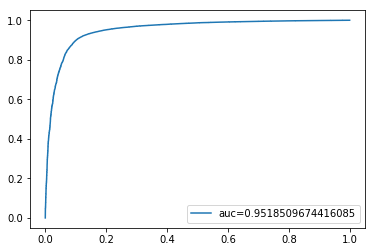

In [41]:
y_pred_proba = nb.predict_proba(Test_bow)[::,1]
fpr, tpr, _ = metrics.roc_curve(Y_test,  y_pred_proba)
auc = metrics.roc_auc_score(Y_test, y_pred_proba)
plt.plot(fpr,tpr,label="auc="+str(auc))
plt.legend(loc=4)
plt.show()

#### Top Ten Important Neagative and Positive Word

In [42]:
pos_class_prob_sorted = nb.feature_log_prob_[0, :].argsort()
neg_class_prob_sorted = nb.feature_log_prob_[1, :].argsort()
topn = neg_class_prob_sorted[:10]
topp = pos_class_prob_sorted[:10]

terms = Text_bow_vectorizer.get_feature_names()
ter= Summary_vectorizer.get_feature_names()
print('*********Neagative words  ****')
for ind in topn:
    if ind < len(ter)+1:
        print(' ',ter[ind])
    if ind < len(terms) + 1:
        print(' ',terms[ind])
print('*******positive words   ******')    
for ind in topp:
    if ind < len(ter)+1:
        print(ter[ind])
    if ind < len(terms) + 1:
        print(terms[ind])

*********Neagative words  ****
  masquerad
  complaint tast
  mislead titl
  contain price
  misrepresent
  contain realli
  miss mark
  contain salt
  dead arriv
  bean order
  strong chemic
  eat sever
  strong artifici
  eat sardin
  receiv yet
  dipper
  date product
  bean good
  strang flavor
  eat prefer
*******positive words   ******
abbi
aafco
time deliveri
ever perfect
time day
ever order
time charm
ever one
good sens
caffein taurin
wheat base
good sensit
caffein tri
omg yum
crusti
good shampoo
caffein would
good shape
caffien


## Observations on new model:

1.Accuracy and log loss are improved .

2.tain and Test loss have very less difference means our model is not overfitting.

3.AUC,Precision and recall are also improved.

4.Recall is low for class 0 but improved as compare to previous model.

5.Our model is predicting the right class with high probablities.

6.Important positive and negative features are mostly bi-gram means bi-gram is improving our model.

# ----------------------------------------------------------------------------------------------------

## Logistic Regression on text features

#### Hyperparameter Tuning using GridSearch and RandomSearch

#### Parameter: C and regularization term Penalty

C: Inverse of regularization strength,smaller values specify stronger regularization.

10-fold cross validation is used ,class_weight is set to 'balanced' to deal with imbalanced data

In [47]:
start = time.time()
log_rg = LogisticRegression(solver = 'liblinear',n_jobs=-1,class_weight='balanced')
grid_parameters = {'C':[10**-2, 10**-1, 1, 10],'penalty':['l1','l2']}
gridSearchModel = GridSearchCV(log_rg, grid_parameters, cv=10,n_jobs=-1)
gridSearchModel.fit(train_bow_text_feature_onehotCoding, y_train)
print("GridSearch: ",gridSearchModel.best_params_)

random_parameters = {'C':uniform(),'penalty':['l1','l2']}
randomSearchModel = RandomizedSearchCV(log_rg, random_parameters, cv=10,n_jobs=-1)
randomSearchModel.fit(train_bow_text_feature_onehotCoding, y_train)
print("randomSearch: ",randomSearchModel.best_params_)
print('Parameters search time: ',(time.time() - start))

GridSearch:  {'C': 1, 'penalty': 'l2'}
randomSearch:  {'C': 0.8486102581289776, 'penalty': 'l2'}
Parameters search time:  58.4592981338501


### Training model on best value of C and Penalty

#### Accuracy and Log Loss

In [48]:
clf_log_rg_gs = LogisticRegression(class_weight='balanced',penalty=gridSearchModel.best_params_['penalty'], C=gridSearchModel.best_params_['C'],solver = 'liblinear',)
clf_log_rg_gs.fit(train_bow_text_feature_onehotCoding, y_train)
tr_score = clf_log_rg_gs.score(train_bow_text_feature_onehotCoding, y_train)
print("GridSearch")
print("Training Accuracy :",tr_score)
tr_score = clf_log_rg_gs.score(test_bow_text_feature_onehotCoding, y_test)
print("Test Accuracy :",tr_score)
print('-------------------------------------------------------------------')
clf_log_rg_rs = LogisticRegression(class_weight='balanced',penalty=randomSearchModel.best_params_['penalty'], C=randomSearchModel.best_params_['C'],solver = 'liblinear',)
clf_log_rg_rs.fit(train_bow_text_feature_onehotCoding, y_train)
tr_score = clf_log_rg_rs.score(train_bow_text_feature_onehotCoding, y_train)
print("RandomSearch")
print("Training Accuracy :",tr_score)
tr_score = clf_log_rg_rs.score(test_bow_text_feature_onehotCoding, y_test)
print("Test Accuracy :",tr_score)
print("**************************************************************************")
print("Log Loss")
print("**************************************************************************")
predict_y = clf_log_rg_gs.predict_proba(train_bow_text_feature_onehotCoding)
print('GridSearch')
print("The train log loss is:",log_loss(y_train, predict_y, labels=clf_log_rg_gs.classes_, eps=1e-15))
predict_y = clf_log_rg_gs.predict_proba(test_bow_text_feature_onehotCoding)
print("The test log loss is:",log_loss(y_test, predict_y, labels=clf_log_rg_gs.classes_, eps=1e-15))
print('-----------------------------------------------')
print('RandomSearch')
predict_y = clf_log_rg_rs.predict_proba(train_bow_text_feature_onehotCoding)
print("The train log loss is:",log_loss(y_train, predict_y, labels=clf_log_rg_rs.classes_, eps=1e-15))
predict_y = clf_log_rg_rs.predict_proba(test_bow_text_feature_onehotCoding)
print("The test log loss is:",log_loss(y_test, predict_y, labels=clf_log_rg_rs.classes_, eps=1e-15))


GridSearch
Training Accuracy : 0.9170875
Test Accuracy : 0.8824
-------------------------------------------------------------------
RandomSearch
Training Accuracy : 0.9161125
Test Accuracy : 0.8814
**************************************************************************
Log Loss
**************************************************************************
GridSearch
The train log loss is: 0.46547504080659047
The test log loss is: 0.41483053743290205
-----------------------------------------------
RandomSearch
The train log loss is: 0.4805553847228014
The test log loss is: 0.4298757742355725


GridSearch parameters are giving good results,it give high train and test accuracy and also low tarin and test log loss

#### Confusion matrix, F1 Score, Classification report

GridSearch
F1 Score:  0.9273939618447861
              precision    recall  f1-score   support

           0       0.59      0.84      0.69      3119
           1       0.97      0.89      0.93     16881

   micro avg       0.88      0.88      0.88     20000
   macro avg       0.78      0.87      0.81     20000
weighted avg       0.91      0.88      0.89     20000

******************************************


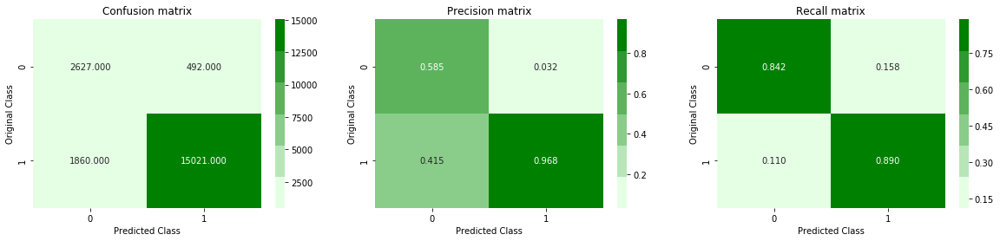

******************************************************************************************************************
RandomSearch
F1 Score:  0.9267177459218982
              precision    recall  f1-score   support

           0       0.58      0.84      0.69      3119
           1       0.97      0.89      0.93     16881

   micro avg       0.88      0.88      0.88     20000
   macro avg       0.78      0.87      0.81     20000
weighted avg       0.91      0.88      0.89     20000

************************************************************************************************


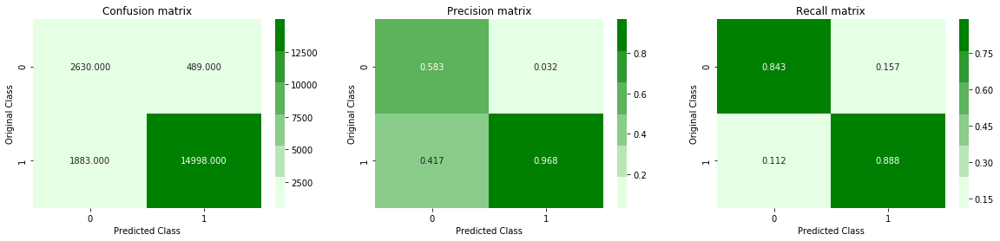

In [49]:
print('GridSearch')
print("F1 Score: ",f1_score(y_test,clf_log_rg_gs.predict(test_bow_text_feature_onehotCoding)))

print(classification_report(y_test, clf_log_rg_gs.predict(test_bow_text_feature_onehotCoding)))
print("******************************************")
plot_confusion_matrix(y_test, clf_log_rg_gs.predict(test_bow_text_feature_onehotCoding))
print('******************************************************************************************************************')
print('RandomSearch')
print("F1 Score: ",f1_score(y_test,clf_log_rg_rs.predict(test_bow_text_feature_onehotCoding)))
print(classification_report(y_test,clf_log_rg_rs.predict(test_bow_text_feature_onehotCoding)))
print("************************************************************************************************")
plot_confusion_matrix(y_test, clf_log_rg_rs.predict(test_bow_text_feature_onehotCoding))

### Testing Model with class probabilities

In [50]:
test_point_in = 0
predicted_cls = clf_log_rg_gs.predict(test_bow_text_feature_onehotCoding[test_point_in].reshape(1,-1))
print("Actual Class :", y_test[test_point_in])
print("--------------")
print('GridSearch')
print("Predicted Class :", predicted_cls[0])
print("Predicted Class Probabilities:", np.round(clf_log_rg_gs.predict_proba(test_bow_text_feature_onehotCoding[test_point_in].reshape(1,-1)),4))

print('----------------------------------------------------')
predicted_cls = clf_log_rg_rs.predict(test_bow_text_feature_onehotCoding[test_point_in].reshape(1,-1))
print('RandomSearch')
print("Predicted Class :", predicted_cls[0])
print("Predicted Class Probabilities:", np.round(clf_log_rg_rs.predict_proba(test_bow_text_feature_onehotCoding[test_point_in].reshape(1,-1)),4))


Actual Class : 1
--------------
GridSearch
Predicted Class : 1
Predicted Class Probabilities: [[0.3009 0.6991]]
----------------------------------------------------
RandomSearch
Predicted Class : 1
Predicted Class Probabilities: [[0.3174 0.6826]]


### Important Features

In [51]:
wt = np.abs(clf_log_rg_gs.coef_[0])
sorted_index = np.argsort(wt)[::-1]
top_10 = sorted_index[:20]
terms = text_bow_vectorizer.get_feature_names()
for ind in top_10:
    print(terms[ind])

disappoint
great
not
love
wast
worst
return
best
money
aw
horribl
bad
delici
terribl
threw
unfortun
perfect
stale
thought
disgust


### Improving model by taking more data,summary features and bi-gram

#### GridSearch on C and penalty

In [38]:
start = time.time()
log_rg = LogisticRegression(solver = 'liblinear',n_jobs=-1,class_weight='balanced')
grid_parameters = {'C':[10**-2, 10**-1, 1, 10],'penalty':['l1','l2']}
gridSearchModel = GridSearchCV(log_rg, grid_parameters, cv=10,n_jobs=-1)
gridSearchModel.fit(Train_bow, Y_train)
print("GridSearch: ",gridSearchModel.best_params_)

random_parameters = {'C':uniform(),'penalty':['l1','l2']}
randomSearchModel = RandomizedSearchCV(log_rg, random_parameters, cv=10,n_jobs=-1)
randomSearchModel.fit(Train_bow, Y_train)
print("randomSearch: ",randomSearchModel.best_params_)
print('Parameters search time: ',(time.time() - start))

GridSearch:  {'C': 10, 'penalty': 'l2'}
randomSearch:  {'C': 0.5861807440955612, 'penalty': 'l2'}
Parameters search time:  893.4291710853577


### Training model with best C and Penalty

#### Accuracy and Log-Loss

In [39]:
clf_log_rg_gs = LogisticRegression(class_weight='balanced',penalty=gridSearchModel.best_params_['penalty'], C=gridSearchModel.best_params_['C'],solver = 'liblinear',)
clf_log_rg_gs.fit(Train_bow, Y_train)
tr_score = clf_log_rg_gs.score(Train_bow, Y_train)
print("GridSearch")
print("Training Accuracy :",tr_score)
tr_score = clf_log_rg_gs.score(Test_bow, Y_test)
print("Test Accuracy :",tr_score)
print('-------------------------------------------------------------------')
clf_log_rg_rs = LogisticRegression(class_weight='balanced',penalty=randomSearchModel.best_params_['penalty'], C=randomSearchModel.best_params_['C'],solver = 'liblinear',)
clf_log_rg_rs.fit(Train_bow, Y_train)
tr_score = clf_log_rg_rs.score(Train_bow, Y_train)
print("RandomSearch")
print("Training Accuracy :",tr_score)
tr_score = clf_log_rg_rs.score(Test_bow, Y_test)
print("Test Accuracy :",tr_score)
print("**************************************************************************")
print("Log Loss")
print("**************************************************************************")
predict_y = clf_log_rg_gs.predict_proba(Train_bow)
print('GridSearch')
print("The train log loss is:",log_loss(Y_train, predict_y, labels=clf_log_rg_gs.classes_, eps=1e-15))
predict_y = clf_log_rg_gs.predict_proba(Test_bow)
print("The test log loss is:",log_loss(Y_test, predict_y, labels=clf_log_rg_gs.classes_, eps=1e-15))
print('-----------------------------------------------')
print('RandomSearch')
predict_y = clf_log_rg_rs.predict_proba(Train_bow)
print("The train log loss is:",log_loss(Y_train, predict_y, labels=clf_log_rg_rs.classes_, eps=1e-15))
predict_y = clf_log_rg_rs.predict_proba(Test_bow)
print("The test log loss is:",log_loss(Y_test, predict_y, labels=clf_log_rg_rs.classes_, eps=1e-15))

GridSearch
Training Accuracy : 0.980843424774144
Test Accuracy : 0.9436809226333494
-------------------------------------------------------------------
RandomSearch
Training Accuracy : 0.9589134195568004
Test Accuracy : 0.9317361158783551
**************************************************************************
Log Loss
**************************************************************************
GridSearch
The train log loss is: 0.12604890064007854
The test log loss is: 0.1763246631462986
-----------------------------------------------
RandomSearch
The train log loss is: 0.36179768442144705
The test log loss is: 0.2937624325968019


#### F1 Score and Confusion Matrix

GridSearch
F1 Score:  0.9660042101075732
              precision    recall  f1-score   support

           0       0.77      0.92      0.84     11422
           1       0.98      0.95      0.97     61413

   micro avg       0.94      0.94      0.94     72835
   macro avg       0.88      0.93      0.90     72835
weighted avg       0.95      0.94      0.95     72835

******************************************


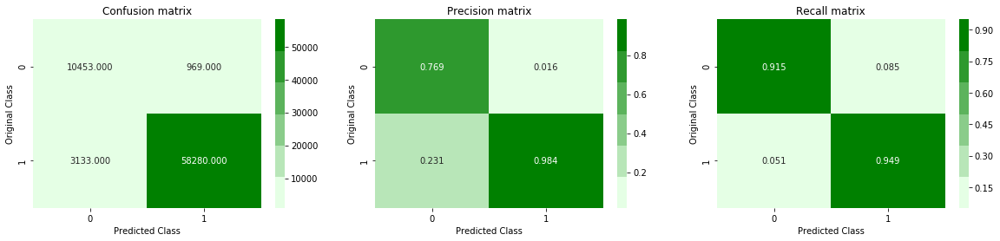

******************************************************************************************************************
RandomSearch
F1 Score:  0.9584037480130511
              precision    recall  f1-score   support

           0       0.72      0.93      0.81     11422
           1       0.99      0.93      0.96     61413

   micro avg       0.93      0.93      0.93     72835
   macro avg       0.85      0.93      0.88     72835
weighted avg       0.94      0.93      0.94     72835

************************************************************************************************


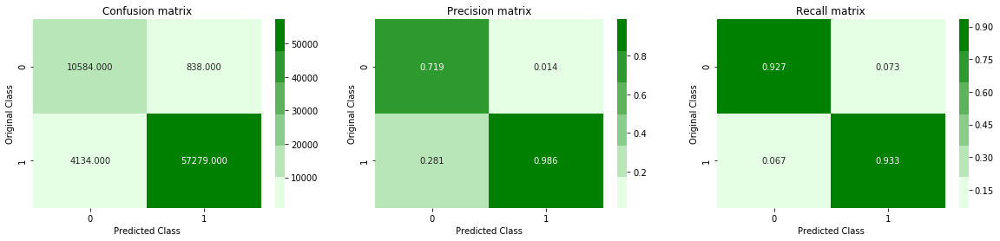

In [40]:
print('GridSearch')
print("F1 Score: ",f1_score(Y_test,clf_log_rg_gs.predict(Test_bow)))

print(classification_report(Y_test, clf_log_rg_gs.predict(Test_bow)))
print("******************************************")
plot_confusion_matrix(Y_test, clf_log_rg_gs.predict(Test_bow))
print('******************************************************************************************************************')
print('RandomSearch')
print("F1 Score: ",f1_score(Y_test,clf_log_rg_rs.predict(Test_bow)))
print(classification_report(Y_test,clf_log_rg_rs.predict(Test_bow)))
print("************************************************************************************************")
plot_confusion_matrix(Y_test, clf_log_rg_rs.predict(Test_bow))


In [42]:
wt = np.abs(clf_log_rg_gs.coef_[0])
sorted_index = np.argsort(wt)[::-1]
top_20 = sorted_index[:20]
terms = Text_bow_vectorizer.get_feature_names()
term= Summary_vectorizer.get_feature_names()
print('Top Ten review and summary Words')
for ind in top_20:
    
    if ind < (len(term) + 1): 
        
        print(terms[ind],"         ",term[ind],sep=' ')
    

Top Ten review and summary Words
could hold           not
best tea           disappoint
came close           great
buy buy           good
coffe small           love
coupl drop           not good
also bought           best
bedtim           delici
fill much           yuck
blob           excel
even hard           terribl
filler           yummi


## Observations on our new model

1.Improvement in Accuracy and Log Loss

2.Log Loss in much lower than earlier model,there is some differencre between train and test loss but it is small so we can say not overfitting.

3.Precsion and Recall is improved,Recall value is high.


# ----------------------------------------------------------------------------------------------

### Perturbation test

In [26]:
df_20k = final.sample(n = 60000,random_state = 123)
final_20k = df_20k.sort_values('Time')               # sorting according to time for Time based spliting
print(final_20k['Score'].value_counts())
y = final_20k['Score'].values

positive    50593
negative     9407
Name: Score, dtype: int64


In [27]:
from sklearn.preprocessing import LabelEncoder
labelencoder_X=LabelEncoder()
y = labelencoder_X.fit_transform(y)
from sklearn.model_selection import train_test_split,StratifiedKFold
X_train, X_test, y_train, y_test = train_test_split(final_20k, y,stratify=y, test_size = 0.20, random_state = 123) # create four variable

In [28]:
# building a CountVectorizer with all the words that occured minimum 10 times in train data
text_bow_vectorizer = CountVectorizer(min_df =5)
train_bow_text_feature_onehotCoding = text_bow_vectorizer.fit_transform(X_train['NewCleanedText'])
# getting all the feature names (words)
train_bow_text_features= text_bow_vectorizer.get_feature_names()
# train_text_feature_onehotCoding.sum(axis=0).A1 will sum every row and returns (1*number of features) vector
train_bow_text_fea_counts = train_bow_text_feature_onehotCoding.sum(axis=0).A1
# zip(list(text_features),text_fea_counts) will zip a word with its number of times it occured
text_bow_fea_dict = dict(zip(list(train_bow_text_features),train_bow_text_fea_counts))
# we use the same vectorizer that was trained on train data
test_bow_text_feature_onehotCoding = text_bow_vectorizer.transform(X_test['NewCleanedText'])
print("Total number of unique words in train data :", len(train_bow_text_features))

Total number of unique words in train data : 8625


In [29]:
# don't forget to normalize every feature
train_bow_text_feature_onehotCoding = normalize(train_bow_text_feature_onehotCoding, axis=0)
# don't forget to normalize every feature
test_bow_text_feature_onehotCoding = normalize(test_bow_text_feature_onehotCoding, axis=0)

In [30]:
lg_reg = LogisticRegression(solver = 'liblinear',n_jobs=-1,class_weight='balanced',penalty = 'l2',C = 0.85)
lg_reg.fit(train_bow_text_feature_onehotCoding, y_train)

wt1 = np.abs(lg_reg.coef_[0])

In [31]:
train_bow_text_feature_onehotCoding.shape

(48000, 8625)

In [32]:
random_matrix = np.random.randint(1,size=(48000,8625))
train_bow_text_feature_onehotCoding = train_bow_text_feature_onehotCoding + random_matrix
train_bow_text_feature_onehotCoding = normalize(train_bow_text_feature_onehotCoding, axis=0)

In [33]:
lg_reg = LogisticRegression(solver = 'liblinear',n_jobs=-1,class_weight='balanced',penalty = 'l2',C = 0.85)
lg_reg.fit(train_bow_text_feature_onehotCoding, y_train)

wt2 = np.abs(lg_reg.coef_[0])

In [37]:
(((wt1 - wt2) )/(wt1  ))*100

array([ 1.87684619e-10, -7.52987168e-10,  2.00124945e-08, ...,
        4.03406156e-12, -3.83360328e-11, -2.54865606e-10])

# ----------------------------------------------------------------------------------

## Linear SVM on text features

#### Gridsearch on C

C : Penalty parameter C of the error term

loss set to 'hinge'

In [10]:
svm_clf = LinearSVC(loss = 'hinge',class_weight ='balanced')
start= time.time()
grid_parameters = {'C':[10**-3,10**-2,10**0,10**2,10**3]}
gridSearchModel = GridSearchCV(svm_clf, grid_parameters, cv=10,n_jobs=-1)
gridSearchModel.fit(train_bow_text_feature_onehotCoding, y_train)
print(gridSearchModel.best_params_)
print('GridSearch Time: ',(time.time() - start))

{'C': 1}
GridSearch Time:  87.10767436027527


#### C vs Loss

Best: -0.901625 using {'C': 1}
-0.590838 (0.008906) with: {'C': 0.001}
-0.838600 (0.076936) with: {'C': 0.01}
-0.901625 (0.003533) with: {'C': 1}
-0.880563 (0.002874) with: {'C': 100}
-0.875550 (0.017461) with: {'C': 1000}


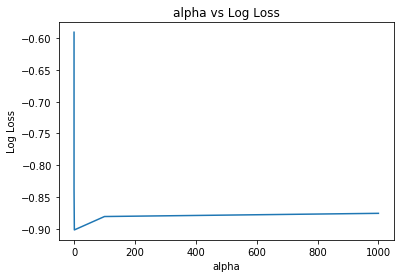

In [11]:
print("Best: %f using %s" % (-gridSearchModel.best_score_, gridSearchModel.best_params_))
means = gridSearchModel.cv_results_['mean_test_score']
stds = gridSearchModel.cv_results_['std_test_score']
params = gridSearchModel.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (-mean, stdev, param))
# plot
plt.errorbar([10**-3,10**-2,10**0,10**2,10**3], -means)
plt.title("alpha vs Log Loss")
plt.xlabel('alpha')
plt.ylabel('Log Loss')
plt.show()

### Training model best value of C

#### Accuracy and hinge loss

In [12]:
lr_svm = LinearSVC(C=gridSearchModel.best_params_['C'],class_weight='balanced')
lr_svm.fit(train_bow_text_feature_onehotCoding, y_train)
tr_score = lr_svm.score(train_bow_text_feature_onehotCoding, y_train)
print("GridSearch")
print('*******************Accuracy****************')
print("Training Accuracy :",tr_score)
tr_score = lr_svm.score(test_bow_text_feature_onehotCoding, y_test)
print("Test Accuracy :",tr_score)
print('******************Hinge Loss***************')
print("Train loss :",hinge_loss(y_train,lr_svm.predict(train_bow_text_feature_onehotCoding)))
print("Test loss :",hinge_loss(y_test,lr_svm.predict(test_bow_text_feature_onehotCoding)))

GridSearch
*******************Accuracy****************
Training Accuracy : 0.9281375
Test Accuracy : 0.88875
******************Hinge Loss***************
Train loss : 0.227825
Test loss : 0.2672


#### F1 Score and Confusion matrix

F1 Score:  0.9316793072742346
******************************************


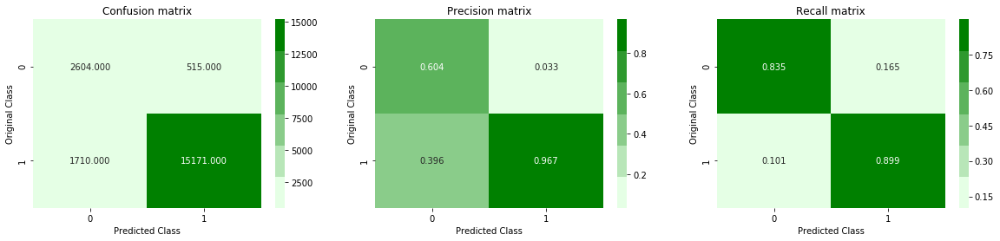

In [13]:
print("F1 Score: ",f1_score(y_test,lr_svm.predict(test_bow_text_feature_onehotCoding)))
print("******************************************")
plot_confusion_matrix(y_test, lr_svm.predict(test_bow_text_feature_onehotCoding))

#### Important words

In [15]:
wt = np.abs(lr_svm.coef_[0])
sorted_index = np.argsort(wt)[::-1]
top_20 = sorted_index[:20]
terms = text_bow_vectorizer.get_feature_names()
for ind in top_20:
    print(terms[ind])

great
not
love
disappoint
best
delici
good
perfect
excel
worst
favorit
nice
return
aw
wast
terribl
unfortun
horribl
bad
happi


### Improving model using more data,summary features and bi-grams

#### GridSearch on C

In [21]:
svm_clf = LinearSVC(loss = 'hinge',class_weight ='balanced')
start= time.time()
grid_parameters = {'C':[10**-3,10**-2,10**0,10**2,10**3]}
gridSearchModel = GridSearchCV(svm_clf, grid_parameters, cv=10,n_jobs=-1)
gridSearchModel.fit(Train_bow, Y_train)
print(gridSearchModel.best_params_)
print('GridSearch Time: ',(time.time() - start))

{'C': 1}
GridSearch Time:  437.98083758354187


#### C vs Loss

Best: -0.948534 using {'C': 1}
-0.748946 (0.003103) with: {'C': 0.001}
-0.857196 (0.001763) with: {'C': 0.01}
-0.948534 (0.001011) with: {'C': 1}
-0.935017 (0.000923) with: {'C': 100}
-0.932470 (0.001458) with: {'C': 1000}


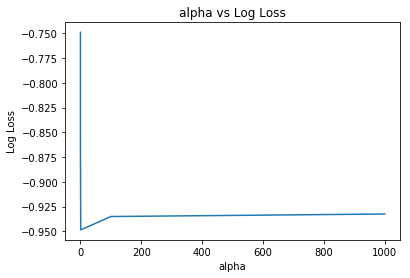

In [22]:
print("Best: %f using %s" % (-gridSearchModel.best_score_, gridSearchModel.best_params_))
means = gridSearchModel.cv_results_['mean_test_score']
stds = gridSearchModel.cv_results_['std_test_score']
params = gridSearchModel.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (-mean, stdev, param))
# plot
plt.errorbar([10**-3,10**-2,10**0,10**2,10**3], -means)
plt.title("alpha vs Log Loss")
plt.xlabel('alpha')
plt.ylabel('Log Loss')
plt.show()

### Training model on best value of C

#### Accuracy and Hinge Loss

In [23]:
lr_svm = LinearSVC(C=gridSearchModel.best_params_['C'],class_weight='balanced')
lr_svm.fit(Train_bow, Y_train)
tr_score = lr_svm.score(Train_bow, Y_train)
print("GridSearch")
print('*******************Accuracy****************')
print("Training Accuracy :",tr_score)
tr_score = lr_svm.score(Test_bow, Y_test)
print("Test Accuracy :",tr_score)
print('******************Hinge Loss***************')
print("Train loss :",hinge_loss(Y_train,lr_svm.predict(Train_bow)))
print("Test loss :",hinge_loss(Y_test,lr_svm.predict(Test_bow)))

GridSearch
*******************Accuracy****************
Training Accuracy : 0.9808056676826756
Test Accuracy : 0.9428296835312693
******************Hinge Loss***************
Train loss : 0.1760166954993547
Test loss : 0.21399052653257364


#### F1 Score and Confusion matrix

F1 Score:  0.9654932378679396
******************************************


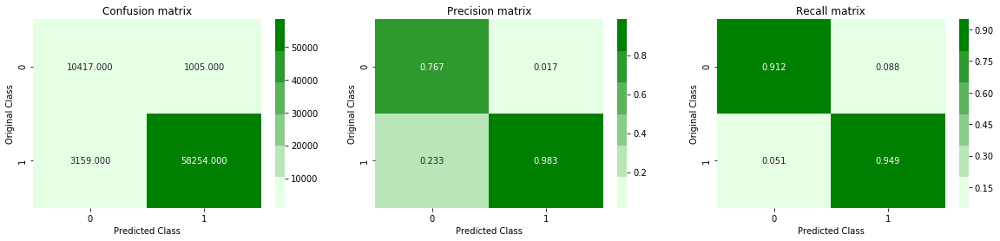

In [24]:
print("F1 Score: ",f1_score(Y_test,lr_svm.predict(Test_bow)))
print("******************************************")
plot_confusion_matrix(Y_test, lr_svm.predict(Test_bow))

### Important words

In [31]:
wt = np.abs(lr_svm.coef_[0])
sorted_index = np.argsort(wt)[::-1]
top_20 = sorted_index[:20]
terms = Text_bow_vectorizer.get_feature_names()
term= Summary_vectorizer.get_feature_names()
print('Top Ten review and summary Words')
for ind in top_20:
    
    if ind < (len(term) + 1): 
        
        print(terms[ind],"         ",term[ind],sep=' ')
    

Top Ten review and summary Words
could hold           not
came close           great
best tea           disappoint
buy buy           good
coffe small           love
coupl drop           not good
also bought           best
bedtim           delici
filler           yummi
blob           excel
fill much           yuck
even hard           terribl


In [37]:
print(" %age of missclassified points :", ((np.count_nonzero((lr_svm.predict(Test_bow)- Y_test))/Y_test.shape[0]))*100)

 %age of missclassified points : 5.717031646873069


## Observation on new model:

1.Accuracy and hinge loss improved.

2.train and test loss have less difference means our model is not overfitting.

3.both precision and recall improved ,recall value is high

4.important words have bi-gram which means bi-gram is improving model

# ----------------------------------------------------------------------------------------------------

## Decision Tree on text features

#### Gridsearch  HyperParameter Tuning on max_depth of tree

class weight is set as 'balanced'

5-fold cross validattion

In [49]:
start = time.time()
dt = tree.DecisionTreeClassifier(class_weight = 'balanced')
grid_parameters = {"max_depth": range(2,10)}
grid_search = GridSearchCV(dt, grid_parameters, cv=5,scoring="neg_log_loss",n_jobs = -1)
grid_result = grid_search.fit(train_bow_text_feature_onehotCoding,y_train)
print('GridSearch Time: ',(time.time() - start))

GridSearch Time:  30.629916667938232


#### max_depth vs Loss

Best: 0.593865 using {'max_depth': 6}
0.639241 (0.002343) with: {'max_depth': 2}
0.619688 (0.003815) with: {'max_depth': 3}
0.606011 (0.006870) with: {'max_depth': 4}
0.598093 (0.003686) with: {'max_depth': 5}
0.593865 (0.008898) with: {'max_depth': 6}
0.603761 (0.009246) with: {'max_depth': 7}
0.622455 (0.015526) with: {'max_depth': 8}
0.649459 (0.024157) with: {'max_depth': 9}


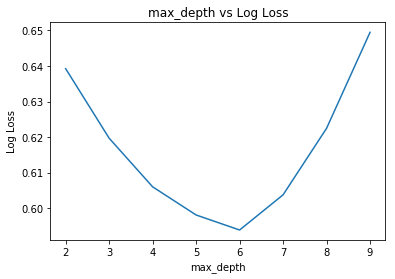

In [50]:
# summarize results
print("Best: %f using %s" % (-grid_result.best_score_, grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (-mean, stdev, param))
# plot
plt.errorbar(range(2,10), -means)
plt.title("max_depth vs Log Loss")
plt.xlabel('max_depth')
plt.ylabel('Log Loss')
plt.show()

### Training model best max_depth value

#### Accuracy and Log Loss

In [51]:
dt_bow = tree.DecisionTreeClassifier(max_depth = 6,class_weight = 'balanced')
dt_bow = dt_bow.fit(train_bow_text_feature_onehotCoding,y_train)
pred = dt_bow.predict(train_bow_text_feature_onehotCoding)
# evaluate accuracy
acc = accuracy_score(y_train, pred) * 100
print('\nThe Train accuracy of the DT classifier is %f%%' % (acc))
# predict the response
pred = dt_bow.predict(test_bow_text_feature_onehotCoding)
# evaluate accuracy
acc = accuracy_score(y_test, pred) * 100
print('\nThe Test accuracy of the DT classifier is %f%%' % (acc))
print("****************************************")
predict_y = dt_bow.predict_proba(train_bow_text_feature_onehotCoding)
print('GridSearch')
print("The train log loss is:",log_loss(y_train, predict_y, labels=dt_bow.classes_, eps=1e-15))
predict_y = dt_bow.predict_proba(test_bow_text_feature_onehotCoding)
print("The test log loss is:",log_loss(y_test, predict_y, labels=dt_bow.classes_, eps=1e-15))


The Train accuracy of the DT classifier is 65.526250%

The Test accuracy of the DT classifier is 64.130000%
****************************************
GridSearch
The train log loss is: 0.5671127813861077
The test log loss is: 0.5887689950496093


Both training and testing Accuracy are not good and log-loss is also high.

#### F1 Score,Classification report and confusion matrix

GridSearch
F1 Score:  0.7436941764916043
              precision    recall  f1-score   support

           0       0.27      0.78      0.40      3119
           1       0.94      0.62      0.74     16881

   micro avg       0.64      0.64      0.64     20000
   macro avg       0.60      0.70      0.57     20000
weighted avg       0.83      0.64      0.69     20000

******************************************


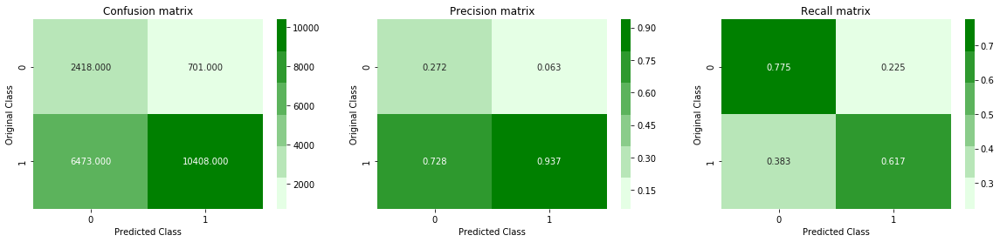

In [52]:
print('GridSearch')
print("F1 Score: ",f1_score(y_test,pred))
print(classification_report(y_test,pred))
print("******************************************")
plot_confusion_matrix(y_test, pred)

### Important features(words)

In [53]:
ft  = np.abs(dt_bow.feature_importances_)
sorted_index = np.argsort(ft)[::-1]
top_20 = sorted_index[:20]
terms = text_bow_vectorizer.get_feature_names()
print('Top Twenty Words')
for ind in top_20:
    print(terms[ind])
top = sorted_index[:]
text=' '
for ind in top:
    text = text + terms[ind] + ' '
print(len(text))    

Top Twenty Words
great
not
love
disappoint
best
good
delici
unfortun
thought
tast
bad
money
return
terribl
product
perfect
wont
box
earth
like
74447


### Visualising tree using Graphviz

In [55]:
from sklearn.externals.six import StringIO  
import pydot 
dot_data = StringIO() 
tree.export_graphviz(dt_bow, out_file=dot_data) 
graph = pydot.graph_from_dot_data(dot_data.getvalue()) 
graph[0].write_pdf("dt_bow.pdf") 

In [57]:
from IPython.display import IFrame  
display(IFrame("dt_bow.pdf", width=700, height=450))

### Improving model by taking more data,summary features and bi-gram

In [11]:
# building a CountVectorizer with all the words that occured minimum 10 times in train data
Text_bow_vectorizer = CountVectorizer(ngram_range=(1, 2),min_df = 100)
Train_bow_text_feature_onehotCoding = Text_bow_vectorizer.fit_transform(X_Train['NewCleanedText'])
# getting all the feature names (words)
Train_bow_text_features= Text_bow_vectorizer.get_feature_names()
# train_text_feature_onehotCoding.sum(axis=0).A1 will sum every row and returns (1*number of features) vector
Train_bow_text_fea_counts = Train_bow_text_feature_onehotCoding.sum(axis=0).A1
# zip(list(text_features),text_fea_counts) will zip a word with its number of times it occured
Text_bow_fea_dict = dict(zip(list(Train_bow_text_features),Train_bow_text_fea_counts))
# we use the same vectorizer that was trained on train data
Test_bow_text_feature_onehotCoding = Text_bow_vectorizer.transform(X_Test['NewCleanedText'].values)
print("Total number of unique words in train text data :", len(Train_bow_text_features))


# normalize train text features
Train_bow_text_feature_onehotCoding = normalize(Train_bow_text_feature_onehotCoding, axis=0)
# normalize test text features
Test_bow_text_feature_onehotCoding = normalize(Test_bow_text_feature_onehotCoding, axis=0)

Total number of unique words in train text data : 15880


In [12]:
Summary_vectorizer = CountVectorizer(ngram_range=(1,2),min_df = 50)
Train_summary_feature_onehotCoding = Summary_vectorizer.fit_transform(X_Train['NewCleanedSummary'])
Train_summary_features= Summary_vectorizer.get_feature_names()
# we use the same vectorizer that was trained on train data
Test_summary_feature_onehotCoding = Summary_vectorizer.transform(X_Test['NewCleanedSummary'])
print("Total number of unique words in summary train data :", len(Train_summary_features))

# normalize summary feature
Train_summary_feature_onehotCoding = normalize(Train_summary_feature_onehotCoding, axis=0)
# normalize summary feature
Test_summary_feature_onehotCoding = normalize(Test_summary_feature_onehotCoding, axis=0)

Total number of unique words in summary train data : 2528


In [13]:
# combining the text and summary features
Train_bow = hstack((Train_summary_feature_onehotCoding, Train_bow_text_feature_onehotCoding)).tocsr()
Test_bow = hstack((Test_summary_feature_onehotCoding, Test_bow_text_feature_onehotCoding)).tocsr()

#### Grid search on max_depth of tree

In [47]:
start = time.time()
dt = tree.DecisionTreeClassifier(class_weight = 'balanced')
grid_parameters = {"max_depth": range(2,10)}
grid_search = GridSearchCV(dt, grid_parameters, cv=3,scoring="neg_log_loss",n_jobs = -1)
grid_result = grid_search.fit(Train_bow,Y_train)
print('GridSearch Time: ',(time.time() - start))

GridSearch Time:  85.89499950408936


#### max_depth vs Loss

Best: 0.532186 using {'max_depth': 8}
0.621788 (0.001169) with: {'max_depth': 2}
0.600575 (0.001140) with: {'max_depth': 3}
0.580397 (0.001651) with: {'max_depth': 4}
0.560983 (0.001856) with: {'max_depth': 5}
0.546779 (0.000605) with: {'max_depth': 6}
0.535146 (0.000019) with: {'max_depth': 7}
0.532186 (0.000259) with: {'max_depth': 8}
0.534841 (0.002117) with: {'max_depth': 9}


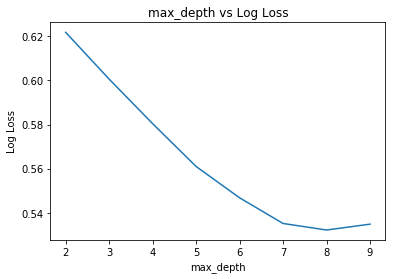

In [48]:
# summarize results
print("Best: %f using %s" % (-grid_result.best_score_, grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (-mean, stdev, param))
# plot
plt.errorbar(range(2,10), -means)
plt.title("max_depth vs Log Loss")
plt.xlabel('max_depth')
plt.ylabel('Log Loss')
plt.show()

### Traing model on best max_depth value

#### Accuracy and Log loss

In [77]:
dt = tree.DecisionTreeClassifier(max_depth = 8,class_weight = 'balanced')
dt = dt.fit(Train_bow,Y_train)
pred = dt.predict(Train_bow)
# evaluate accuracy
acc = accuracy_score(Y_train, pred) * 100
print('\nThe Train accuracy of the DT classifier is %f%%' % (acc))
# predict the response
pred = dt.predict(Test_bow)
# evaluate accuracy
acc = accuracy_score(Y_test, pred) * 100
print('\nThe Test accuracy of the DT classifier is %f%%' % (acc))
print("****************************************")
predict_y = dt.predict_proba(Train_bow)
print('GridSearch')
print("The train log loss is:",log_loss(Y_train, predict_y, labels=dt.classes_, eps=1e-15))
predict_y = dt.predict_proba(Test_bow)
print("The test log loss is:",log_loss(Y_test, predict_y, labels=dt.classes_, eps=1e-15))


The Train accuracy of the DT classifier is 63.708913%

The Test accuracy of the DT classifier is 63.042493%
****************************************
GridSearch
The train log loss is: 0.5116792641003342
The test log loss is: 0.5574385199107972


#### F1 Score and Confusion Matrix

GridSearch
F1 Score:  0.726532022106632
              precision    recall  f1-score   support

           0       0.28      0.89      0.43     11422
           1       0.97      0.58      0.73     61413

   micro avg       0.63      0.63      0.63     72835
   macro avg       0.62      0.74      0.58     72835
weighted avg       0.86      0.63      0.68     72835

******************************************


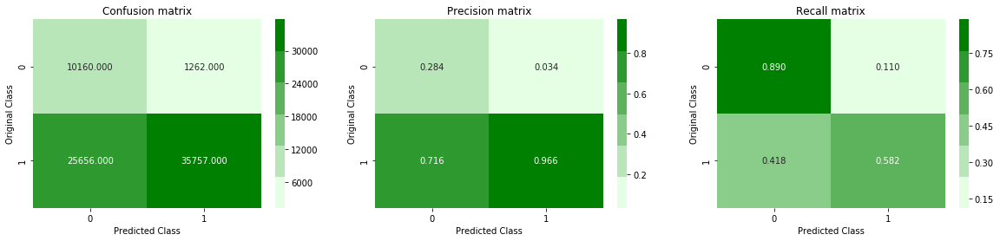

In [78]:
print('GridSearch')
print("F1 Score: ",f1_score(Y_test,pred))
print(classification_report(Y_test,pred))
print("******************************************")
plot_confusion_matrix(Y_test, pred)

## Observation on new model:

1. Improvement in Accuarcy and loss by decreasing number of features.

2.Precsion is not good but recall is good for minor class if in some specific task if we need recall high than we can use it.

3.Decsion Tree is not good for high dimensional data

# ------------------------------------------------------------------------------------------

## Random Forest on text features

#### GridSerch on number of estimator and max depth

In [66]:
start = time.time()
clf= RandomForestClassifier(n_jobs=-1)
grid_parameters = {"n_estimators": [150,300,500],'max_depth':[3,5,7]}
grid_search = GridSearchCV(clf, grid_parameters,scoring="neg_log_loss",n_jobs=-1)
grid_result = grid_search.fit(train_bow_text_feature_onehotCoding,y_train)
print('Gridsearch Time: ',(time.time() - start))

Gridsearch Time:  71.87820649147034


#### HeatMap on max_depth and no. of estimator

Best: 0.398533 using {'max_depth': 7, 'n_estimators': 500}
0.415520 (0.000109) with: {'max_depth': 3, 'n_estimators': 150}
0.416802 (0.000413) with: {'max_depth': 3, 'n_estimators': 300}
0.416540 (0.000194) with: {'max_depth': 3, 'n_estimators': 500}
0.407721 (0.000254) with: {'max_depth': 5, 'n_estimators': 150}
0.407478 (0.000456) with: {'max_depth': 5, 'n_estimators': 300}
0.406663 (0.000207) with: {'max_depth': 5, 'n_estimators': 500}
0.399300 (0.000303) with: {'max_depth': 7, 'n_estimators': 150}
0.399198 (0.000663) with: {'max_depth': 7, 'n_estimators': 300}
0.398533 (0.000999) with: {'max_depth': 7, 'n_estimators': 500}


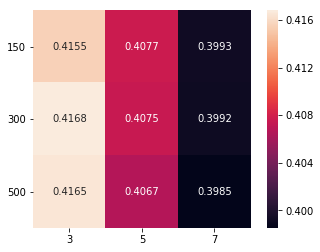

In [67]:
# summarize results
print("Best: %f using %s" % (-grid_result.best_score_, grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (-mean, stdev, param))
data = pd.DataFrame(-means.reshape(3,3), columns=[150,300,500], index = [3,5,7])

# plot heatmap
ax = sns.heatmap(data.T,annot=True, square=True,fmt = '.4g')

# turn the axis label
for item in ax.get_yticklabels():
    item.set_rotation(0)

for item in ax.get_xticklabels():
    item.set_rotation(0)

# save figure

plt.show()

### training model on best value of max_depth and number of estimators

#### Accuarcy and Log Loss

In [68]:
rf = RandomForestClassifier(n_estimators = 500,n_jobs=-1,max_depth = 7)
rf.fit(train_bow_text_feature_onehotCoding,y_train)
pred = rf.predict(train_bow_text_feature_onehotCoding)
# evaluate accuracy
acc = accuracy_score(y_train, pred) * 100
print('\nThe Train accuracy of the RF classifier is %f%%' % (acc))
# predict the response
pred = rf.predict(test_bow_text_feature_onehotCoding)
# evaluate accuracy
acc = accuracy_score(y_test, pred) * 100
print('\nThe Test accuracy of the RF classifier is %f%%' % (acc))


The Train accuracy of the RF classifier is 84.403750%

The Test accuracy of the RF classifier is 84.405000%


#### Log Loss

In [69]:
predict_y = rf.predict_proba(train_bow_text_feature_onehotCoding)
print("The train log loss is:",log_loss(y_train, predict_y, labels=rf.classes_, eps=1e-15))
predict_y = rf.predict_proba(test_bow_text_feature_onehotCoding)
print("The test log loss is:",log_loss(y_test, predict_y, labels=rf.classes_, eps=1e-15))

The train log loss is: 0.39710298699855223
The test log loss is: 0.39927696273371444


#### F1 Score and Confusion matrix

GridSearch
F1 Score:  0.9154307095794583
******************************************


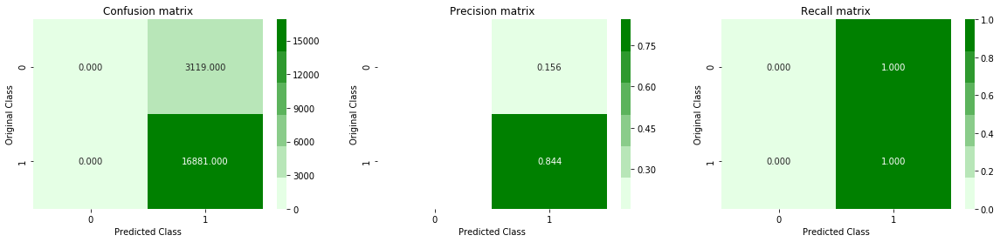

In [70]:
print('GridSearch')
print("F1 Score: ",f1_score(y_test,pred))
print("******************************************")
plot_confusion_matrix(y_test, pred)

#### Important Features

In [71]:
ft  = np.abs(rf.feature_importances_)
sorted_index = np.argsort(ft)[::-1]
top_20 = sorted_index[:20]
terms = text_bow_vectorizer.get_feature_names()
print('Top Twenty Words')
for ind in top_20:
    print(terms[ind])
top = sorted_index[:]
text=' '
for ind in top:
    text = text + terms[ind] + ' '
print(len(text))    

Top Twenty Words
disappoint
return
great
worst
wast
money
horribl
refund
not
aw
threw
bad
terribl
best
disgust
love
delici
would
descript
trash
74447


### WordCloud of Important features

Feature importance WordClouds


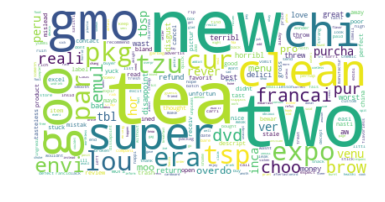

In [72]:
wc = WordCloud(background_color="white", max_words=len(text))
wc.generate(text)
print ("Feature importance WordClouds")
plt.imshow(wc, interpolation='bilinear')
plt.axis("off")
plt.show()


## Improving model using more data,summary features and  and bi-gram

### RF on summary + text

In [79]:
start = time.time()
clf= RandomForestClassifier(n_jobs=-1)
grid_parameters = {"n_estimators": [150,300,500],'max_depth':[3,5,7]}
grid_search = GridSearchCV(clf, grid_parameters,scoring="neg_log_loss",n_jobs=-1)
grid_result = grid_search.fit(Train_bow,Y_train)
print('Gridsearch Time: ',(time.time() - start))

Gridsearch Time:  366.5635588169098


#### HeatMap on max_depth and No. of estimator

Best: 0.390685 using {'max_depth': 7, 'n_estimators': 150}
0.414231 (0.000674) with: {'max_depth': 3, 'n_estimators': 150}
0.414013 (0.000726) with: {'max_depth': 3, 'n_estimators': 300}
0.413772 (0.000263) with: {'max_depth': 3, 'n_estimators': 500}
0.401557 (0.001480) with: {'max_depth': 5, 'n_estimators': 150}
0.402016 (0.000502) with: {'max_depth': 5, 'n_estimators': 300}
0.401384 (0.000566) with: {'max_depth': 5, 'n_estimators': 500}
0.390685 (0.001124) with: {'max_depth': 7, 'n_estimators': 150}
0.391995 (0.000157) with: {'max_depth': 7, 'n_estimators': 300}
0.391218 (0.001050) with: {'max_depth': 7, 'n_estimators': 500}


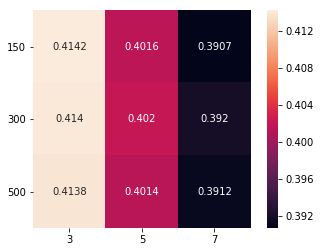

In [80]:
# summarize results
print("Best: %f using %s" % (-grid_result.best_score_, grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (-mean, stdev, param))
data = pd.DataFrame(-means.reshape(3,3), columns=[150,300,500], index = [3,5,7])

# plot heatmap
ax = sns.heatmap(data.T,annot=True, square=True,fmt = '.4g')

# turn the axis label
for item in ax.get_yticklabels():
    item.set_rotation(0)

for item in ax.get_xticklabels():
    item.set_rotation(0)

# save figure

plt.show()

### Training model on best parameters

#### Accuracy and Loss

In [81]:
rf = RandomForestClassifier(n_estimators = 150,n_jobs=-1,max_depth = 7)
rf.fit(Train_bow,Y_train)
pred = rf.predict(Train_bow)
# evaluate accuracy
acc = accuracy_score(Y_train, pred) * 100
print('\nThe Train accuracy of the RF classifier is %f%%' % (acc))
# predict the response
pred = rf.predict(Test_bow)
# evaluate accuracy
acc = accuracy_score(Y_test, pred) * 100
print('\nThe Test accuracy of the RF classifier is %f%%' % (acc))

predict_y = rf.predict_proba(Train_bow)
print("The train log loss is:",log_loss(Y_train, predict_y, labels=rf.classes_, eps=1e-15))
predict_y = rf.predict_proba(Test_bow)
print("The test log loss is:",log_loss(Y_test, predict_y, labels=rf.classes_, eps=1e-15))


The Train accuracy of the RF classifier is 84.317764%

The Test accuracy of the RF classifier is 84.317979%
The train log loss is: 0.3896237827539894
The test log loss is: 0.3908581800753899


#### F1 Score and Confusion Marix

GridSearch
F1 Score:  0.9149186580060783
******************************************


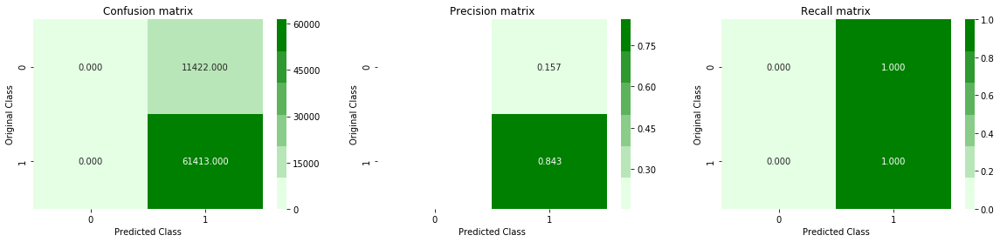

In [82]:
print('GridSearch')
print("F1 Score: ",f1_score(Y_test,pred))
print("******************************************")
plot_confusion_matrix(Y_test, pred)

## Observations:

1.It is very bad model because it is predicting everything as class 1

2.Random Forest is not good in high dimensional data.

# -------------------------------------------------------------------------------------------------

# GBDT on Text data

#### GridSearch on no. of estimator and max_depth

In [77]:
start = time.time()
clf= GradientBoostingClassifier(subsample = 1)
grid_parameters = {"n_estimators": [300,500],'max_depth':[5,7]}
grid_search = GridSearchCV(clf, grid_parameters,scoring="neg_log_loss",n_jobs=-1)
grid_result = grid_search.fit(train_bow_text_feature_onehotCoding,y_train)
print('GridSearch Time: ',(time.time() - start))

GridSearch Time:  1562.3578009605408


#### HeatMap max_depth vs no. of estimator

Best: 0.221170 using {'max_depth': 7, 'n_estimators': 500}
0.237551 (0.001224) with: {'max_depth': 5, 'n_estimators': 300}
0.226225 (0.002014) with: {'max_depth': 5, 'n_estimators': 500}
0.229908 (0.002071) with: {'max_depth': 7, 'n_estimators': 300}
0.221170 (0.002293) with: {'max_depth': 7, 'n_estimators': 500}


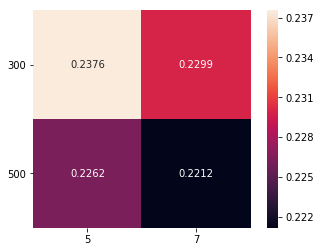

In [78]:
# summarize results
print("Best: %f using %s" % (-grid_result.best_score_, grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (-mean, stdev, param))
data = pd.DataFrame(-means.reshape(2,2), columns=[300,500], index = [5,7])

# plot heatmap
ax = sns.heatmap(data.T,annot=True, square=True,fmt = '.4g')
# turn the axis label
for item in ax.get_yticklabels():
    item.set_rotation(0)
for item in ax.get_xticklabels():
    item.set_rotation(0)
plt.show()

### Training model on best parameters

#### Accuracy and Loss

In [8]:
gbdt = GradientBoostingClassifier(n_estimators = 500,max_depth=7)
gbdt.fit(train_bow_text_feature_onehotCoding,y_train)
pred = gbdt.predict(train_bow_text_feature_onehotCoding)
# evaluate accuracy
acc = accuracy_score(y_train, pred) * 100
print('\nThe Train accuracy of the RF classifier is %f%%' % (acc))
# predict the response
pred = gbdt.predict(test_bow_text_feature_onehotCoding)
# evaluate accuracy
acc = accuracy_score(y_test, pred) * 100
print('\nThe Test accuracy of the RF classifier is %f%%' % (acc))

predict_y = gbdt.predict_proba(train_bow_text_feature_onehotCoding)
print("The train log loss is:",log_loss(y_train, predict_y, labels=gbdt.classes_, eps=1e-15))
predict_y = gbdt.predict_proba(test_bow_text_feature_onehotCoding)
print("The test log loss is:",log_loss(y_test, predict_y, labels=gbdt.classes_, eps=1e-15))


The Train accuracy of the RF classifier is 95.088750%

The Test accuracy of the RF classifier is 90.870000%
The train log loss is: 0.13381292001569636
The test log loss is: 0.22570190046884814


#### F1 Score and Confusion matrix

GridSearch
F1 Score:  0.9483180072168549
******************************************


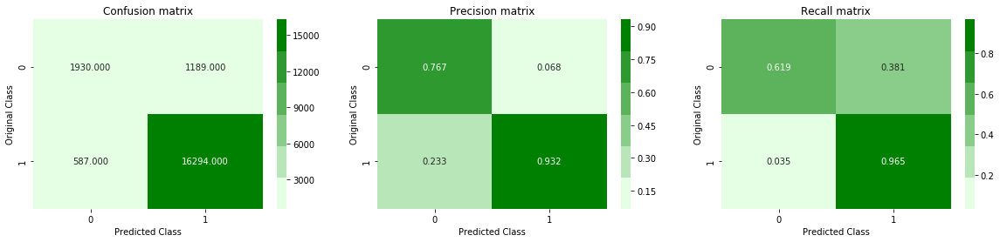

In [80]:
print('GridSearch')
print("F1 Score: ",f1_score(y_test,pred))
print("******************************************")
plot_confusion_matrix(y_test, pred)

### Importanrt Features

In [81]:
ft  = np.abs(gbdt.feature_importances_)
sorted_index = np.argsort(ft)[::-1]
top_20 = sorted_index[:20]
terms = text_bow_vectorizer.get_feature_names()
print('Top Twenty Words')
for ind in top_20:
    print(terms[ind])
top = sorted_index[:]
text=' '
for ind in top:
    text = text + terms[ind] + ' '
print(len(text))    

Top Twenty Words
disappoint
not
great
love
best
return
wast
worst
good
horribl
delici
aw
terribl
money
bad
threw
perfect
refund
unfortun
disgust
74447


### WordCloud

Feature importance WordClouds


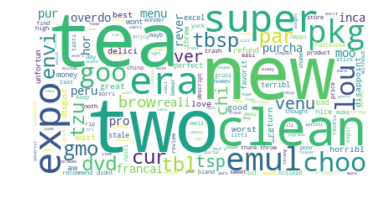

In [82]:
wc = WordCloud(background_color="white", max_words=len(text))
wc.generate(text)
print ("Feature importance WordClouds")
plt.imshow(wc, interpolation='bilinear')
plt.axis("off")
plt.show()

## GBDT on reviewtext, summary features and bi gram

#### Accuracy and Loss

In [23]:
gbdt_new = GradientBoostingClassifier(n_estimators = 90,max_depth=6)
gbdt_new.fit(Train_bow,Y_train)
pred = gbdt_new.predict(Train_bow)
# evaluate accuracy
acc = accuracy_score(Y_train, pred) * 100
print('\nThe Train accuracy of the RF classifier is %f%%' % (acc))
# predict the response
pred = gbdt_new.predict(Test_bow)
# evaluate accuracy
acc = accuracy_score(Y_test, pred) * 100
print('\nThe Test accuracy of the RF classifier is %f%%' % (acc))

predict_y = gbdt_new.predict_proba(Train_bow)
print("The train log loss is:",log_loss(Y_train, predict_y, labels=gbdt_new.classes_, eps=1e-15))
predict_y = gbdt_new.predict_proba(Test_bow)
print("The test log loss is:",log_loss(Y_test, predict_y, labels=gbdt_new.classes_, eps=1e-15))




The Train accuracy of the RF classifier is 91.813576%

The Test accuracy of the RF classifier is 91.173200%
The train log loss is: 0.2178779521000674
The test log loss is: 0.23041072472229918


#### F1 Score and Confusion Matrix

GridSearch
F1 Score:  0.9494793011446768
******************************************


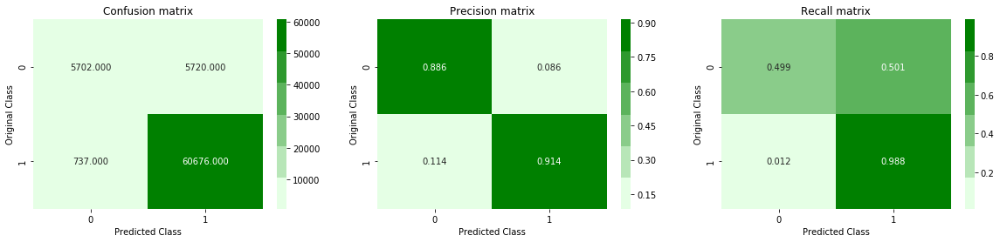

In [84]:
print('GridSearch')
print("F1 Score: ",f1_score(Y_test,pred))
print("******************************************")
plot_confusion_matrix(Y_test, pred)

## Observations:

1.Gbdt is performing good as comapare to DT and RF.

2.Both Accuracy and Loss improved.

3.improvement in precsion and recall. precsion is good but recall is bad for class 0

4.by reducing features we can improve it more.

5.the difference between Train and Test Loss is low so our model is not overfitting.

# ----------------------------------------------------------------------------------------------

## XGBOOST on text data

#### Accuarcy and Loss

In [87]:
xgb_bow = xgb.XGBClassifier(n_estimators=300).fit(train_bow_text_feature_onehotCoding,y_train)
pred = xgb_bow.predict(train_bow_text_feature_onehotCoding)
# evaluate accuracy
acc = accuracy_score(y_train, pred) * 100
print('\nThe Train accuracy of the xgbdt classifier is %f%%' % (acc))
# predict the response
pred = xgb_bow.predict(test_bow_text_feature_onehotCoding)
# evaluate accuracy
acc = accuracy_score(y_test, pred) * 100
print('\nThe Test accuracy of the xgbdt classifier is %f%%' % (acc))

predict_y = xgb_bow.predict_proba(train_bow_text_feature_onehotCoding)
print("The train log loss is:",log_loss(y_train, predict_y, labels=xgb_bow.classes_, eps=1e-15))
predict_y = xgb_bow.predict_proba(test_bow_text_feature_onehotCoding)
print("The test log loss is:",log_loss(y_test, predict_y, labels=xgb_bow.classes_, eps=1e-15))


The Train accuracy of the xgbdt classifier is 90.320000%

The Test accuracy of the xgbdt classifier is 89.570000%
The train log loss is: 0.24012956408653519
The test log loss is: 0.260162701051138


#### F1 Score and Confusion matrix

F1 Score:  0.9408964696548989
******************************************


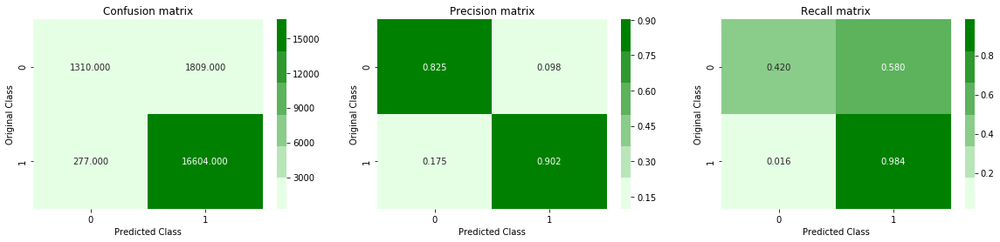

In [88]:
print("F1 Score: ",f1_score(y_test,pred))
print("******************************************")
plot_confusion_matrix(y_test, pred)

#### Important words

In [89]:
ft  = np.abs(xgb_bow.feature_importances_)
sorted_index = np.argsort(ft)[::-1]
top_20 = sorted_index[:20]
terms = text_bow_vectorizer.get_feature_names()
print('Top Twenty Words')
for ind in top_20:
    print(terms[ind])
top = sorted_index[:]
text=' '
for ind in top:
    text = text + terms[ind] + ' '
print(len(text))    

Top Twenty Words
not
great
good
tast
best
unfortun
product
love
use
disappoint
wont
delici
bad
money
perfect
thought
aw
littl
wast
like
74447


#### WordCloud

Feature importance WordClouds


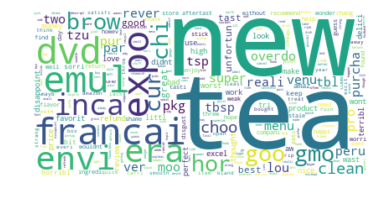

In [90]:
wc = WordCloud(background_color="white", max_words=len(text))
wc.generate(text)
print ("Feature importance WordClouds")
plt.imshow(wc, interpolation='bilinear')
plt.axis("off")
plt.show()

#### Important features plot

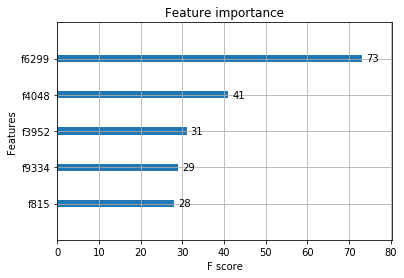

In [91]:
from xgboost import plot_importance
plot_importance(xgb_bow,max_num_features=5)
plt.show()

### Improving Xgboost model by taking more data,summary features and bi-gram

#### Accuracy and Loss

In [15]:
xgb_bow = xgb.XGBClassifier(n_estimators=500).fit(Train_bow,Y_train)
pred = xgb_bow.predict(Train_bow)
# evaluate accuracy
acc = accuracy_score(Y_train, pred) * 100
print('\nThe Train accuracy of the xgbdt classifier is %f%%' % (acc))
# predict the response
pred = xgb_bow.predict(Test_bow)
# evaluate accuracy
acc = accuracy_score(Y_test, pred) * 100
print('\nThe Test accuracy of the xgbdt classifier is %f%%' % (acc))

predict_y = xgb_bow.predict_proba(Train_bow)
print("The train log loss is:",log_loss(Y_train, predict_y, labels=xgb_bow.classes_, eps=1e-15))
predict_y = xgb_bow.predict_proba(Test_bow)
print("The test log loss is:",log_loss(Y_test, predict_y, labels=xgb_bow.classes_, eps=1e-15))


The Train accuracy of the xgbdt classifier is 93.255897%

The Test accuracy of the xgbdt classifier is 92.487128%
The train log loss is: 0.17656759527937163
The test log loss is: 0.19075479634613615


#### F1 Score and Confusion Matrix

F1 Score:  0.9568270399065849
******************************************


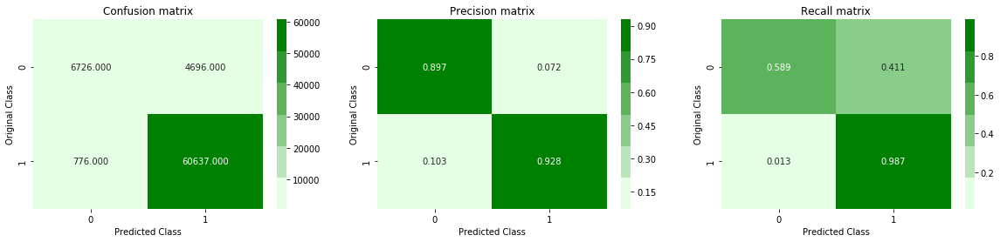

In [19]:
print("F1 Score: ",f1_score(Y_test,pred))
print("******************************************")
plot_confusion_matrix(Y_test, pred)

## Observations:

1.Thsi model is performimg well as like GBDT

2.Accuracy and Loss improved.

3.Precsion is good Recall is low

4.By hyperparameter tuning we can improve it furthers

# -----------------------------------------------------------------------------------------------------

### Reducing number of features for RBF Kernel

In [19]:
from sklearn.feature_selection import SelectFromModel
selection = SelectFromModel(gbdt, threshold=0.000001, prefit=True)
new_train = selection.transform(train_bow_text_feature_onehotCoding)
new_test=selection.transform(test_bow_text_feature_onehotCoding)
new_test.shape

(20000, 4020)

#### GridSearch

In [20]:
svm_clf = svm.SVC(class_weight='balanced')
start = time.time()
grid_parameters = {'C':[10**-2,10**0,10**2],'gamma':[10**-1,10**0,10**1]}
gridSearchModel = GridSearchCV(svm_clf, grid_parameters, cv=2,n_jobs=-1)
gridSearchModel.fit(new_train, y_train)
print(gridSearchModel.best_params_)
print('GridSearch Time: ',(time.time() - start))

{'C': 1, 'gamma': 1}
GridSearch Time:  8468.75942993164


In [21]:
svm = svm.SVC(gamma=gridSearchModel.best_params_['gamma'], C=gridSearchModel.best_params_['C'],probability=True,class_weight='balanced')
svm.fit(new_train, y_train)
tr_score = svm.score(new_train, y_train)
print("GridSearch")
print("Training Accuracy :",tr_score)
tr_score = svm.score(new_test, y_test)
print("Test Accuracy :",tr_score)
print("*************************Log Loss******************************")
predict_y = svm.predict_proba(new_train)
print("The train log loss is:",log_loss(y_train, predict_y, labels=svm.classes_, eps=1e-15))
predict_y = svm.predict_proba(new_test)
print("The test log loss is:",log_loss(y_test, predict_y, labels=svm.classes_, eps=1e-15))

GridSearch
Training Accuracy : 0.9085375
Test Accuracy : 0.8378
*************************Log Loss******************************
The train log loss is: 0.20223818119437284
The test log loss is: 0.34518559336499355


F1 Score:  0.8963247043783956
******************************************


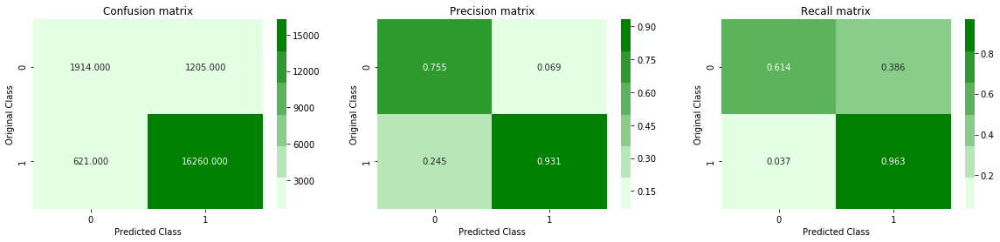

In [22]:
print("F1 Score: ",f1_score(y_test,svm.predict(new_test)))
print("******************************************")
plot_confusion_matrix(y_test, pred)

## Observations:

1.

# --------------------------------------------------------------------------------------------------------

## KNN on CleanedText with 2000 BOW features

In [96]:
bow_vectorizer = CountVectorizer(min_df = 10,max_features = 2000)
train_bow= bow_vectorizer.fit_transform(X_train['NewCleanedText'])
train_bow_features= bow_vectorizer.get_feature_names()
test_bow_features = bow_vectorizer.transform(X_test['NewCleanedText'])
print("Total number of unique words in train data :", len(train_bow_features))
train_bow = normalize(train_bow, axis=0)
# don't forget to normalize every feature
test_bow = normalize(test_bow_features, axis=0)

Total number of unique words in train data : 2000


### Hyperameter Tuning for no.of neighbours


The optimal number of neighbors is 7.


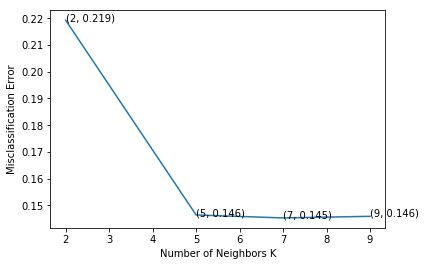

the misclassification error for each k value is :  [0.219 0.146 0.145 0.146]
Hyperparameter Tuning Time 879.0208823680878


In [97]:
start = time.time()
neighbors = [2,5,7,9]
# empty list that will hold cv scores
cv_scores = []
# perform 10-fold cross validation
for k in neighbors:
    knn = KNeighborsClassifier(n_neighbors=k,n_jobs = -1)
    scores = cross_val_score(knn, train_bow, y_train, scoring='accuracy')
    cv_scores.append(scores.mean())

# changing to misclassification error
MSE = [1 - x for x in cv_scores]
# determining best k
optimal_k = neighbors[MSE.index(min(MSE))]
print('\nThe optimal number of neighbors is %d.' % optimal_k)
# plot misclassification error vs k 
plt.plot(neighbors, MSE)
for xy in zip(neighbors, np.round(MSE,3)):
    plt.annotate('(%s, %s)' % xy, xy=xy, textcoords='data')

plt.xlabel('Number of Neighbors K')
plt.ylabel('Misclassification Error')
plt.show()
print("the misclassification error for each k value is : ", np.round(MSE,3))
print('Hyperparameter Tuning Time', (time.time()- start))

### Traing model on best parameter value

#### Accuracy and Loss

In [98]:
# instantiate learning model k = optimal_k
optimal_k = 7
knn_optimal = KNeighborsClassifier(n_neighbors=optimal_k)
# fitting the model
knn_optimal.fit(train_bow, y_train)
pred = knn_optimal.predict(train_bow)
# evaluate accuracy
acc = accuracy_score(y_train, pred) * 100
print('\nThe Train accuracy of the knn classifier for k = %d is %f%%' % (optimal_k, acc))
# predict the response
pred = knn_optimal.predict(test_bow)
# evaluate accuracy
acc = accuracy_score(y_test, pred) * 100
print('\nThe Test accuracy of the knn classifier for k = %d is %f%%' % (optimal_k, acc))

predict_y = knn_optimal.predict_proba(train_bow)
print("The train log loss is:",log_loss(y_train, predict_y, labels=knn_optimal.classes_, eps=1e-15))
predict_y = knn_optimal.predict_proba(test_bow)
print("The test log loss is:",log_loss(y_test, predict_y, labels=knn_optimal.classes_, eps=1e-15))


The Train accuracy of the knn classifier for k = 7 is 87.015000%

The Test accuracy of the knn classifier for k = 7 is 85.680000%
The train log loss is: 0.25885730635311843
The test log loss is: 1.4583853157202644


#### The difference between train and test loss is high this means our model is overfitting

#### F1 Score and Confusion matrix

F1 Score:  0.9202406149047567
******************************************


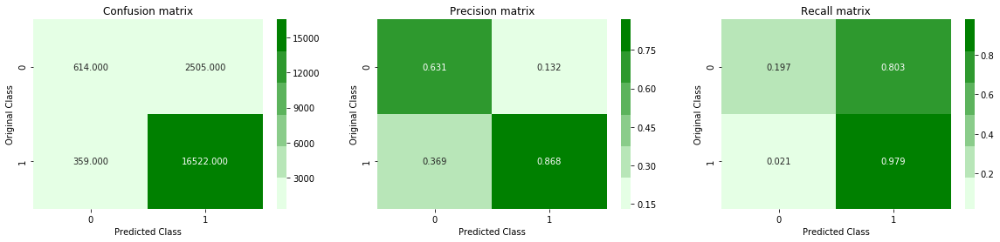

In [99]:
print("F1 Score: ",f1_score(y_test,pred))
print("******************************************")
plot_confusion_matrix(y_test, pred)

In [100]:
test_point_in = 0
predicted_cls = knn_optimal.predict(test_bow[test_point_in].reshape(1,-1))
print("Actual Class :", y_test[test_point_in])
print("Predicted Class :", predicted_cls[0])
print("Predicted Class Probabilities:", np.round(knn_optimal.predict_proba(test_bow[test_point_in].reshape(1,-1)),4))

neighbors = knn_optimal.kneighbors(test_bow[test_point_in].reshape(1, -1), 7)
print("The ",7," nearest neighbours of the test points belongs to classes",y_train[neighbors[1][0]])
print("Fequency of nearest points :",Counter(y_train[neighbors[1][0]]))

Actual Class : 1
Predicted Class : 1
Predicted Class Probabilities: [[0. 1.]]
The  7  nearest neighbours of the test points belongs to classes [1 1 1 1 1 1 1]
Fequency of nearest points : Counter({1: 7})


### Improving KNN model taking summary features and bi-gram

In [101]:
bow_summary_vectorizer = CountVectorizer(ngram_range=(1, 2),max_features = 1000)
train_summary_bow= bow_summary_vectorizer.fit_transform(X_train['NewCleanedSummary'])
train_bow_summary_features= bow_summary_vectorizer.get_feature_names()
test_bow_summary_features = bow_summary_vectorizer.transform(X_test['NewCleanedSummary'])
print("Total number of unique words in train data :", len(train_bow_summary_features))
train_summary_bow = normalize(train_summary_bow, axis=0)
# don't forget to normalize every feature
test_bow_summary_features = normalize(test_bow_summary_features, axis=0)

Total number of unique words in train data : 1000


In [102]:
train_sum_bow = hstack((train_summary_bow, train_bow)).tocsr()
test_sum_bow = hstack((test_bow_summary_features, test_bow)).tocsr()

#### Hyperparameter Tuning for K


The optimal number of neighbors is 7.


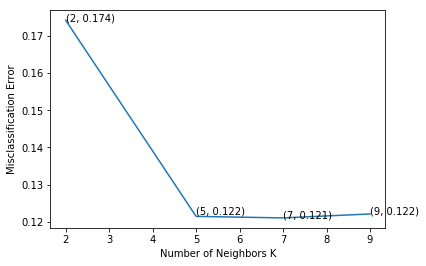

the misclassification error for each k value is :  [0.174 0.122 0.121 0.122]
Hyperparameter Tuning Time 849.5250408649445


In [103]:
start = time.time()
neighbors = [2,5,7,9]
# empty list that will hold cv scores
cv_scores = []
# perform 10-fold cross validation
for k in neighbors:
    knn = KNeighborsClassifier(n_neighbors=k,n_jobs = -1)
    scores = cross_val_score(knn, train_sum_bow, y_train, scoring='accuracy')
    cv_scores.append(scores.mean())

# changing to misclassification error
MSE = [1 - x for x in cv_scores]
# determining best k
optimal_k = neighbors[MSE.index(min(MSE))]
print('\nThe optimal number of neighbors is %d.' % optimal_k)
# plot misclassification error vs k 
plt.plot(neighbors, MSE)
for xy in zip(neighbors, np.round(MSE,3)):
    plt.annotate('(%s, %s)' % xy, xy=xy, textcoords='data')

plt.xlabel('Number of Neighbors K')
plt.ylabel('Misclassification Error')
plt.show()
print("the misclassification error for each k value is : ", np.round(MSE,3))
print('Hyperparameter Tuning Time', (time.time()- start))

### traing model on best K value

#### Accuracy and Loss

In [104]:
# instantiate learning model k = optimal_k
optimal_k = 7
knn_optimal = KNeighborsClassifier(n_neighbors=optimal_k)
# fitting the model
knn_optimal.fit(train_sum_bow, y_train)
pred = knn_optimal.predict(train_sum_bow)
# evaluate accuracy
acc = accuracy_score(y_train, pred) * 100
print('\nThe Train accuracy of the knn classifier for k = %d is %f%%' % (optimal_k, acc))
# predict the response
pred = knn_optimal.predict(test_sum_bow)
# evaluate accuracy
acc = accuracy_score(y_test, pred) * 100
print('\nThe Test accuracy of the knn classifier for k = %d is %f%%' % (optimal_k, acc))

predict_y = knn_optimal.predict_proba(train_sum_bow)
print("The train log loss is:",log_loss(y_train, predict_y, labels=knn_optimal.classes_, eps=1e-15))
predict_y = knn_optimal.predict_proba(test_sum_bow)
print("The test log loss is:",log_loss(y_test, predict_y, labels=knn_optimal.classes_, eps=1e-15))


The Train accuracy of the knn classifier for k = 7 is 89.126250%

The Test accuracy of the knn classifier for k = 7 is 88.165000%
The train log loss is: 0.21489414497248976
The test log loss is: 1.3248878348723259


#### F1 score and Confusion matrix

F1 Score:  0.9329822475155015
******************************************


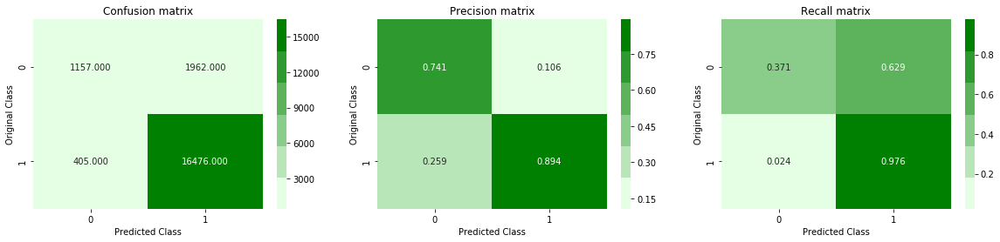

In [105]:
print("F1 Score: ",f1_score(y_test,pred))
print("******************************************")
plot_confusion_matrix(y_test, pred)

## Observations:

1. The difference between train and test loss is high so our model is overfitting.

2.It improved from previous model by adding features.

3.knn is not good for high dimensional data

# --------------------------------------------------------------------------------------------

##  KD Tree

### Truncated SVD to reduce the no. of features

#### Variance explained vs No. of features plot

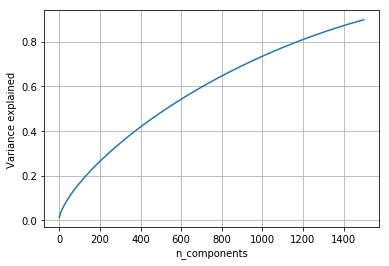

0.8981089080632377

In [106]:
from sklearn.decomposition import TruncatedSVD
svdT = TruncatedSVD(n_components=1500)
svdTFit = svdT.fit_transform(train_bow)

svdtest = svdT.fit_transform(test_bow)

explained_var = svdT.explained_variance_ratio_

e = np.cumsum(explained_var)

plt.plot(e)
plt.xlabel('n_components')
plt.grid()
plt.ylabel('Variance explained')
plt.show()

explained_var.sum()


#### Taking only top 200 features

In [107]:
from sklearn.decomposition import TruncatedSVD
svdT = TruncatedSVD(n_components=200)
svdTFit = svdT.fit_transform(train_bow)

svdtest = svdT.fit_transform(test_bow)


#### Accuracy and loss

In [108]:

optimal_k = 5
knn_kd = KNeighborsClassifier(algorithm='kd_tree')
# fitting the model
knn_kd.fit(svdTFit, y_train)
pred = knn_kd.predict(svdTFit)
# evaluate accuracy
acc = accuracy_score(y_train, pred) * 100
print('\nThe Train accuracy of the knn classifier for k = %d is %f%%' % (optimal_k, acc))
# predict the response
pred = knn_kd.predict(svdtest)
# evaluate accuracy
acc = accuracy_score(y_test, pred) * 100
print('\nThe Test accuracy of the knn classifier for k = %d is %f%%' % (optimal_k, acc))


The Train accuracy of the knn classifier for k = 5 is 89.506250%

The Test accuracy of the knn classifier for k = 5 is 81.175000%


In [109]:
predict_y = knn_kd.predict_proba(svdTFit)
print("The train log loss is:",log_loss(y_train, predict_y, labels=knn_optimal.classes_, eps=1e-15))
predict_y = knn_kd.predict_proba(svdtest)
print("The test log loss is:",log_loss(y_test, predict_y, labels=knn_optimal.classes_, eps=1e-15))

The train log loss is: 0.20668274305562132
The test log loss is: 3.1335636980112618


#### F1 Score andConfusion matrix

F1 Score:  0.8952974220640174
******************************************


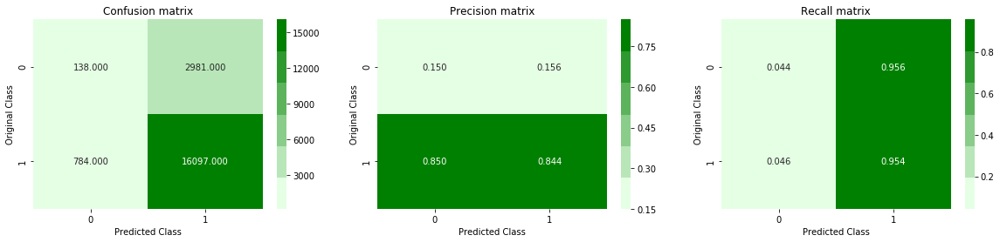

In [110]:
print("F1 Score: ",f1_score(y_test,pred))
print("******************************************")
plot_confusion_matrix(y_test, pred)

## Observations:

1.We only used top 200 features but result is not good 

2.our model is overfitting,we can improve it by increasing the no. of features.

3.The algorithm is have very high time complexities so in high dimensions it will take lot of time

4.KD tree is not good for Text Classifications

### Summerize all Models

In [11]:
y = PrettyTable(['Bag Of Word'])
print(y)
x  =PrettyTable(["Model", "Test Accuracy", "Train Loss",'Test Loss','F1 Score'])
x.add_row(['Naive Bayes',91.28,0.22,0.20,0.9501])
x.add_row(['Logistic Reg',94.36,0.12 , 0.17,0.9660])
x.add_row(['DT',63.88,0.51,0.61,0.724])
x.add_row(['Random Forest',84.31,0.400,0.400,0.914])
x.add_row(['GBDT',91.20,0.21,0.22,0.9498])
x.add_row(['XGBOOST',92.50,0.17,0.19,0.9568])
x.add_row(['Linear_SVM',94.69,0.17,0.21,0.9654])
x.add_row(['RBF-SVM',88.01,0.11,0.29,0.927])
x.add_row(['KNN',88.16,0.21,1.32,0.930])
x.add_row(['KNN-KDTree',88.01,0.20,3.13,0.8952])
print(x)

+-------------+
| Bag Of Word |
+-------------+
+-------------+
+---------------+---------------+------------+-----------+----------+
|     Model     | Test Accuracy | Train Loss | Test Loss | F1 Score |
+---------------+---------------+------------+-----------+----------+
|  Naive Bayes  |     91.28     |    0.22    |    0.2    |  0.9501  |
|  Logistic Reg |     94.36     |    0.12    |    0.17   |  0.966   |
|       DT      |     63.88     |    0.51    |    0.61   |  0.724   |
| Random Forest |     84.31     |    0.4     |    0.4    |  0.914   |
|      GBDT     |      91.2     |    0.21    |    0.22   |  0.9498  |
|    XGBOOST    |      92.5     |    0.17    |    0.19   |  0.9568  |
|   Linear_SVM  |     94.69     |    0.17    |    0.21   |  0.9654  |
|    RBF-SVM    |     88.01     |    0.11    |    0.29   |  0.927   |
|      KNN      |     88.16     |    0.21    |    1.32   |   0.93   |
|   KNN-KDTree  |     88.01     |    0.2     |    3.13   |  0.8952  |
+---------------+---------

## Overall Observation of Different Models:

1.Naive bayes ,Logistic Regression,Svm and Boosting model with less features are good for text classifications.

2.Decision tree ,Random forest are not good for high dimensional data like text data.they are performing very bad.

3.KNN is distance based technique so in high dimension it is also not good.and it require lot of time and memeory.


# ---------------------------///////////////////////////\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\-----------------------------

# TF-IDF featurization for various model on Text data

In [21]:
tf_idf_vectorizer = TfidfVectorizer(min_df=5)
train_tfidf = tf_idf_vectorizer.fit_transform(X_train['NewCleanedText'])
# we use the same vectorizer that was trained on train data
test_tfidf = tf_idf_vectorizer.transform(X_test['NewCleanedText'])
print("the shape of out train text TFIDF vectorizer ",train_tfidf.get_shape())
print("the shape of out test text TFIDF vectorizer ",test_tfidf.get_shape())

# normalize every feature
train_tfidf= normalize(train_tfidf, axis=0)
# normalize every feature
test_tfidf = normalize(test_tfidf, axis=0)

the shape of out train text TFIDF vectorizer  (80000, 10700)
the shape of out test text TFIDF vectorizer  (20000, 10700)


##  Naive Bayes on text data

#### GridSearch on alpha

In [11]:
clf= MultinomialNB()
grid_parameters = {'alpha':[0.00001, 0.0001, 0.001, 0.1, 1,1.1,1.5]}
grid_search = GridSearchCV(clf, grid_parameters, cv=10,scoring="neg_log_loss",n_jobs=-1)
grid_result = grid_search.fit(train_tfidf,y_train)

#### aplha vs loss plot

Best: 0.376429 using {'alpha': 0.1}
0.424017 (0.006477) with: {'alpha': 1e-05}
0.408974 (0.005187) with: {'alpha': 0.0001}
0.394806 (0.003938) with: {'alpha': 0.001}
0.376429 (0.001662) with: {'alpha': 0.1}
0.389510 (0.001032) with: {'alpha': 1}
0.390635 (0.001022) with: {'alpha': 1.1}
0.394547 (0.000985) with: {'alpha': 1.5}


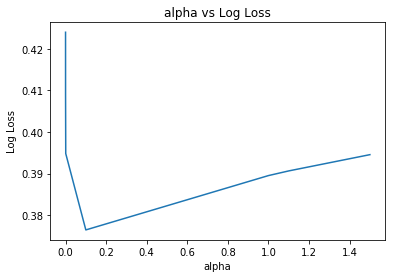

In [12]:
# summarize results
print("Best: %f using %s" % (-grid_result.best_score_, grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (-mean, stdev, param))
# plot
plt.errorbar([0.00001, 0.0001, 0.001, 0.1, 1,1.1,1.5], -means)
plt.title("alpha vs Log Loss")
plt.xlabel('alpha')
plt.ylabel('Log Loss')
plt.show()

### Training model with best parameters

#### Accuracy and Loss

In [13]:
optimal_i=0.1
nb_tfidf = MultinomialNB(alpha=optimal_i)
# fitting the model
nb_tfidf.fit(train_tfidf, y_train,sample_weight = 0.1)
pred = nb_tfidf.predict(train_tfidf)
# evaluate accuracy
acc = accuracy_score(y_train, pred) * 100
print('\nThe Train accuracy of the NB classifier for i = %d is %f%%' % (optimal_i, acc))
# predict the response
pred = nb_tfidf.predict(test_tfidf)
# evaluate accuracy
acc = accuracy_score(y_test, pred) * 100
print('\nThe Test accuracy of the NB classifier for i = %d is %f%%' % (optimal_i, acc))
print('*******************Log Loss*****************')
predict_y = nb_tfidf.predict_proba(train_tfidf)
print('GridSearch')
print("The train log loss is:",log_loss(y_train, predict_y, labels=nb_tfidf.classes_, eps=1e-15))
predict_y = nb_tfidf.predict_proba(test_tfidf)
print("The test log loss is:",log_loss(y_test, predict_y, labels=nb_tfidf.classes_, eps=1e-15))


The Train accuracy of the NB classifier for i = 0 is 84.567500%

The Test accuracy of the NB classifier for i = 0 is 85.010000%
*******************Log Loss*****************
GridSearch
The train log loss is: 0.37563330021679164
The test log loss is: 0.35852488387763926


#### F1 Score and Confusion matrix

F1 Score:  0.9182214948172395
******************************************


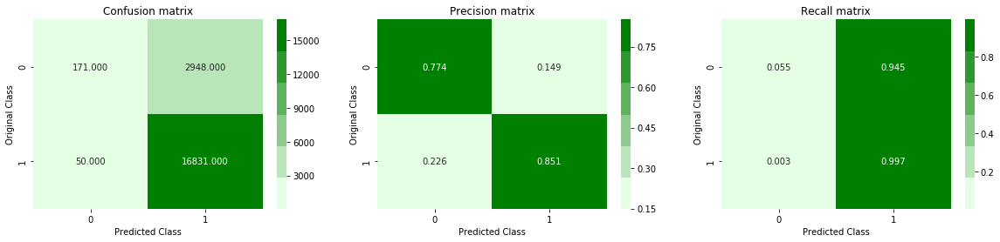

In [14]:
from sklearn.metrics import f1_score
print("F1 Score: ",f1_score(y_test,pred))
print("******************************************")
plot_confusion_matrix(y_test, pred)

#### AUC

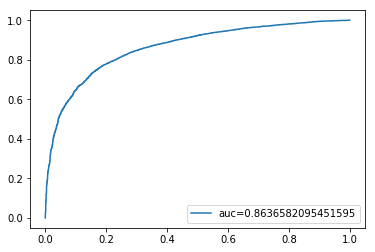

In [15]:
y_pred_proba = nb_tfidf.predict_proba(test_tfidf)[::,1]
fpr, tpr, _ = metrics.roc_curve(y_test,  y_pred_proba)
auc = metrics.roc_auc_score(y_test, y_pred_proba)
plt.plot(fpr,tpr,label="auc="+str(auc))
plt.legend(loc=4)
plt.show()

#### Top positive and Neagative words

In [16]:
pos_class_prob_sorted = nb_tfidf.feature_log_prob_[0, :].argsort()
neg_class_prob_sorted = nb_tfidf.feature_log_prob_[1, :].argsort()
topn = neg_class_prob_sorted[:10]
topp = pos_class_prob_sorted[:10]

terms = tf_idf_vectorizer.get_feature_names()
#ter= tf_idf_vect.get_feature_names()
print('*********Neagative words  ****')
for ind in topn:
    #if ind < len(ter)+1:
        #print(' ',ter[ind])
    if ind < len(terms) + 1:
        print(' ',terms[ind])
print('*******positive words   ******')    
for ind in topp:
    #if ind < len(ter)+1:
       # print(ter[ind])
    if ind < len(terms) + 1:
        print(terms[ind])

*********Neagative words  ****
  liar
  inexcus
  martek
  disruptor
  misrepres
  font
  blandest
  lesion
  weakest
  petrolatum
*******positive words   ******
aafco
dimension
dino
scotia
director
scope
scoobi
scovi
scof
schlep


### Improving NB by adding more data ,summary features and bi-gram

In [20]:
tfidf_vect = TfidfVectorizer(ngram_range=(1, 2),min_df=10)
sum_train_tfidf = tfidf_vect.fit_transform(X_Train['NewCleanedSummary'])
# we use the same vectorizer that was trained on train data
sum_test_tfidf = tfidf_vect.transform(X_Test['NewCleanedSummary'])
print("the shape of out train summary text TFIDF vectorizer ",sum_train_tfidf.get_shape())
print("the shape of out test summary text TFIDF vectorizer ",sum_test_tfidf.get_shape())

# don't forget to normalize every feature
sum_train_tfidf = normalize(sum_train_tfidf, axis=0)
# don't forget to normalize every feature
sum_test_tfidf = normalize(sum_test_tfidf, axis=0)


tfidf_vectorizer = TfidfVectorizer(ngram_range = (1,2),min_df=20)
Train_tfidf = tfidf_vectorizer.fit_transform(X_Train['NewCleanedText'])
# we use the same vectorizer that was trained on train data
Test_tfidf = tfidf_vectorizer.transform(X_Test['NewCleanedText'])
print("the shape of out train text TFIDF vectorizer ",Train_tfidf.get_shape())
print("the shape of out test text TFIDF vectorizer ",Test_tfidf.get_shape())

# don't forget to normalize every feature
Train_tfidf= normalize(Train_tfidf, axis=0)
# don't forget to normalize every feature
Test_tfidf = normalize(Test_tfidf, axis=0)

train_sum_text_tfidf = hstack((sum_train_tfidf, Train_tfidf)).tocsr()
test_sum_text_tfidf = hstack((sum_test_tfidf, Test_tfidf)).tocsr()

the shape of out train summary text TFIDF vectorizer  (291336, 10603)
the shape of out test summary text TFIDF vectorizer  (72835, 10603)
the shape of out train text TFIDF vectorizer  (291336, 84317)
the shape of out test text TFIDF vectorizer  (72835, 84317)


#### GridSearch on alpha

In [20]:
clf= MultinomialNB()
grid_parameters = {'alpha':[0.00001, 0.0001, 0.001, 0.1, 1,1.1,1.5]}
grid_search = GridSearchCV(clf, grid_parameters, cv=10,scoring="neg_log_loss",n_jobs=-1)
grid_result = grid_search.fit(train_sum_text_tfidf,Y_train)

#### alpha vs log loss

Best: 0.238216 using {'alpha': 0.1}
0.258756 (0.002934) with: {'alpha': 1e-05}
0.248306 (0.002311) with: {'alpha': 0.0001}
0.239564 (0.001739) with: {'alpha': 0.001}
0.238216 (0.000998) with: {'alpha': 0.1}
0.285758 (0.000795) with: {'alpha': 1}
0.289316 (0.000783) with: {'alpha': 1.1}
0.301697 (0.000738) with: {'alpha': 1.5}


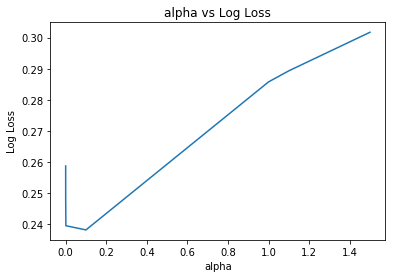

In [21]:
# summarize results
print("Best: %f using %s" % (-grid_result.best_score_, grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (-mean, stdev, param))
# plot
plt.errorbar([0.00001, 0.0001, 0.001, 0.1, 1,1.1,1.5], -means)
plt.title("alpha vs Log Loss")
plt.xlabel('alpha')
plt.ylabel('Log Loss')
plt.show()

### Training model on best parameter

#### Accuracy and Loss

In [22]:
optimal_i=0.1
nb_sum_text_tfidf = MultinomialNB(alpha=optimal_i)
# fitting the model
nb_sum_text_tfidf.fit(train_sum_text_tfidf, Y_train,sample_weight = 0.1)
pred = nb_sum_text_tfidf.predict(train_sum_text_tfidf)
# evaluate accuracy
acc = accuracy_score(Y_train, pred) * 100
print('\nThe Train accuracy of the NB classifier for i = %d is %f%%' % (optimal_i, acc))
# predict the response
pred = nb_sum_text_tfidf.predict(test_sum_text_tfidf)
# evaluate accuracy
acc = accuracy_score(Y_test, pred) * 100
print('\nThe Test accuracy of the NB classifier for i = %d is %f%%' % (optimal_i, acc))
print('*******************Log Loss*****************')
predict_y = nb_sum_text_tfidf.predict_proba(train_sum_text_tfidf)
print('GridSearch')
print("The train log loss is:",log_loss(Y_train, predict_y, labels=nb_sum_text_tfidf.classes_, eps=1e-15))
predict_y = nb_sum_text_tfidf.predict_proba(test_sum_text_tfidf)
print("The test log loss is:",log_loss(Y_test, predict_y, labels=nb_sum_text_tfidf.classes_, eps=1e-15))


The Train accuracy of the NB classifier for i = 0 is 87.482151%

The Test accuracy of the NB classifier for i = 0 is 91.133384%
*******************Log Loss*****************
GridSearch
The train log loss is: 0.26252646063720514
The test log loss is: 0.2141234034212259


#### F1 Score and Confusion matrix

F1 Score:  0.9495200575305631
******************************************


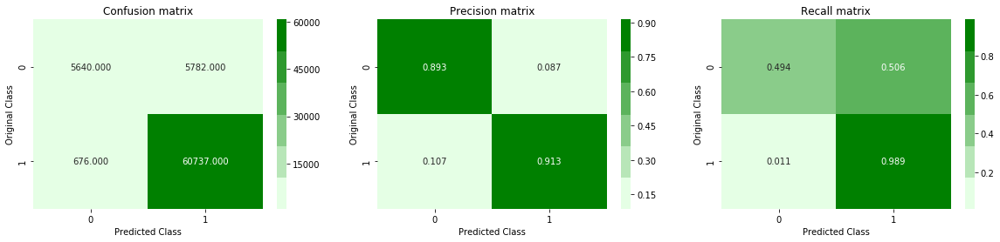

In [23]:
from sklearn.metrics import f1_score
print("F1 Score: ",f1_score(Y_test,pred))
print("******************************************")
plot_confusion_matrix(Y_test, pred)

## Observations:

1.

# ------------------------------------------------------------------------------------------------

## Logistic Regression on text

#### Grid Search  and Random Searchon C and Penalty

In [24]:
log_reg = LogisticRegression(solver = 'liblinear')
start = time.time()
grid_parameters = {'C':[10**-2, 10**-1, 1, 10, 100],'penalty':['l1','l2']}
gridSearchModel = GridSearchCV(log_reg, grid_parameters, cv=10,n_jobs = -1,scoring="neg_log_loss")
gridSearchModel.fit(train_tfidf, y_train)
print("GridSearch:",gridSearchModel.best_params_)

random_parameters = {'C':uniform(),'penalty':['l1','l2']}
randomSearchModel = RandomizedSearchCV(log_reg, random_parameters, cv=10,n_jobs = -1,scoring="neg_log_loss")
randomSearchModel.fit(train_tfidf, y_train)
print("randomSearch:",randomSearchModel.best_params_)
print('GridSearch and Random Search Time: ',(time.time()-start))

GridSearch: {'C': 10, 'penalty': 'l1'}
randomSearch: {'C': 0.9619085262201987, 'penalty': 'l1'}
GridSearch and Random Search Time:  100.33542895317078


### Training model with best parameters

#### Accuracy and Log-loss

In [25]:
log_reg_gs = LogisticRegression(n_jobs=-1,class_weight='balanced',penalty=gridSearchModel.best_params_['penalty'], C=gridSearchModel.best_params_['C'],solver = 'liblinear',)
log_reg_gs.fit(train_tfidf, y_train)
tr_score = log_reg_gs.score(train_tfidf, y_train)
print("GridSearch")
print("Training Accuracy :",tr_score)
tr_score = log_reg_gs.score(test_tfidf, y_test)
print("Test Accuracy :",tr_score)
print('-------------------------------------------------------------------')
log_reg_rs = LogisticRegression(class_weight='balanced',n_jobs = -1,penalty=randomSearchModel.best_params_['penalty'], C=randomSearchModel.best_params_['C'],solver = 'liblinear',)
log_reg_rs.fit(train_tfidf, y_train)
tr_score = log_reg_rs.score(train_tfidf, y_train)
print("RandomSearch")
print("Training Accuracy :",tr_score)
tr_score = log_reg_rs.score(test_tfidf, y_test)
print("Test Accuracy :",tr_score)
print("**************************************************************************")
print("Log Loss")
print("**************************************************************************")
predict_y = log_reg_gs.predict_proba(train_tfidf)
print('GridSearch')
print("The train log loss is:",log_loss(y_train, predict_y, labels=log_reg_gs.classes_, eps=1e-15))
predict_y = log_reg_gs.predict_proba(test_tfidf)
print("The test log loss is:",log_loss(y_test, predict_y, labels=log_reg_gs.classes_, eps=1e-15))
print('-----------------------------------------------')
print('RandomSearch')
predict_y = log_reg_rs.predict_proba(train_tfidf)
print("The train log loss is:",log_loss(y_train, predict_y, labels=log_reg_rs.classes_, eps=1e-15))
predict_y = log_reg_rs.predict_proba(test_tfidf)
print("The test log loss is:",log_loss(y_test, predict_y, labels=log_reg_rs.classes_, eps=1e-15))

GridSearch
Training Accuracy : 0.9370125
Test Accuracy : 0.88475
-------------------------------------------------------------------
RandomSearch
Training Accuracy : 0.8856
Test Accuracy : 0.878
**************************************************************************
Log Loss
**************************************************************************
GridSearch
The train log loss is: 0.17485681325413885
The test log loss is: 0.43214149637746113
-----------------------------------------------
RandomSearch
The train log loss is: 0.2990503643650412
The test log loss is: 0.318072623440749


#### F1 Score and Confusion matrix

GridSearch
F1 Score:  0.9292010934668428
******************************************


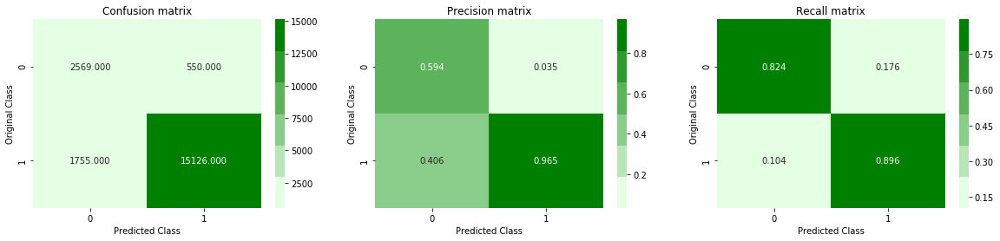

******************************************************************************************************************
RandomSearch
F1 Score:  0.9240679653949089
************************************************************************************************


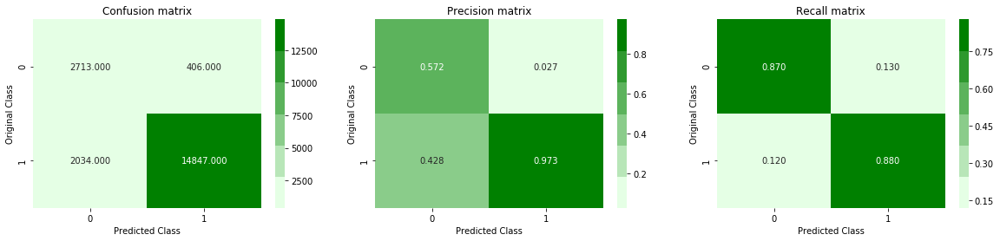

In [26]:
print('GridSearch')
print("F1 Score: ",f1_score(y_test,log_reg_gs.predict(test_tfidf)))
print("******************************************")
plot_confusion_matrix(y_test, log_reg_gs.predict(test_tfidf))
print('******************************************************************************************************************')
print('RandomSearch')
print("F1 Score: ",f1_score(y_test,log_reg_rs.predict(test_tfidf)))
print("************************************************************************************************")
plot_confusion_matrix(y_test, log_reg_rs.predict(test_tfidf))

In [27]:
test_point_in = 2
predicted_cls = log_reg_gs.predict(test_tfidf[test_point_in].reshape(1,-1))
print("Actual Class :", y_test[test_point_in])
print('GridSearch')
print("Predicted Class :", predicted_cls[0])
print("Predicted Class Probabilities:", np.round(log_reg_gs.predict_proba(test_tfidf[test_point_in].reshape(1,-1)),4))

print('----------------------------------------------------')
predicted_cls = log_reg_rs.predict(test_tfidf[test_point_in].reshape(1,-1))
print('RandomSearch')
print("Predicted Class :", predicted_cls[0])
print("Predicted Class Probabilities:", np.round(log_reg_rs.predict_proba(test_tfidf[test_point_in].reshape(1,-1)),4))

Actual Class : 1
GridSearch
Predicted Class : 1
Predicted Class Probabilities: [[5.000e-04 9.995e-01]]
----------------------------------------------------
RandomSearch
Predicted Class : 1
Predicted Class Probabilities: [[0.1039 0.8961]]


#### Imporatant words

In [28]:
wt = np.abs(log_reg_rs.coef_[0])
sorted_index = np.argsort(wt)[::-1]
top_10 = sorted_index[:20]
terms = tf_idf_vectorizer.get_feature_names()
for ind in top_10:
    print(terms[ind])

great
love
not
best
delici
good
perfect
disappoint
excel
favorit
nice
easi
worst
amaz
find
happi
wonder
enjoy
return
keep


##  Improving Log Reg by adding more data,summary features and bi-grams

#### GridSearch and RandomSearch on C and Penalty

In [29]:
log_reg = LogisticRegression(solver = 'liblinear')
start = time.time()
grid_parameters = {'C':[10**-2, 10**-1, 1, 10, 100],'penalty':['l1','l2']}
gridSearchModel = GridSearchCV(log_reg, grid_parameters, cv=5,n_jobs = -1,scoring="neg_log_loss")
gridSearchModel.fit(train_sum_text_tfidf, Y_train)
print("GridSearch:",gridSearchModel.best_params_)

random_parameters = {'C':uniform(),'penalty':['l1','l2']}
randomSearchModel = RandomizedSearchCV(log_reg, random_parameters, cv=5,n_jobs = -1,scoring="neg_log_loss")
randomSearchModel.fit(train_sum_text_tfidf, Y_train)
print("randomSearch:",randomSearchModel.best_params_)
print('GridSearch and Random Search Time: ',(time.time()-start))

GridSearch: {'C': 10, 'penalty': 'l1'}
randomSearch: {'C': 0.7283088603990288, 'penalty': 'l1'}
GridSearch and Random Search Time:  447.8208911418915


### Traing model on best value of C and penalty

#### Accuracy and Log Loss

In [30]:
log_reg_gs = LogisticRegression(n_jobs=-1,class_weight='balanced',penalty=gridSearchModel.best_params_['penalty'], C=gridSearchModel.best_params_['C'],solver = 'liblinear',)
log_reg_gs.fit(train_sum_text_tfidf, Y_train)
tr_score = log_reg_gs.score(train_sum_text_tfidf, Y_train)
print("GridSearch")
print("Training Accuracy :",tr_score)
tr_score = log_reg_gs.score(test_sum_text_tfidf, Y_test)
print("Test Accuracy :",tr_score)
print('-------------------------------------------------------------------')
log_reg_rs = LogisticRegression(class_weight='balanced',n_jobs = -1,penalty=randomSearchModel.best_params_['penalty'], C=randomSearchModel.best_params_['C'],solver = 'liblinear',)
log_reg_rs.fit(train_sum_text_tfidf, Y_train)
tr_score = log_reg_rs.score(train_sum_text_tfidf, Y_train)
print("RandomSearch")
print("Training Accuracy :",tr_score)
tr_score = log_reg_rs.score(test_sum_text_tfidf, Y_test)
print("Test Accuracy :",tr_score)
print("**************************************************************************")
print("Log Loss")
print("**************************************************************************")
predict_y = log_reg_gs.predict_proba(train_sum_text_tfidf)
print('GridSearch')
print("The train log loss is:",log_loss(Y_train, predict_y, labels=log_reg_gs.classes_, eps=1e-15))
predict_y = log_reg_gs.predict_proba(test_sum_text_tfidf)
print("The test log loss is:",log_loss(Y_test, predict_y, labels=log_reg_gs.classes_, eps=1e-15))
print('-----------------------------------------------')
print('RandomSearch')
predict_y = log_reg_rs.predict_proba(train_sum_text_tfidf)
print("The train log loss is:",log_loss(Y_train, predict_y, labels=log_reg_rs.classes_, eps=1e-15))
predict_y = log_reg_rs.predict_proba(test_sum_text_tfidf)
print("The test log loss is:",log_loss(Y_test, predict_y, labels=log_reg_rs.classes_, eps=1e-15))

GridSearch
Training Accuracy : 0.9918341708542714
Test Accuracy : 0.9422804970137983
-------------------------------------------------------------------
RandomSearch
Training Accuracy : 0.9393758409534009
Test Accuracy : 0.9273014347497769
**************************************************************************
Log Loss
**************************************************************************
GridSearch
The train log loss is: 0.04009996130595806
The test log loss is: 0.2534472403519101
-----------------------------------------------
RandomSearch
The train log loss is: 0.19257590521526985
The test log loss is: 0.20775219231119887


#### F1 Score and Confusion matrix

GridSearch
F1 Score:  0.9652078919491526
******************************************


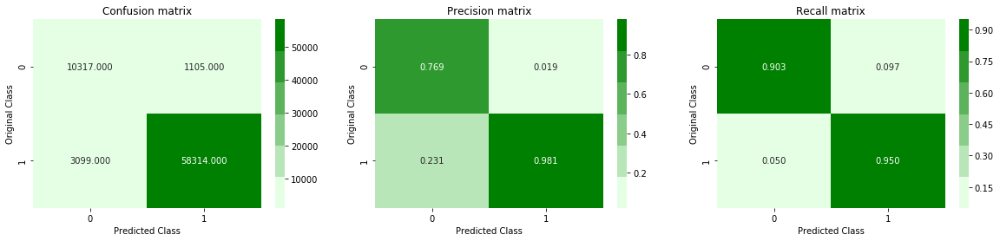

******************************************************************************************************************
RandomSearch
F1 Score:  0.9555382018792353
************************************************************************************************


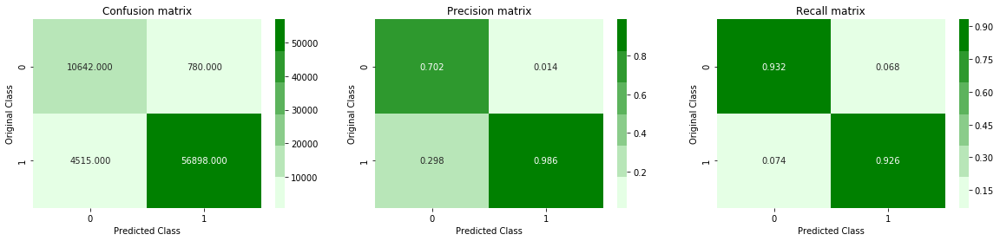

In [31]:
print('GridSearch')
print("F1 Score: ",f1_score(Y_test,log_reg_gs.predict(test_sum_text_tfidf)))
print("******************************************")
plot_confusion_matrix(Y_test, log_reg_gs.predict(test_sum_text_tfidf))
print('******************************************************************************************************************')
print('RandomSearch')
print("F1 Score: ",f1_score(Y_test,log_reg_rs.predict(test_sum_text_tfidf)))
print("************************************************************************************************")
plot_confusion_matrix(Y_test, log_reg_rs.predict(test_sum_text_tfidf))

## Observations:

1.Accuracy and log loss improved .

2.train and test loss are close so not overfitting.

3.Both precsion and recall are good.

4.by adding summary features and bi-gram our model performance increases.

5.Logistic Regression is work well in high dimensions

# ---------------------------------------------------------------------------------------------

## Linear SVM on Text 

#### GridSearch

In [22]:
from sklearn.svm import LinearSVC
svm_clf = LinearSVC(loss = 'hinge',class_weight ='balanced')
start= time.time()
grid_parameters = {'C':[10**-3,10**-2,10**0,10**2,10**3]}
gridSearchModel = GridSearchCV(svm_clf, grid_parameters, cv=10,n_jobs=-1)
gridSearchModel.fit(train_tfidf, y_train)
print(gridSearchModel.best_params_)
print('GridSearch Time: ',(time.time() - start))

{'C': 1}
GridSearch Time:  92.42303514480591


#### C vs Loss

Best: -0.887288 using {'C': 1}
-0.687562 (0.004814) with: {'C': 0.001}
-0.687550 (0.004801) with: {'C': 0.01}
-0.887288 (0.003490) with: {'C': 1}
-0.872750 (0.003380) with: {'C': 100}
-0.866525 (0.014014) with: {'C': 1000}


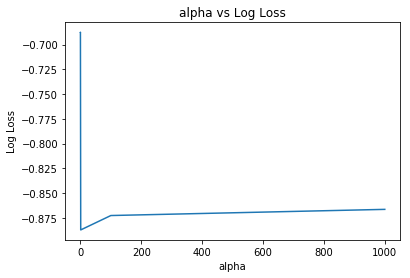

In [23]:
print("Best: %f using %s" % (-gridSearchModel.best_score_, gridSearchModel.best_params_))
means = gridSearchModel.cv_results_['mean_test_score']
stds = gridSearchModel.cv_results_['std_test_score']
params = gridSearchModel.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (-mean, stdev, param))
# plot
plt.errorbar([10**-3,10**-2,10**0,10**2,10**3], -means)
plt.title("alpha vs Log Loss")
plt.xlabel('alpha')
plt.ylabel('Log Loss')
plt.show()

### Training model on best parameter

#### ACcuracy and Hinge Loss

In [24]:
lr_svm = LinearSVC( C=gridSearchModel.best_params_['C'],class_weight='balanced',penalty='l1',dual=False)
lr_svm.fit(train_tfidf, y_train)
tr_score = lr_svm.score(train_tfidf, y_train)
print("GridSearch")
print("Training Accuracy :",tr_score)
tr_score = lr_svm.score(test_tfidf, y_test)
print("Test Accuracy :",tr_score)
print('******************Hinge Loss***************')
print("Train loss :",hinge_loss(y_train,lr_svm.predict(train_tfidf)))
print("Test loss :",hinge_loss(y_test,lr_svm.predict(test_tfidf)))

GridSearch
Training Accuracy : 0.9209625
Test Accuracy : 0.8894
******************Hinge Loss***************
Train loss : 0.235
Test loss : 0.26655


#### F1 Score and Confusion matrix

F1 Score:  0.9318251864636627
******************************************


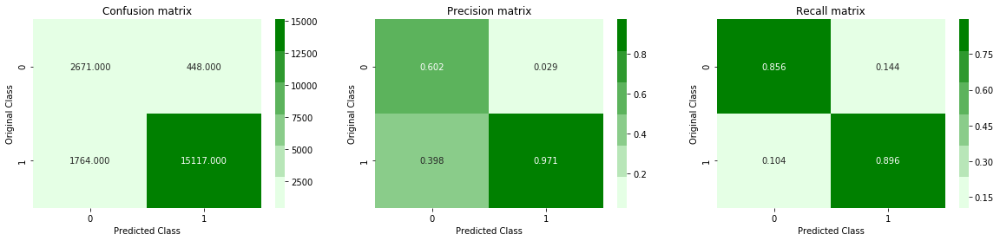

In [25]:
print("F1 Score: ",f1_score(y_test,lr_svm.predict(test_tfidf)))
print("******************************************")
plot_confusion_matrix(y_test, lr_svm.predict(test_tfidf))

#### Important words

In [26]:
wt = np.abs(lr_svm.coef_[0])
sorted_index = np.argsort(wt)[::-1]
top_10 = sorted_index[:10]
terms = tf_idf_vectorizer.get_feature_names()
top = sorted_index[:]
text=' '
for ind in top:
    if ind < len(terms):
        text = text + terms[ind] + ' '
for ind in top_10:
    print(terms[ind])

great
love
not
best
delici
good
perfect
excel
disappoint
nice


## Improving model by taking more data,summary features and bi-grams

#### GridSearch

In [27]:
from sklearn.svm import LinearSVC
svm_clf = LinearSVC(loss = 'hinge',class_weight ='balanced')
start= time.time()
grid_parameters = {'C':[10**-3,10**-2,10**0,10**2,10**3]}
gridSearchModel = GridSearchCV(svm_clf, grid_parameters, cv=10,n_jobs=-1)
gridSearchModel.fit(train_sum_text_tfidf, Y_train)
print(gridSearchModel.best_params_)
print('GridSearch Time: ',(time.time() - start))

{'C': 1}
GridSearch Time:  558.3719637393951


#### C vs Hinge Loss

Best: -0.944459 using {'C': 1}
-0.750467 (0.003084) with: {'C': 0.001}
-0.750474 (0.003087) with: {'C': 0.01}
-0.944459 (0.001072) with: {'C': 1}
-0.933091 (0.001208) with: {'C': 100}
-0.932676 (0.001423) with: {'C': 1000}


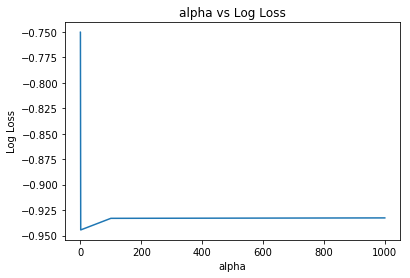

In [28]:
print("Best: %f using %s" % (-gridSearchModel.best_score_, gridSearchModel.best_params_))
means = gridSearchModel.cv_results_['mean_test_score']
stds = gridSearchModel.cv_results_['std_test_score']
params = gridSearchModel.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (-mean, stdev, param))
# plot
plt.errorbar([10**-3,10**-2,10**0,10**2,10**3], -means)
plt.title("alpha vs Log Loss")
plt.xlabel('alpha')
plt.ylabel('Log Loss')
plt.show()

### Training model on best parameter

#### Accuracy and Hinge Loss

In [29]:
lr_svm = LinearSVC( C=gridSearchModel.best_params_['C'],class_weight='balanced',penalty='l1',dual=False)
lr_svm.fit(train_sum_text_tfidf, Y_train)
tr_score = lr_svm.score(train_sum_text_tfidf, Y_train)
print("GridSearch")
print("Training Accuracy :",tr_score)
tr_score = lr_svm.score(test_sum_text_tfidf, Y_test)
print("Test Accuracy :",tr_score)
print('******************Hinge Loss***************')
print("Train loss :",hinge_loss(Y_train,lr_svm.predict(train_sum_text_tfidf)))
print("Test loss :",hinge_loss(Y_test,lr_svm.predict(test_sum_text_tfidf)))

GridSearch
Training Accuracy : 0.9757874069802565
Test Accuracy : 0.9415528248781493
******************Hinge Loss***************
Train loss : 0.1810349562017739
Test loss : 0.2152673851856937


#### F1 Score and Confusion Matrix

F1 Score:  0.9646172899021719
******************************************


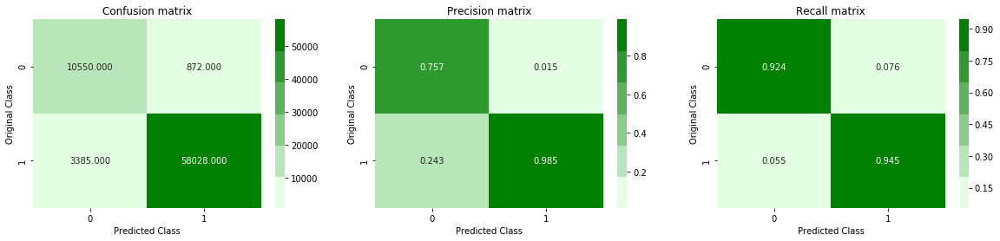

In [30]:
print("F1 Score: ",f1_score(Y_test,lr_svm.predict(test_sum_text_tfidf)))
print("******************************************")
plot_confusion_matrix(Y_test, lr_svm.predict(test_sum_text_tfidf))

#### Important Words

In [33]:
wt = np.abs(lr_svm.coef_[0])
sorted_index = np.argsort(wt)[::-1]
top_10 = sorted_index[:10]
terms = tfidf_vectorizer.get_feature_names()
term = tfidf_vect.get_feature_names()
print('Top Twenty ReviewText and Summary Words')
for ind in top_10:
    
    if ind < (len(terms) + 1): 
        
        print(terms[ind])
    if ind < (len(term) + 1):
        print(term[ind])

Top Twenty ReviewText and Summary Words
babi white
great
add light
best
love someth
becom famili
love
amazon come
delici
avail direct
good
pack packag
anyon wonder
excel
long even
better spend
not


## Observations:

1.improvement in accuracy and hinge loss.

2.Precision and recall both are good.

3.Both train and test loss have less difference so their is no overfitting.

4.Summary features and bi-gram are improving our model

# -------------------------------------------------------------------------------------------

## DT on text data

#### GridSearch on max_depth

In [32]:
dt = tree.DecisionTreeClassifier(class_weight='balanced')
grid_parameters = {"max_depth": range(2,10)}
grid_search = GridSearchCV(dt, grid_parameters, cv=5,scoring="neg_log_loss")
grid_result = grid_search.fit(train_tfidf,y_train)

#### max_depth vs loss

Best: 0.594364 using {'max_depth': 5}
0.640315 (0.002172) with: {'max_depth': 2}
0.621184 (0.003169) with: {'max_depth': 3}
0.607783 (0.004032) with: {'max_depth': 4}
0.594364 (0.005379) with: {'max_depth': 5}
0.595091 (0.005444) with: {'max_depth': 6}
0.598421 (0.005610) with: {'max_depth': 7}
0.613751 (0.010538) with: {'max_depth': 8}
0.647303 (0.005955) with: {'max_depth': 9}


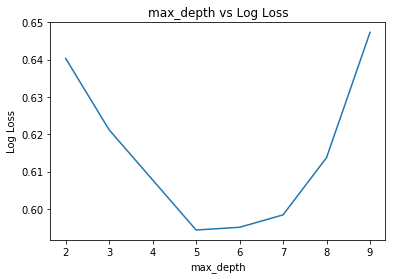

In [33]:
# summarize results
print("Best: %f using %s" % (-grid_result.best_score_, grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (-mean, stdev, param))
# plot
plt.errorbar(range(2,10), -means)
plt.title("max_depth vs Log Loss")
plt.xlabel('max_depth')
plt.ylabel('Log Loss')
plt.show()

### Training model on best parameter

#### Accuaracy and Loss

In [34]:
dt_tfidf = tree.DecisionTreeClassifier(max_depth = 5,class_weight='balanced')
dt_tfidf = dt_tfidf.fit(train_tfidf,y_train)
pred = dt_tfidf.predict(train_tfidf)
# evaluate accuracy
acc = accuracy_score(y_train, pred) * 100
print('\nThe Train accuracy of the DT classifier is %f%%' % (acc))
# predict the response
pred = dt_tfidf.predict(test_tfidf)
# evaluate accuracy
acc = accuracy_score(y_test, pred) * 100
print('\nThe Test accuracy of the DT classifier is %f%%' % (acc))
print('********************Log Loss********************')
predict_y = dt_tfidf.predict_proba(train_tfidf)
print('GridSearch')
print("The train log loss is:",log_loss(y_train, predict_y, labels=dt_tfidf.classes_, eps=1e-15))
predict_y = dt_tfidf.predict_proba(test_tfidf)
print("The test log loss is:",log_loss(y_test, predict_y, labels=dt_tfidf.classes_, eps=1e-15))


The Train accuracy of the DT classifier is 55.456250%

The Test accuracy of the DT classifier is 58.925000%
********************Log Loss********************
GridSearch
The train log loss is: 0.5828583500817146
The test log loss is: 0.5755957873419022


#### F1 Score and Confusion matrix

GridSearch
F1 Score:  0.6929545879274902
******************************************


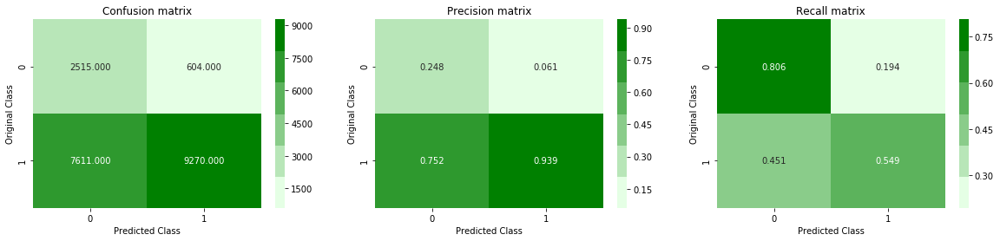

In [35]:
print('GridSearch')
print("F1 Score: ",f1_score(y_test,dt_tfidf.predict(test_tfidf)))
print("******************************************")
plot_confusion_matrix(y_test, dt_tfidf.predict(test_tfidf))

#### Important words

In [36]:
ft  = np.abs(dt_tfidf.feature_importances_)
sorted_index = np.argsort(ft)[::-1]
top_20 = sorted_index[:10]
terms = tf_idf_vectorizer.get_feature_names()
#term = tf_idf_vect.get_feature_names()
print('Top Twenty Words')
for ind in top_10:
    
    if ind < (len(terms) + 1): 
        
        print(terms[ind])
    #if ind < (len(term) + 1):
        #print(term[ind])
              
top = sorted_index[:]
text=' '
for ind in top:
    if ind < len(terms):
        text = text + terms[ind] + ' '
    #if ind < len(term):
        #text = text + term[ind] + ' '
print(len(text))    

Top Twenty Words
great
love
not
best
delici
good
perfect
disappoint
excel
favorit
nice
easi
worst
amaz
find
happi
wonder
enjoy
return
keep
74447


#### Creating pdf file of Decsion tree

In [37]:
from sklearn.externals.six import StringIO  
import pydot 
dot_data = StringIO() 
tree.export_graphviz(dt_tfidf, out_file=dot_data) 
graph = pydot.graph_from_dot_data(dot_data.getvalue()) 
graph[0].write_pdf("dt_tfidf.pdf") 

### Improving DT by taking more data ,Summary features and bi-grams and reducing number of features

In [9]:
tfidf_vect = TfidfVectorizer(ngram_range=(1, 2),min_df=50)
sum_train_tfidf = tfidf_vect.fit_transform(X_Train['NewCleanedSummary'])
# we use the same vectorizer that was trained on train data
sum_test_tfidf = tfidf_vect.transform(X_Test['NewCleanedSummary'])
print("the shape of out train summary text TFIDF vectorizer ",sum_train_tfidf.get_shape())
print("the shape of out test summary text TFIDF vectorizer ",sum_test_tfidf.get_shape())

# don't forget to normalize every feature
sum_train_tfidf = normalize(sum_train_tfidf, axis=0)
# don't forget to normalize every feature
sum_test_tfidf = normalize(sum_test_tfidf, axis=0)


tfidf_vectorizer = TfidfVectorizer(ngram_range = (1,2),min_df=100)
Train_tfidf = tfidf_vectorizer.fit_transform(X_Train['NewCleanedText'])
# we use the same vectorizer that was trained on train data
Test_tfidf = tfidf_vectorizer.transform(X_Test['NewCleanedText'])
print("the shape of out train text TFIDF vectorizer ",Train_tfidf.get_shape())
print("the shape of out test text TFIDF vectorizer ",Test_tfidf.get_shape())

# don't forget to normalize every feature
Train_tfidf= normalize(Train_tfidf, axis=0)
# don't forget to normalize every feature
Test_tfidf = normalize(Test_tfidf, axis=0)

train_sum_text_tfidf = hstack((sum_train_tfidf, Train_tfidf)).tocsr()
test_sum_text_tfidf = hstack((sum_test_tfidf, Test_tfidf)).tocsr()

the shape of out train summary text TFIDF vectorizer  (291336, 2528)
the shape of out test summary text TFIDF vectorizer  (72835, 2528)
the shape of out train text TFIDF vectorizer  (291336, 15880)
the shape of out test text TFIDF vectorizer  (72835, 15880)


#### GridSearch on max_depth

In [10]:
dt = tree.DecisionTreeClassifier(class_weight='balanced')
grid_parameters = {"max_depth": range(2,10)}
grid_search = GridSearchCV(dt, grid_parameters, cv=5,scoring="neg_log_loss")
grid_result = grid_search.fit(train_sum_text_tfidf,Y_train)

#### max_depth vs loss

Best: 0.528283 using {'max_depth': 9}
0.621389 (0.001762) with: {'max_depth': 2}
0.600205 (0.001793) with: {'max_depth': 3}
0.579128 (0.002157) with: {'max_depth': 4}
0.562408 (0.003703) with: {'max_depth': 5}
0.546881 (0.003301) with: {'max_depth': 6}
0.535045 (0.004012) with: {'max_depth': 7}
0.529295 (0.004313) with: {'max_depth': 8}
0.528283 (0.004950) with: {'max_depth': 9}


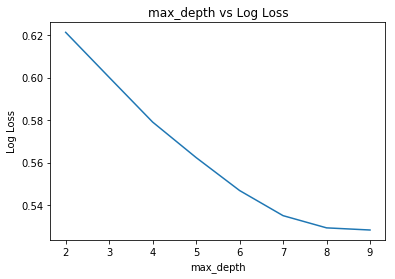

In [11]:
# summarize results
print("Best: %f using %s" % (-grid_result.best_score_, grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (-mean, stdev, param))
# plot
plt.errorbar(range(2,10), -means)
plt.title("max_depth vs Log Loss")
plt.xlabel('max_depth')
plt.ylabel('Log Loss')
plt.show()

### training model with best max_depth

#### Accuracy and Loss

In [12]:
dt_tfidf = tree.DecisionTreeClassifier(max_depth = 8,class_weight='balanced')
dt_tfidf = dt_tfidf.fit(train_sum_text_tfidf,Y_train)
pred = dt_tfidf.predict(train_sum_text_tfidf)
# evaluate accuracy
acc = accuracy_score(Y_train, pred) * 100
print('\nThe Train accuracy of the DT classifier is %f%%' % (acc))
# predict the response
pred = dt_tfidf.predict(test_sum_text_tfidf)
# evaluate accuracy
acc = accuracy_score(Y_test, pred) * 100
print('\nThe Test accuracy of the DT classifier is %f%%' % (acc))
print('********************Log Loss********************')
predict_y = dt_tfidf.predict_proba(train_sum_text_tfidf)
print('GridSearch')
print("The train log loss is:",log_loss(Y_train, predict_y, labels=dt_tfidf.classes_, eps=1e-15))
predict_y = dt_tfidf.predict_proba(test_sum_text_tfidf)
print("The test log loss is:",log_loss(Y_test, predict_y, labels=dt_tfidf.classes_, eps=1e-15))


The Train accuracy of the DT classifier is 62.605377%

The Test accuracy of the DT classifier is 63.183909%
********************Log Loss********************
GridSearch
The train log loss is: 0.5103961205127352
The test log loss is: 0.5497349048079408


#### F1 Score and Confusion matrix

GridSearch
F1 Score:  0.7280453545095891
******************************************


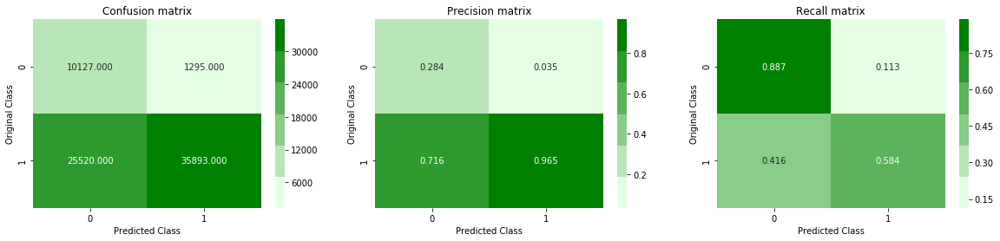

In [13]:
print('GridSearch')
print("F1 Score: ",f1_score(Y_test,dt_tfidf.predict(test_sum_text_tfidf)))
print("******************************************")
plot_confusion_matrix(Y_test, dt_tfidf.predict(test_sum_text_tfidf))

#### Imporatance words

In [14]:
ft  = np.abs(dt_tfidf.feature_importances_)
sorted_index = np.argsort(ft)[::-1]
top_20 = sorted_index[:20]
terms = tfidf_vectorizer.get_feature_names()
term = tfidf_vect.get_feature_names()
print('Top Twenty Review and Summary Words')
for ind in top_20:
    
    if ind < (len(terms) + 1): 
        
        print(terms[ind])
    if ind < (len(term) + 1):
        print(term[ind])
        

Top Twenty Review and Summary Words
brooklyn
not
menu
roast chicken
belgium
great
admit not
best
got sick
base
good
point
bouquet
love
anywher near
delici
delux
brother
not bad
bean good
good not
add
bad
delici cooki
rosemari
night sleep
salt


## Observations:

1.Both accuracy and loss are not good

2.Recall is better but precision is bad.

3.In high dimension DT not work well

# --------------------------------------------------------------------------------------------------

## Random Forest on text features

#### GridSearch on no. of estimators and max_depth

In [42]:
clf= RandomForestClassifier(n_jobs=-1)
grid_parameters = {"n_estimators": range(50,150,30),"max_depth":[3,5,7]}
grid_search = GridSearchCV(clf, grid_parameters, cv=5,scoring="neg_log_loss",n_jobs=-1)
grid_result = grid_search.fit(train_tfidf,y_train)

#### HeatMap on No. of estimators and max_depth

Best: 0.397636 using {'max_depth': 7, 'n_estimators': 140}
0.417420 (0.001544) with: {'max_depth': 3, 'n_estimators': 50}
0.416129 (0.001004) with: {'max_depth': 3, 'n_estimators': 80}
0.416424 (0.001400) with: {'max_depth': 3, 'n_estimators': 110}
0.415978 (0.000549) with: {'max_depth': 3, 'n_estimators': 140}
0.406774 (0.000733) with: {'max_depth': 5, 'n_estimators': 50}
0.407524 (0.001270) with: {'max_depth': 5, 'n_estimators': 80}
0.407519 (0.001455) with: {'max_depth': 5, 'n_estimators': 110}
0.405980 (0.000496) with: {'max_depth': 5, 'n_estimators': 140}
0.398635 (0.001948) with: {'max_depth': 7, 'n_estimators': 50}
0.398320 (0.000914) with: {'max_depth': 7, 'n_estimators': 80}
0.398519 (0.000647) with: {'max_depth': 7, 'n_estimators': 110}
0.397636 (0.000758) with: {'max_depth': 7, 'n_estimators': 140}


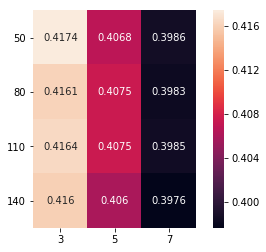

In [43]:
# summarize results
print("Best: %f using %s" % (-grid_result.best_score_, grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (-mean, stdev, param))
data = pd.DataFrame(-means.reshape(3,4), columns=range(50,150,30), index = [3,5,7])

# plot heatmap
ax = sns.heatmap(data.T,annot=True, square=True,fmt = '.4g')
# turn the axis label
for item in ax.get_yticklabels():
    item.set_rotation(0)
for item in ax.get_xticklabels():
    item.set_rotation(0)
plt.show()

### Training model on best parameters

#### Accuracy and Loss

In [44]:
rf_tfidf = RandomForestClassifier(n_estimators = 140,n_jobs=-1,max_depth = 7)
rf_tfidf.fit(train_tfidf,y_train)
pred = rf_tfidf.predict(train_tfidf)
# evaluate accuracy
acc = accuracy_score(y_train, pred) * 100
print('\nThe Train accuracy of the RF classifier is %f%%' % (acc))
# predict the response
pred = rf_tfidf.predict(test_tfidf)
# evaluate accuracy
acc = accuracy_score(y_test, pred) * 100
print('\nThe Test accuracy of the RF classifier is %f%%' % (acc))
print('***************Log Loss***************')
predict_y = rf_tfidf.predict_proba(train_tfidf)
print('GridSearch')
print("The train log loss is:",log_loss(y_train, predict_y, labels=rf_tfidf.classes_, eps=1e-15))
predict_y = rf_tfidf.predict_proba(test_tfidf)
print("The test log loss is:",log_loss(y_test, predict_y, labels=rf_tfidf.classes_, eps=1e-15))


The Train accuracy of the RF classifier is 84.403750%

The Test accuracy of the RF classifier is 84.405000%
***************Log Loss***************
GridSearch
The train log loss is: 0.3942209304952592
The test log loss is: 0.3952995928519457


#### F1 Score and Confusion matrix

GridSearch
F1 Score:  0.9154307095794583
******************************************


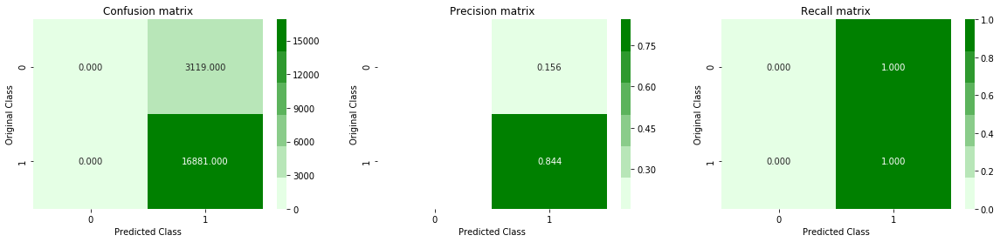

In [45]:
print('GridSearch')
print("F1 Score: ",f1_score(y_test,pred))
print("******************************************")
plot_confusion_matrix(y_test, pred)

#### Imporatant Words

In [46]:
ft  = np.abs(rf_tfidf.feature_importances_)
sorted_index = np.argsort(ft)[::-1]
top_20 = sorted_index[:10]
terms = tf_idf_vectorizer.get_feature_names()
#term = tf_idf_vect.get_feature_names()
print('Top Twenty Words')
for ind in top_10:
    
    if ind < (len(terms) + 1): 
        
        print(terms[ind])
    #if ind < (len(term) + 1):
        #print(term[ind])
              
top = sorted_index[:]
text=' '
for ind in top:
    if ind < len(terms):
        text = text + terms[ind] + ' '
    #if ind < len(term):
        #text = text + term[ind] + ' '
print(len(text))    

Top Twenty Words
great
love
not
best
delici
good
perfect
disappoint
excel
favorit
nice
easi
worst
amaz
find
happi
wonder
enjoy
return
keep
74447


#### WordCloud

Feature importance WordClouds


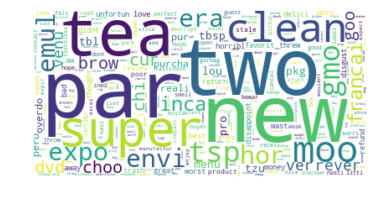

In [47]:
wc = WordCloud(background_color="white", max_words=len(text))
wc.generate(text)
print ("Feature importance WordClouds")
plt.imshow(wc, interpolation='bilinear')
plt.axis("off")
plt.show()

## Improving model RF by reducing features,adding summary features and bi-gram

### Training model 

#### Accuracy and loss

In [15]:
rftfidf = RandomForestClassifier(n_estimators = 140,n_jobs=-1,max_depth = 7)
rftfidf.fit(train_sum_text_tfidf,Y_train)
pred = rftfidf.predict(train_sum_text_tfidf)
# evaluate accuracy
acc = accuracy_score(Y_train, pred) * 100
print('\nThe Train accuracy of the RF classifier is %f%%' % (acc))
# predict the response
pred = rftfidf.predict(test_sum_text_tfidf)
# evaluate accuracy
acc = accuracy_score(Y_test, pred) * 100
print('\nThe Test accuracy of the RF classifier is %f%%' % (acc))
print('***************Log Loss***************')
predict_y = rftfidf.predict_proba(train_sum_text_tfidf)
print('GridSearch')
print("The train log loss is:",log_loss(Y_train, predict_y, labels=rftfidf.classes_, eps=1e-15))
predict_y = rftfidf.predict_proba(test_sum_text_tfidf)
print("The test log loss is:",log_loss(Y_test, predict_y, labels=rftfidf.classes_, eps=1e-15))


The Train accuracy of the RF classifier is 84.317764%

The Test accuracy of the RF classifier is 84.317979%
***************Log Loss***************
GridSearch
The train log loss is: 0.386410921773226
The test log loss is: 0.3867483694585863


#### F1 Score and Confusion matrix

GridSearch
F1 Score:  0.9149186580060783
******************************************


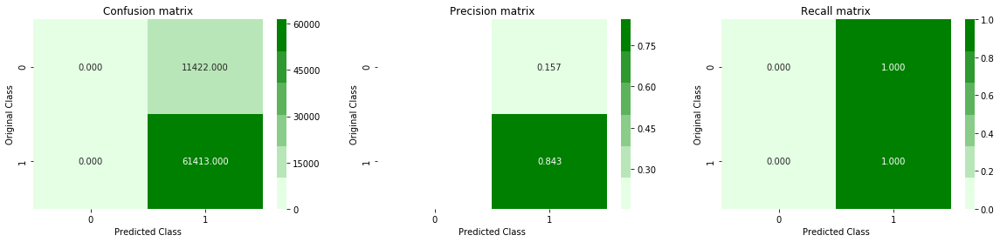

In [16]:
print('GridSearch')
print("F1 Score: ",f1_score(Y_test,pred))
print("******************************************")
plot_confusion_matrix(Y_test, pred)

#### Important Words

In [17]:
ft  = np.abs(rftfidf.feature_importances_)
sorted_index = np.argsort(ft)[::-1]
top_20 = sorted_index[:20]
terms = tfidf_vectorizer.get_feature_names()
term = tfidf_vect.get_feature_names()
print('Top Twenty Words')
for ind in top_20:
    
    if ind < (len(terms) + 1): 
        
        print(terms[ind])
    if ind < (len(term) + 1):
        print(term[ind])

Top Twenty Words
brooklyn
not
got sick
menu
time eat
point
rosemari
around long
disappoint
belgium
great
think worth
roast chicken
delici cooki
coffe love
worst
delux
bit disappoint
horribl


## Observation:

1.The model is very bad it is predicting only dominating class.

2.RF is not good when data have high dimensions

3.we can use it for taking most important features.

4.Accuracy and loss both are not good

# ----------------------------------------------------------------------------------

## GBDT on text features

#### GridSearch on max_depth and subsample

In [46]:
start = time.time()
clf= GradientBoostingClassifier()
grid_parameters = {"max_depth": [3,5,7],'subsample':[0.6,0.8,1.0]}
grid_search = GridSearchCV(clf, grid_parameters, cv=3,scoring="neg_log_loss",n_jobs=-1)
grid_result = grid_search.fit(train_tfidf,y_train)
print('Tuning time: ',(time.time() - start))

Tuning time:  1147.255478143692


Best: 0.262966 using {'max_depth': 7, 'subsample': 1.0}
0.297536 (0.001426) with: {'max_depth': 3, 'subsample': 0.6}
0.298772 (0.001722) with: {'max_depth': 3, 'subsample': 0.8}
0.299507 (0.001689) with: {'max_depth': 3, 'subsample': 1.0}
0.275215 (0.001617) with: {'max_depth': 5, 'subsample': 0.6}
0.274870 (0.001523) with: {'max_depth': 5, 'subsample': 0.8}
0.275880 (0.001750) with: {'max_depth': 5, 'subsample': 1.0}
0.263390 (0.001418) with: {'max_depth': 7, 'subsample': 0.6}
0.263592 (0.002379) with: {'max_depth': 7, 'subsample': 0.8}
0.262966 (0.001873) with: {'max_depth': 7, 'subsample': 1.0}


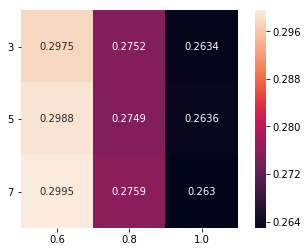

In [47]:
# summarize results
print("Best: %f using %s" % (-grid_result.best_score_, grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (-mean, stdev, param))
data = pd.DataFrame(-means.reshape(3,3), columns=[3,5,7], index = [0.6,0.8,1.0])

# plot heatmap
ax = sns.heatmap(data.T,annot=True, square=True,fmt='.4g')

# turn the axis label
for item in ax.get_yticklabels():
    item.set_rotation(0)

for item in ax.get_xticklabels():
    item.set_rotation(0)

# save figure

plt.show()

### Training model with best parameter

#### Accuracy and Loss

In [59]:
clf_gb = GradientBoostingClassifier(max_depth =7 ,subsample = 0.8)
clf_gb.fit(train_tfidf,y_train)
pred = clf_gb.predict(train_tfidf)
# evaluate accuracy
acc = accuracy_score(y_train, pred) * 100
print('\nThe Train accuracy of the RF classifier is %f%%' % (acc))
# predict the response
pred = clf_gb.predict(test_tfidf)
# evaluate accuracy
acc = accuracy_score(y_test, pred) * 100
print('\nThe Test accuracy of the RF classifier is %f%%' % (acc))
print('********************Log Loss*******************')
predict_y = clf_gb.predict_proba(train_tfidf)
print('GridSearch')
print("The train log loss is:",log_loss(y_train, predict_y, labels=clf_gb.classes_, eps=1e-15))
predict_y = clf_gb.predict_proba(test_tfidf)
print("The test log loss is:",log_loss(y_test, predict_y, labels=clf_gb.classes_, eps=1e-15))


The Train accuracy of the RF classifier is 91.653750%

The Test accuracy of the RF classifier is 89.040000%
********************Log Loss*******************
GridSearch
The train log loss is: 0.21589141666102213
The test log loss is: 0.27112023206839975


#### F1 Score and Confusion matrix

GridSearch
F1 Score:  0.9366766813034436
******************************************


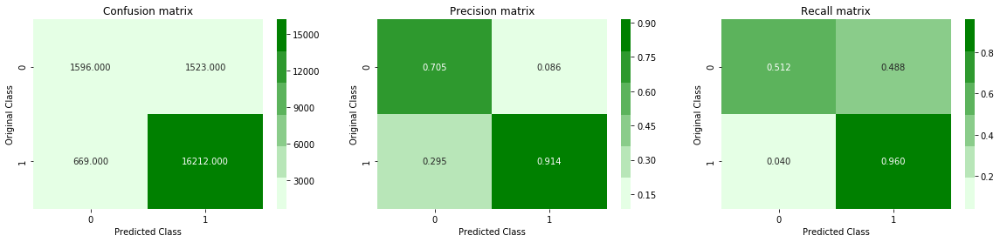

In [60]:
print('GridSearch')
print("F1 Score: ",f1_score(y_test,pred))
print("******************************************")
plot_confusion_matrix(y_test, pred)

In [61]:
ft  = np.abs(clf_gb.feature_importances_)
sorted_index = np.argsort(ft)[::-1]
top_20 = sorted_index[:10]
terms = tf_idf_vectorizer.get_feature_names()
#term = tf_idf_vect.get_feature_names()
print('Top Twenty Words')
for ind in top_10:
    
    if ind < (len(terms) + 1): 
        
        print(terms[ind])
    #if ind < (len(term) + 1):
        #print(term[ind])
              
top = sorted_index[:]
text=' '
for ind in top:
    if ind < len(terms):
        text = text + terms[ind] + ' '
    #if ind < len(term):
        #text = text + term[ind] + ' '
print(len(text))    

Top Twenty Words
great
love
not
best
delici
good
perfect
disappoint
excel
favorit
nice
easi
worst
amaz
find
happi
wonder
enjoy
return
keep
14273


Feature importance WordClouds


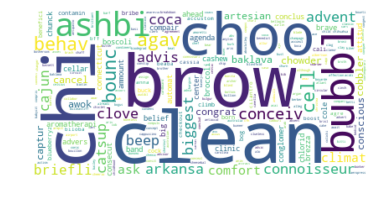

In [62]:
wc = WordCloud(background_color="white", max_words=len(text))
wc.generate(text)
print ("Feature importance WordClouds")
plt.imshow(wc, interpolation='bilinear')
plt.axis("off")
plt.show()

### Improving GBDT model  by adding summary features, bi-gram and more data

In [19]:
from sklearn.feature_selection import SelectFromModel
selection = SelectFromModel(rftfidf, threshold=0.000000000009, prefit=True)
new_sum_train = selection.transform(train_sum_text_tfidf)
new_sum_test=selection.transform(test_sum_text_tfidf)
new_sum_test.shape

(72835, 2980)

### Training model

#### Accuaracy and Loss

In [20]:
clf_gb = GradientBoostingClassifier(max_depth =7 ,subsample = 0.8)
clf_gb.fit(new_sum_train,Y_train)
pred = clf_gb.predict(new_sum_train)
# evaluate accuracy
acc = accuracy_score(Y_train, pred) * 100
print('\nThe Train accuracy of the RF classifier is %f%%' % (acc))
# predict the response
pred = clf_gb.predict(new_sum_test)
# evaluate accuracy
acc = accuracy_score(Y_test, pred) * 100
print('\nThe Test accuracy of the RF classifier is %f%%' % (acc))
print('********************Log Loss*******************')
predict_y = clf_gb.predict_proba(new_sum_train)
print('GridSearch')
print("The train log loss is:",log_loss(Y_train, predict_y, labels=clf_gb.classes_, eps=1e-15))
predict_y = clf_gb.predict_proba(new_sum_test)
print("The test log loss is:",log_loss(Y_test, predict_y, labels=clf_gb.classes_, eps=1e-15))


The Train accuracy of the RF classifier is 92.660708%

The Test accuracy of the RF classifier is 92.049152%
********************Log Loss*******************
GridSearch
The train log loss is: 0.19760909616961558
The test log loss is: 0.21643424256903707


#### F1 Score and Confusion matrix

GridSearch
F1 Score:  0.9540291019361599
******************************************


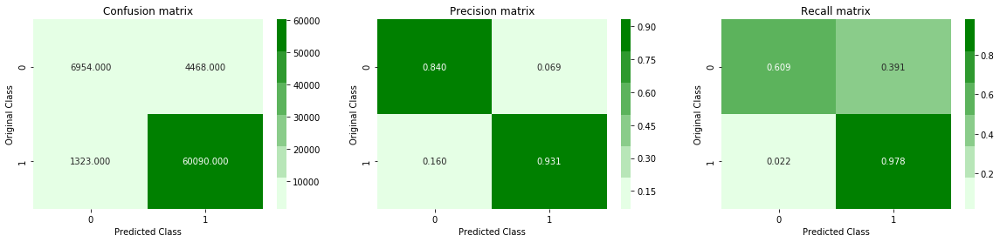

In [21]:
print('GridSearch')
print("F1 Score: ",f1_score(Y_test,pred))
print("******************************************")
plot_confusion_matrix(Y_test, pred)

#### Important features

In [22]:
ft  = np.abs(clf_gb.feature_importances_)
sorted_index = np.argsort(ft)[::-1]
top_20 = sorted_index[:10]
terms = tfidf_vectorizer.get_feature_names()
term = tfidf_vect.get_feature_names()
print('Top Twenty Words')
for ind in top_20:
    
    if ind < (len(terms) + 1): 
        
        print(terms[ind])
    if ind < (len(term) + 1):
        print(term[ind])

Top Twenty Words
aggress
best green
bar
fussi
calori low
price
bold coffe
kitti
ad bonus
aw
add spice
bean
chlorid
tast
bummer
not worth
cracker great
cough


## Observations:

1.Improvement in accuracy and loss

2.both precision and recall improved.

3.Bi-gram  improving our model performance.

4..We can improve it further by taking tri-gram or more features.

# ------------------------------------------------------------------------------------------------------

## XGBOOST on text features

In [67]:
xgb_tfidf = xgb.XGBClassifier().fit(new_train,y_train)
pred = xgb_tfidf.predict(new_train)
# evaluate accuracy
acc = accuracy_score(y_train, pred) * 100
print('\nThe Train accuracy of the xgbdt classifier is %f%%' % (acc))
# predict the response
pred = xgb_tfidf.predict(new_test)
# evaluate accuracy
acc = accuracy_score(y_test, pred) * 100
print('\nThe Test accuracy of the xgbdt classifier is %f%%' % (acc))
print('*********************Log Loss*******************')
predict_y = xgb_tfidf.predict_proba(new_train)
print('GridSearch')
print("The train log loss is:",log_loss(y_train, predict_y, labels=xgb_tfidf.classes_, eps=1e-15))
predict_y = xgb_tfidf.predict_proba(new_test)
print("The test log loss is:",log_loss(y_test, predict_y, labels=xgb_tfidf.classes_, eps=1e-15))


The Train accuracy of the xgbdt classifier is 87.827500%

The Test accuracy of the xgbdt classifier is 87.770000%
*********************Log Loss*******************
GridSearch
The train log loss is: 0.29305211840658446
The test log loss is: 0.29825097045945004


F1 Score:  0.9319421257651641
******************************************


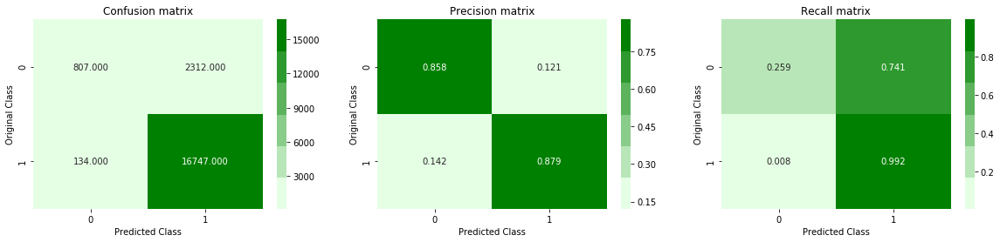

In [68]:
print("F1 Score: ",f1_score(y_test,pred))
print("******************************************")
plot_confusion_matrix(y_test, pred)

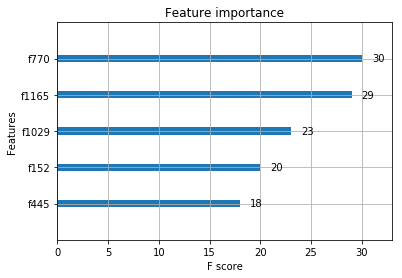

In [69]:
from xgboost import plot_importance
plot_importance(xgb_tfidf,max_num_features=5)
plt.show()

### Improving Xgboost by taking summary features,bi-gram

In [23]:
xgb_tfidf = xgb.XGBClassifier().fit(new_sum_train,Y_train)
pred = xgb_tfidf.predict(new_sum_train)
# evaluate accuracy
acc = accuracy_score(Y_train, pred) * 100
print('\nThe Train accuracy of the xgbdt classifier is %f%%' % (acc))
# predict the response
pred = xgb_tfidf.predict(new_sum_test)
# evaluate accuracy
acc = accuracy_score(Y_test, pred) * 100
print('\nThe Test accuracy of the xgbdt classifier is %f%%' % (acc))
print('*********************Log Loss*******************')
predict_y = xgb_tfidf.predict_proba(new_sum_train)
print('GridSearch')
print("The train log loss is:",log_loss(Y_train, predict_y, labels=xgb_tfidf.classes_, eps=1e-15))
predict_y = xgb_tfidf.predict_proba(new_sum_test)
print("The test log loss is:",log_loss(Y_test, predict_y, labels=xgb_tfidf.classes_, eps=1e-15))


The Train accuracy of the xgbdt classifier is 89.472636%

The Test accuracy of the xgbdt classifier is 89.164550%
*********************Log Loss*******************
GridSearch
The train log loss is: 0.26305457028570745
The test log loss is: 0.2699256791716007


F1 Score:  0.9389560966554253
******************************************


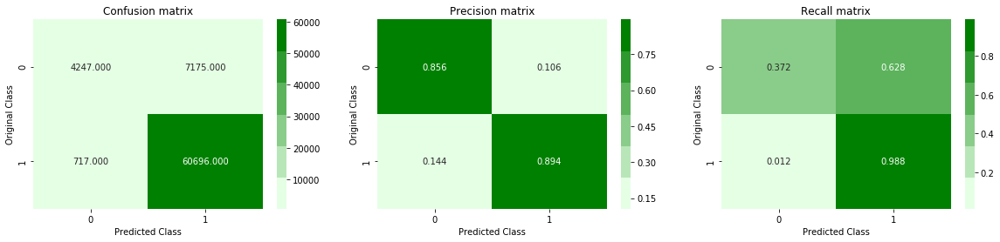

In [24]:
print("F1 Score: ",f1_score(Y_test,pred))
print("******************************************")
plot_confusion_matrix(Y_test, pred)

## Observations:

1.Both Accuaracy and loss improved.

2.precsion is good but recall is bad.

3.Train and test loss have less difference so we are not overfitting.

# ----------------------------------------------------------------------------------------------

## RBF

In [16]:
start = time.time()
svm = svm.SVC(probability=True)
svm.fit(train_text_tfidf, y_train)
tr_score = svm.score(train_text_tfidf, y_train)
print("GridSearch")
print("Training Accuracy :",tr_score)
tr_score = svm.score(test_text_tfidf, y_test)
print("Test Accuracy :",tr_score)
print("*************************Log Loss******************************")
predict_y = svm.predict_proba(train_text_tfidf)
print("The train log loss is:",log_loss(y_train, predict_y, labels=svm.classes_, eps=1e-15))
predict_y = svm.predict_proba(test_text_tfidf)
print("The test log loss is:",log_loss(y_test, predict_y, labels=svm.classes_, eps=1e-15))
print("Time Taken: ",(time.time() - start))

GridSearch
Training Accuracy : 0.8440375
Test Accuracy : 0.84405
*************************Log Loss******************************
The train log loss is: 0.2604802506245239
The test log loss is: 0.5194570559577582
Time Taken:  6032.290735006332


F1 Score:  0.9154307095794583
******************************************


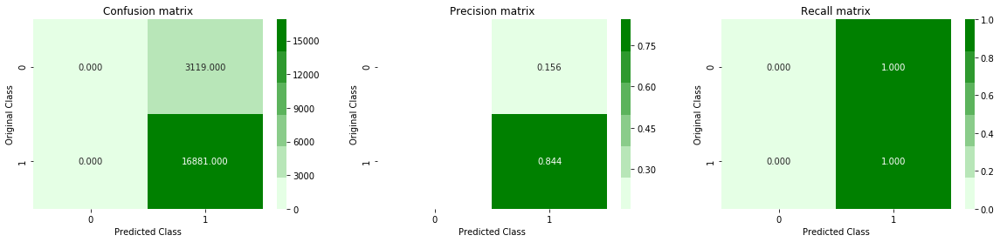

In [18]:
print("F1 Score: ",f1_score(y_test,svm.predict(test_text_tfidf)))
print("******************************************")
plot_confusion_matrix(y_test, svm.predict(test_text_tfidf))

## Observations :

1.Accuracy is good but loss are not.

2.Train loss is less but test loss is more than 50 % so our model is not good and is overfitting also.

3.It is predicting everything to majority class.

4.We can improve it taking more data and fetures like summary features andbi -grma,tr-gram..etc.

# -------------------------------------------------------------------------------------------

## KNN

In [20]:
tf_idf_vec= TfidfVectorizer(min_df=3,max_features = 2000)
train_text_tfidf = tf_idf_vec.fit_transform(X_train['NewCleanedText'])
# we use the same vectorizer that was trained on train data
test_text_tfidf = tf_idf_vec.transform(X_test['NewCleanedText'])
print("the shape of out train text TFIDF vectorizer ",train_text_tfidf.get_shape())
print("the shape of out test text TFIDF vectorizer ",test_text_tfidf.get_shape())

# don't forget to normalize every feature
train_text_tfidf= normalize(train_text_tfidf, axis=0)
# don't forget to normalize every feature
test_text_tfidf = normalize(test_text_tfidf, axis=0)

the shape of out train text TFIDF vectorizer  (80000, 2000)
the shape of out test text TFIDF vectorizer  (20000, 2000)


In [22]:
train_text_tfidf = train_text_tfidf.toarray()
test_text_tfidf = test_text_tfidf.toarray()

In [11]:
tfidf_vect = TfidfVectorizer(ngram_range=(1, 3),min_df=5,max_features=2000)
sum_train_tfidf = tfidf_vect.fit_transform(X_train['NewCleanedSummary'])
# we use the same vectorizer that was trained on train data
sum_test_tfidf = tfidf_vect.transform(X_test['NewCleanedSummary'])
print("the shape of out train text TFIDF vectorizer ",sum_train_tfidf.get_shape())
print("the shape of out test text TFIDF vectorizer ",sum_test_tfidf.get_shape())

# don't forget to normalize every feature
sum_train_tfidf = normalize(sum_train_tfidf, axis=0)
# don't forget to normalize every feature
sum_test_tfidf = normalize(sum_test_tfidf, axis=0)

the shape of out train text TFIDF vectorizer  (80000, 2000)
the shape of out test text TFIDF vectorizer  (20000, 2000)



The optimal number of neighbors is 11.


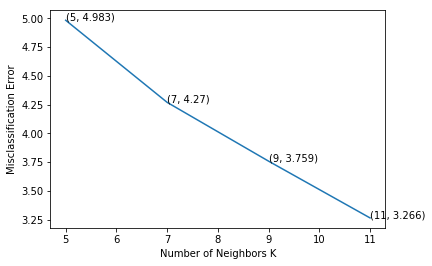

the misclassification error for each k value is :  [4.983 4.27  3.759 3.266]
Hyperparameter Tuning Time 767.8738214969635


In [12]:
start = time.time()
neighbors = [5,7,9,11]
# empty list that will hold cv scores
cv_scores = []
# perform 10-fold cross validation
for k in neighbors:
    knn = KNeighborsClassifier(n_neighbors=k,n_jobs = -1)
    scores = cross_val_score(knn, train_text_tfidf, y_train, scoring="neg_log_loss",cv=3)
    cv_scores.append(scores.mean())

# changing to misclassification error
MSE = [1 - x for x in cv_scores]
# determining best k
optimal_k = neighbors[MSE.index(min(MSE))]
print('\nThe optimal number of neighbors is %d.' % optimal_k)
# plot misclassification error vs k 
plt.plot(neighbors, MSE)
for xy in zip(neighbors, np.round(MSE,3)):
    plt.annotate('(%s, %s)' % xy, xy=xy, textcoords='data')

plt.xlabel('Number of Neighbors K')
plt.ylabel('Misclassification Error')
plt.show()
print("the misclassification error for each k value is : ", np.round(MSE,3))
print('Hyperparameter Tuning Time', (time.time()- start))

In [23]:
# instantiate learning model k = optimal_k
optimal_k = 5
knn_tfidf = KNeighborsClassifier(n_neighbors=optimal_k,n_jobs = -1)
# fitting the model
knn_tfidf.fit(train_text_tfidf, y_train)
pred = knn_tfidf.predict(train_text_tfidf)
# evaluate accuracy
acc = accuracy_score(y_train, pred) * 100
print('\nThe Train accuracy of the knn classifier for k = %d is %f%%' % (optimal_k, acc))
# predict the response
pred = knn_tfidf.predict(test_text_tfidf)
# evaluate accuracy
acc = accuracy_score(y_test, pred) * 100
print('\nThe Test accuracy of the knn classifier for k = %d is %f%%' % (optimal_k, acc))


The Train accuracy of the knn classifier for k = 5 is 85.673750%

The Test accuracy of the knn classifier for k = 5 is 85.105000%


F1 Score:  0.9169431510859565
******************************************


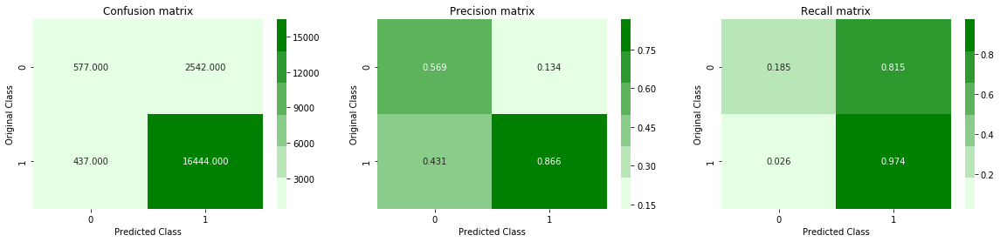

In [24]:
print("F1 Score: ",f1_score(y_test, pred))
print("******************************************")
plot_confusion_matrix(y_test, pred)

## Observations:

1.

2.Both precsion and recall are not good .

In [36]:
from prettytable import PrettyTable
y = PrettyTable(['Tfidf'])
print(y)
x  =PrettyTable(["Model", "Test Accuracy", "Train Loss",'Test Loss','F1 Score'])
x.add_row(['Naive Bayes',91.13,0.26,0.21,0.942])
x.add_row(['Logistic Reg',92.73,0.19 , 0.20,0.955])
x.add_row(['DT',63.18,0.51,0.54,0.728])
x.add_row(['Random Forest',84.31,0.38,0.38,0.914])
x.add_row(['GBDT',92.04,0.19,0.21,0.954])
x.add_row(['XGBOOST',89.16,0.26,0.26,0.938])
x.add_row(['Linear SVM',94.15,0.18,0.21,0.964])
x.add_row(['RBF SVM',84.40,0.26,0.51,0.915])
x.add_row(['KNN',85.10,0.18,0.21,0.916])

print(x)

+-------+
| Tfidf |
+-------+
+-------+
+---------------+---------------+------------+-----------+----------+
|     Model     | Test Accuracy | Train Loss | Test Loss | F1 Score |
+---------------+---------------+------------+-----------+----------+
|  Naive Bayes  |     91.13     |    0.26    |    0.21   |  0.942   |
|  Logistic Reg |     92.73     |    0.19    |    0.2    |  0.955   |
|       DT      |     63.18     |    0.51    |    0.54   |  0.728   |
| Random Forest |     84.31     |    0.38    |    0.38   |  0.914   |
|      GBDT     |     92.04     |    0.19    |    0.21   |  0.954   |
|    XGBOOST    |     89.16     |    0.26    |    0.26   |  0.938   |
|   Linear SVM  |     94.15     |    0.18    |    0.21   |  0.964   |
|    RBF SVM    |      84.4     |    0.26    |    0.51   |  0.915   |
|      KNN      |      85.1     |    0.18    |    0.21   |  0.916   |
+---------------+---------------+------------+-----------+----------+


## Overall Observation of Different Models:

1.Naive bayes ,Logistic Regression,Svm and Boosting model with less features are good for text classifications.

2.Decision tree ,Random forest are not good for high dimensional data like text data.they are performing very bad.

3.KNN is distance based technique so in high dimension it is also not good.and it require lot of time and memeory.


# --------------------------------\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\------------------------------------

# Avg Word2Vec

In [4]:
# Loading PreTrained W2V model on our own review Text Data Which is saved as file 
from sklearn.externals import joblib
filename = 'w2v_model.sav'
# load the model from disk
w2v_model = joblib.load(filename)

In [10]:
import gensim
i=0
list_of_train_sent=[]
for sent in X_train['NewCleanedText']:
    filtered_sentence=[]
    sent=cleanhtml(sent.decode('utf-8'))
    for w in sent.split():
        for cleaned_words in cleanpunc(w).split():
            if(cleaned_words.isalpha()):    
                filtered_sentence.append(cleaned_words.lower())
            else:
                continue 
    list_of_train_sent.append(filtered_sentence)   

In [10]:
list_of_train_sent[0]

['honest',
 'skeptic',
 'come',
 'herbal',
 'treatment',
 'snake',
 'oil',
 'stuff',
 'real',
 'deal',
 'start',
 'drink',
 'like',
 'herbal',
 'tea',
 'want',
 'drink',
 'someth',
 'knew',
 'safe',
 'nurs',
 'babi',
 'start',
 'drink',
 'make',
 'day',
 'end',
 'second',
 'week',
 'stop',
 'around',
 'bottl',
 'pump',
 'cant',
 'hold',
 'anymor',
 'drink',
 'one',
 'cup',
 'day',
 'perhap',
 'natur',
 'increas',
 'fact',
 'end',
 'make',
 'time',
 'amount',
 'babi',
 'drank',
 'daycar',
 'sort',
 'made',
 'doubt',
 'didnt',
 'like',
 'first',
 'smell',
 'unpleas',
 'tast',
 'isnt',
 'bad',
 'sort',
 'like',
 'coffe',
 'get',
 'use',
 'first',
 'grow',
 'high',
 'recommend',
 'mother',
 'return',
 'work',
 'buy',
 'box',
 'two',
 'keep',
 'suppli',
 'case',
 'transit',
 'doesnt',
 'well',
 'also',
 'suggest',
 'start',
 'cup',
 'day',
 'instead',
 'recommend',
 'box',
 'come',
 'bag',
 'pop',
 'get',
 'expens',
 'judg',
 'review',
 'result',
 'vari',
 'person',
 'person',
 'may',
 'not

In [11]:
import gensim
i=0
list_of_test_sent=[]
for sent in X_test['NewCleanedText']:
    filtered_sentence=[]
    sent=cleanhtml(sent.decode('utf-8'))
    for w in sent.split():
        for cleaned_words in cleanpunc(w).split():
            if(cleaned_words.isalpha()):    
                filtered_sentence.append(cleaned_words.lower())
            else:
                continue 
    list_of_test_sent.append(filtered_sentence)   

In [12]:
list_of_test_sent[0]

['love',
 'chocol',
 'tast',
 'great',
 'amazon',
 'best',
 'price',
 'definit',
 'buy']

In [7]:
w2v_words = list(w2v_model.wv.vocab)
print("number of words that occured minimum 5 times ",len(w2v_words))
print("sample words ", w2v_words[0:50])

number of words that occured minimum 5 times  21938
sample words  ['witti', 'littl', 'book', 'make', 'son', 'laugh', 'loud', 'recit', 'car', 'drive', 'along', 'alway', 'sing', 'refrain', 'hes', 'learn', 'whale', 'india', 'droop', 'love', 'new', 'word', 'introduc', 'silli', 'classic', 'will', 'bet', 'still', 'abl', 'memori', 'colleg', 'grew', 'read', 'sendak', 'watch', 'realli', 'rosi', 'movi', 'incorpor', 'howev', 'miss', 'hard', 'cover', 'version', 'paperback', 'seem', 'kind', 'flimsi', 'take', 'two']


In [13]:
import pickle
import os
if not os.path.isfile('train_sent_vectors'):
    # average Word2Vec
    # compute average word2vec for each review.
    train_sent_vectors = [];                           # the avg-w2v for each sentence/review is stored in this list
    for sent in list_of_train_sent:                    # for each review/sentence
        sent_vec = np.zeros(50)                        # as word vectors are of zero length
        cnt_words =0;                                  # num of words with a valid vector in the sentence/review
        for word in sent:                              # for each word in a review/sentence
            if word in w2v_words:
                vec = w2v_model.wv[word]
                sent_vec += vec
                cnt_words += 1
        if cnt_words != 0:
            sent_vec /= cnt_words
        train_sent_vectors.append(sent_vec)
    print(len(train_sent_vectors))
    print(len(train_sent_vectors[0]))
    # saving vector list
    with open("train_sent_vectors", "wb") as fp:   #Pickling
        pickle.dump(train_sent_vectors, fp)


if not os.path.isfile('test_sent_vectors'):
    

    test_sent_vectors = [];                            # the avg-w2v for each sentence/review is stored in this list
    for sent in list_of_test_sent:                     # for each review/sentence
        sent_vec = np.zeros(50)                        # as word vectors are of zero length
        cnt_words =0;                                  # num of words with a valid vector in the sentence/review
        for word in sent:                              # for each word in a review/sentence
            if word in w2v_words:
                vec = w2v_model.wv[word]
                sent_vec += vec
                cnt_words += 1
        if cnt_words != 0:
            sent_vec /= cnt_words
        test_sent_vectors.append(sent_vec)
    print(len(test_sent_vectors))
    print(len(test_sent_vectors[0]))
    # saving vector list
    with open("test_sent_vectors", "wb") as fp:   #Pickling
        pickle.dump(test_sent_vectors, fp)
    
with open("train_sent_vectors", "rb") as fp:   # Unpickling
    train_sent_vectors = pickle.load(fp)
print(len(train_sent_vectors))
print(len(train_sent_vectors[0]))
print('------------------------------')
with open("test_sent_vectors", "rb") as fp:   # Unpickling
    test_sent_vectors = pickle.load(fp)
print(len(test_sent_vectors))
print(len(test_sent_vectors[0]))

80000
50
------------------------------
20000
50


In [14]:
# Standardizing train and Test
train_sent_vectors = StandardScaler(with_mean=True).fit_transform(train_sent_vectors)
test_sent_vectors = StandardScaler(with_mean=True).fit_transform(test_sent_vectors)

# Gaussian  Naive Bayes

#### Grid Search on 'var_smoothing'

In [16]:
clf= GaussianNB()
grid_parameters = {'var_smoothing':[0.00001, 0.0001, 0.001, 0.1,1, 10]}
grid_search = GridSearchCV(clf, grid_parameters, cv=10,scoring="neg_log_loss",n_jobs=-1)
grid_result = grid_search.fit(train_sent_vectors,y_train)

#### var_smoothing vs  loss

Best: 0.310772 using {'var_smoothing': 1}
0.427354 (0.012980) with: {'var_smoothing': 1e-05}
0.427327 (0.012979) with: {'var_smoothing': 0.0001}
0.427056 (0.012963) with: {'var_smoothing': 0.001}
0.400793 (0.011473) with: {'var_smoothing': 0.1}
0.310772 (0.005417) with: {'var_smoothing': 1}
0.375137 (0.000900) with: {'var_smoothing': 10}


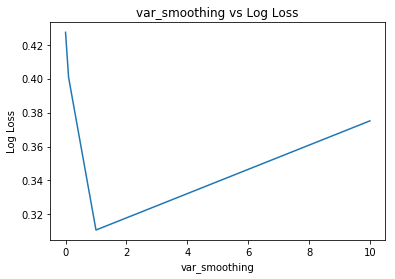

In [17]:
# summarize results
print("Best: %f using %s" % (-grid_result.best_score_, grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (-mean, stdev, param))
# plot
plt.errorbar([0.00001, 0.0001, 0.001, 0.1, 1,10], -means)
plt.title("var_smoothing vs Log Loss")
plt.xlabel('var_smoothing')
plt.ylabel('Log Loss')
plt.show()

### Training model on best parameter

#### Accuracy and loss

In [18]:
var_smoothing = 1
clf_i = GaussianNB()
# fitting the model
clf_i.fit(train_sent_vectors, y_train)
pred = clf_i.predict(train_sent_vectors)
# evaluate accuracy
acc = accuracy_score(y_train, pred) * 100
print('\nThe Train accuracy of the NB classifier for i = %d is %f%%' % (var_smoothing,acc))
# predict the response
pred = clf_i.predict(test_sent_vectors)
# evaluate accuracy
acc = accuracy_score(y_test, pred) * 100
print('\nThe Test accuracy of the NB classifier for i = %d is %f%%' % (var_smoothing, acc))

print('*********************Log Loss*******************')
predict_y = clf_i.predict_proba(train_sent_vectors)
print('GridSearch')
print("The train log loss is:",log_loss(y_train, predict_y, labels=clf_i.classes_, eps=1e-15))
predict_y = clf_i.predict_proba(test_sent_vectors)
print("The test log loss is:",log_loss(y_test, predict_y, labels=clf_i.classes_, eps=1e-15))


The Train accuracy of the NB classifier for i = 1 is 84.600000%

The Test accuracy of the NB classifier for i = 1 is 84.725000%
*********************Log Loss*******************
GridSearch
The train log loss is: 0.4265380793540147
The test log loss is: 0.42483692849598176


#### F1 Score and Confusion Matrix

F1 Score:  0.9066805144026637
******************************************


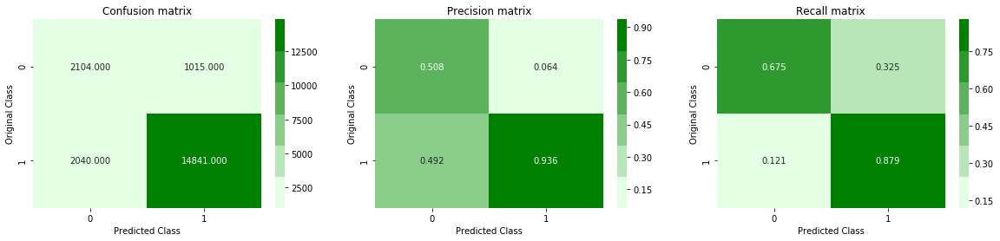

In [19]:
print("F1 Score: ",f1_score(y_test,pred))
print("******************************************")
plot_confusion_matrix(y_test, pred)

#### AUC

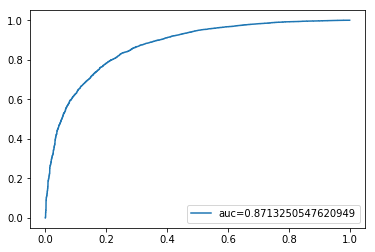

In [20]:
y_pred_proba = clf_i.predict_proba(test_sent_vectors)[::,1]
fpr, tpr, _ = metrics.roc_curve(y_test,  y_pred_proba)
auc = metrics.roc_auc_score(y_test, y_pred_proba)
plt.plot(fpr,tpr,label="auc="+str(auc))
plt.legend(loc=4)
plt.show()

## Observations:

1.Accuracy is high but loss is also high for train and test

2.precision is bad but recall is slightly good.

3.it can be improved if no.of features can increased.

## Logistic regression 

#### GridSeach  and Randomsearch on C and Penalty

In [21]:
log_reg_w2v = LogisticRegression(solver = 'liblinear')
grid_parameters = {'C':[10**-2, 10**-1, 1, 10, 100],'penalty':['l1','l2']}
gridSearchModel = GridSearchCV(log_reg_w2v, grid_parameters, cv=10,n_jobs = -1,scoring="neg_log_loss")
gridSearchModel.fit(train_sent_vectors, y_train)
print("GridSearch:",gridSearchModel.best_params_)

random_parameters = {'C':uniform(),'penalty':['l1','l2']}
randomSearchModel = RandomizedSearchCV(log_reg_w2v, random_parameters, cv=10,n_jobs = -1,scoring="neg_log_loss")
randomSearchModel.fit(train_sent_vectors, y_train)
print("randomSearch:",randomSearchModel.best_params_)

GridSearch: {'C': 10, 'penalty': 'l2'}
randomSearch: {'C': 0.9872340907550744, 'penalty': 'l2'}


### Training model on best parameter

#### Accuracy and Loss

In [22]:
w2v_log_reg_gs = LogisticRegression(penalty=gridSearchModel.best_params_['penalty'], C=gridSearchModel.best_params_['C'],solver = 'liblinear',n_jobs = -1)
w2v_log_reg_gs.fit(train_sent_vectors, y_train)
tr_score = w2v_log_reg_gs.score(train_sent_vectors, y_train)
print("GridSearch")
print("Training Accuracy :",tr_score)
tr_score = w2v_log_reg_gs.score(test_sent_vectors, y_test)
print("Test Accuracy :",tr_score)
print('-------------------------------------------------------------------')
w2v_log_reg_rs = LogisticRegression(penalty=randomSearchModel.best_params_['penalty'], C=randomSearchModel.best_params_['C'],solver = 'liblinear',n_jobs = -1)
w2v_log_reg_rs.fit(train_sent_vectors, y_train)
tr_score = w2v_log_reg_rs.score(train_sent_vectors, y_train)
print("RandomSearch")
print("Training Accuracy :",tr_score)
tr_score = w2v_log_reg_rs.score(test_sent_vectors, y_test)
print("Test Accuracy :",tr_score)
print("**************************************************************************")
print("Log Loss")
print("**************************************************************************")
predict_y = w2v_log_reg_gs.predict_proba(train_sent_vectors)
print('GridSearch')
print("The train log loss is:",log_loss(y_train, predict_y, labels=w2v_log_reg_gs.classes_, eps=1e-15))
predict_y = w2v_log_reg_gs.predict_proba(test_sent_vectors)
print("The test log loss is:",log_loss(y_test, predict_y, labels=w2v_log_reg_gs.classes_, eps=1e-15))
print('-----------------------------------------------')
print('RandomSearch')
predict_y = w2v_log_reg_rs.predict_proba(train_sent_vectors)
print("The train log loss is:",log_loss(y_train, predict_y, labels=w2v_log_reg_rs.classes_, eps=1e-15))
predict_y = w2v_log_reg_rs.predict_proba(test_sent_vectors)
print("The test log loss is:",log_loss(y_test, predict_y, labels=w2v_log_reg_rs.classes_, eps=1e-15))

GridSearch
Training Accuracy : 0.900575
Test Accuracy : 0.89995
-------------------------------------------------------------------
RandomSearch
Training Accuracy : 0.9005625
Test Accuracy : 0.89985
**************************************************************************
Log Loss
**************************************************************************
GridSearch
The train log loss is: 0.24253361656043057
The test log loss is: 0.24184901007898893
-----------------------------------------------
RandomSearch
The train log loss is: 0.242536597727157
The test log loss is: 0.24186386287955947


#### F1 Score and Confusion Matrix

GridSearch
F1 Score:  0.9422627463427302
******************************************


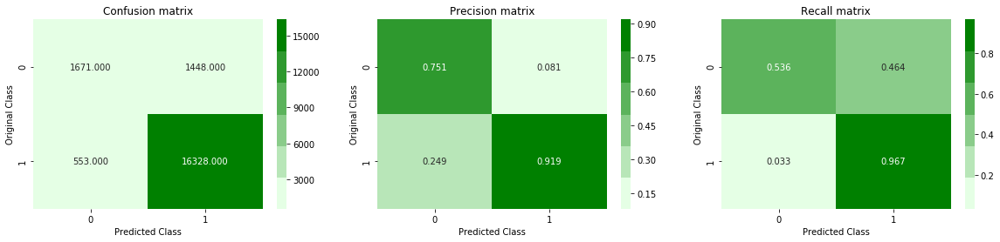

******************************************************************************************************************
RandomSearch
F1 Score:  0.9422017024960324
************************************************************************************************


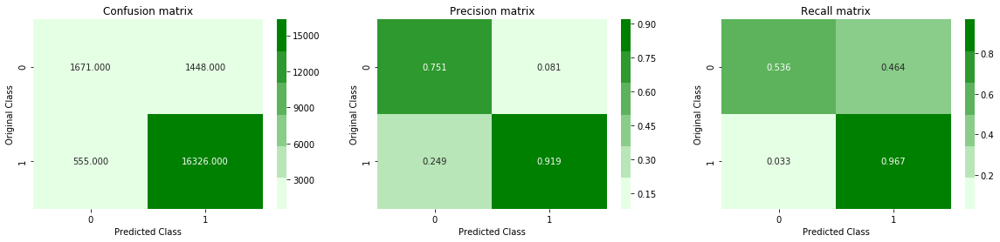

In [23]:
print('GridSearch')
print("F1 Score: ",f1_score(y_test,w2v_log_reg_gs.predict(test_sent_vectors)))
print("******************************************")
plot_confusion_matrix(y_test, w2v_log_reg_gs.predict(test_sent_vectors))
print('******************************************************************************************************************')
print('RandomSearch')
print("F1 Score: ",f1_score(y_test,w2v_log_reg_rs.predict(test_sent_vectors)))
print("************************************************************************************************")
plot_confusion_matrix(y_test, w2v_log_reg_rs.predict(test_sent_vectors))

#### Predicting probablities of given point

In [24]:
test_point_in = 0
predicted_cls = w2v_log_reg_gs.predict(test_sent_vectors[test_point_in].reshape(1,-1))
print("Actual Class :", y_test[test_point_in])
print('GridSearch')
print("Predicted Class :", predicted_cls[0])
print("Predicted Class Probabilities:", np.round(w2v_log_reg_gs.predict_proba(test_sent_vectors[test_point_in].reshape(1,-1)),4))

print('----------------------------------------------------')

predicted_cls = w2v_log_reg_rs.predict(test_sent_vectors[test_point_in].reshape(1,-1))
print('RandomSearch')
print("Predicted Class :", predicted_cls[0])
print("Predicted Class Probabilities:", np.round(w2v_log_reg_rs.predict_proba(test_sent_vectors[test_point_in].reshape(1,-1)),4))


Actual Class : 1
GridSearch
Predicted Class : 1
Predicted Class Probabilities: [[2.000e-04 9.998e-01]]
----------------------------------------------------
RandomSearch
Predicted Class : 1
Predicted Class Probabilities: [[2.000e-04 9.998e-01]]


#### AUC

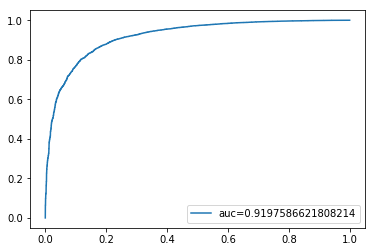

In [25]:
y_pred_proba = w2v_log_reg_rs.predict_proba(test_sent_vectors)[::,1]
fpr, tpr, _ = metrics.roc_curve(y_test,  y_pred_proba)
auc = metrics.roc_auc_score(y_test, y_pred_proba)
plt.plot(fpr,tpr,label="auc="+str(auc))
plt.legend(loc=4)
plt.show()

## Observations:

1. Accuracy and loss both are good.

2.Precision isslightly good but recall is bad for class 0.

3.it can be improved by increasing no. of features.

# ------------------------------------------------------------------------------------------

# DT

#### GridSearch on max_depth

Best: 0.337831 using {'max_depth': 6}
0.399471 (0.001633) with: {'max_depth': 1}
0.379808 (0.001101) with: {'max_depth': 2}
0.364151 (0.001487) with: {'max_depth': 3}
0.349929 (0.001152) with: {'max_depth': 4}
0.343290 (0.001141) with: {'max_depth': 5}
0.337831 (0.001381) with: {'max_depth': 6}
0.348665 (0.012479) with: {'max_depth': 7}


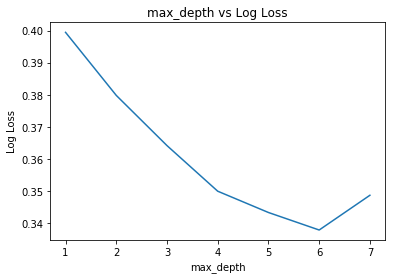

In [26]:
dt_w2v = tree.DecisionTreeClassifier()
grid_parameters = {"max_depth": range(1,8)}
grid_search = GridSearchCV(dt_w2v, grid_parameters, cv=5,scoring="neg_log_loss",n_jobs = -1)
grid_result = grid_search.fit(train_sent_vectors,y_train)

# summarize results
print("Best: %f using %s" % (-grid_result.best_score_, grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (-mean, stdev, param))
# plot
plt.errorbar([1,2,3,4,5,6,7], -means)
plt.title("max_depth vs Log Loss")
plt.xlabel('max_depth')
plt.ylabel('Log Loss')
plt.show()

### Training model on best parameter

#### Accuracy and Loss

In [27]:
dt_w2v = tree.DecisionTreeClassifier(max_depth = 6)
dt_w2v = dt_w2v.fit(train_sent_vectors,y_train)
pred = dt_w2v.predict(train_sent_vectors)
# evaluate accuracy
acc = accuracy_score(y_train, pred) * 100
print('\nThe Train accuracy of the DT classifier is %f%%' % (acc))
# predict the response
pred = dt_w2v.predict(test_sent_vectors)
# evaluate accuracy
acc = accuracy_score(y_test, pred) * 100
print('\nThe Test accuracy of the DT classifier is %f%%' % (acc))
print('GridSearch')
predict_y = dt_w2v.predict_proba(train_sent_vectors)
print("The train log loss is:",log_loss(y_train, predict_y, labels=dt_w2v.classes_, eps=1e-15))
predict_y = dt_w2v.predict_proba(test_sent_vectors)
print("The test log loss is:",log_loss(y_test, predict_y, labels=dt_w2v.classes_, eps=1e-15))


The Train accuracy of the DT classifier is 86.560000%

The Test accuracy of the DT classifier is 86.095000%
GridSearch
The train log loss is: 0.3223345531910418
The test log loss is: 0.3361832168748493


#### F1 Score and Confusion matrix

GridSearch
F1 Score:  0.9214473349716126
******************************************


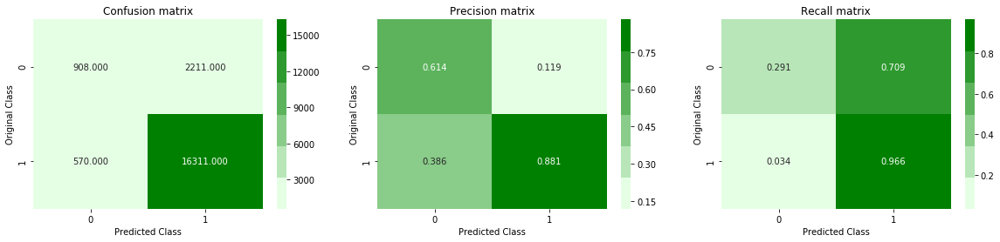

In [28]:
print('GridSearch')
print("F1 Score: ",f1_score(y_test,pred))
print("******************************************")
plot_confusion_matrix(y_test, pred)

#### predicting probablities

In [31]:
test_point_in = 0
predicted_cls = dt_w2v.predict(test_sent_vectors[test_point_in].reshape(1,-1))
print("Actual Class :", y_test[test_point_in])
print('GridSearch')
print("Predicted Class :", predicted_cls[0])
print("Predicted Class Probabilities:", np.round(dt_w2v.predict_proba(test_sent_vectors[test_point_in].reshape(1,-1)),4))



Actual Class : 1
GridSearch
Predicted Class : 1
Predicted Class Probabilities: [[0.013 0.987]]


#### AUC

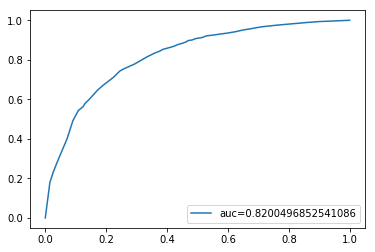

In [32]:
y_pred_proba = dt_w2v.predict_proba(test_sent_vectors)[::,1]
fpr, tpr, _ = metrics.roc_curve(y_test,  y_pred_proba)
auc = metrics.roc_auc_score(y_test, y_pred_proba)
plt.plot(fpr,tpr,label="auc="+str(auc))
plt.legend(loc=4)
plt.show()

## Observaations:

1.both accuarcy and loss is good as comapare to tfidf and bow.

2.Need to improve it more.

# ----------------------------------------------------------------------------------------------------------

## RF

#### GridSearch on no. of estimators and max_depth

In [33]:
rf_w2v= RandomForestClassifier(n_jobs=-1)
grid_parameters = {"n_estimators": range(40,200,50),'max_depth':[3,5,7,9]}
grid_search = GridSearchCV(rf_w2v, grid_parameters, cv=5,scoring="neg_log_loss",n_jobs=-1)
grid_result = grid_search.fit(train_sent_vectors,y_train)

#### Heatmap on max_depth vs n_estimators

Best: 0.293108 using {'max_depth': 9, 'n_estimators': 140}
0.358814 (0.001979) with: {'max_depth': 3, 'n_estimators': 40}
0.357380 (0.001379) with: {'max_depth': 3, 'n_estimators': 90}
0.357474 (0.001021) with: {'max_depth': 3, 'n_estimators': 140}
0.357584 (0.000928) with: {'max_depth': 3, 'n_estimators': 190}
0.329240 (0.001441) with: {'max_depth': 5, 'n_estimators': 40}
0.329030 (0.000978) with: {'max_depth': 5, 'n_estimators': 90}
0.329215 (0.001049) with: {'max_depth': 5, 'n_estimators': 140}
0.329034 (0.001371) with: {'max_depth': 5, 'n_estimators': 190}
0.309201 (0.001617) with: {'max_depth': 7, 'n_estimators': 40}
0.309294 (0.001509) with: {'max_depth': 7, 'n_estimators': 90}
0.308732 (0.001464) with: {'max_depth': 7, 'n_estimators': 140}
0.308532 (0.001397) with: {'max_depth': 7, 'n_estimators': 190}
0.295013 (0.001525) with: {'max_depth': 9, 'n_estimators': 40}
0.293373 (0.001478) with: {'max_depth': 9, 'n_estimators': 90}
0.293108 (0.001650) with: {'max_depth': 9, 'n_estimat

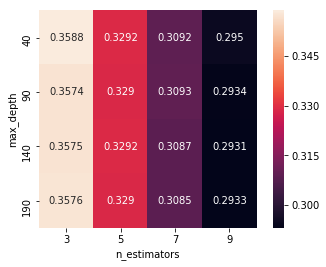

In [36]:
# summarize results
print("Best: %f using %s" % (-grid_result.best_score_, grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (-mean, stdev, param))
    
n_estimators=range(40,200,50)
max_depth=[3,5,7,9]
data = pd.DataFrame(-means.reshape(4,4), columns=n_estimators, index = max_depth)

# plot heatmap
ax = sns.heatmap(data.T,annot=True, square=True,fmt='.4g')
plt.xlabel('n_estimators')
plt.ylabel('max_depth')
plt.show()

## Training model on best parameter

#### Accuracy and Loss

In [37]:
rf_w2v = RandomForestClassifier(n_jobs=-1,class_weight='balanced',n_estimators= 140,max_depth=9)
rf_w2v.fit(train_sent_vectors,y_train)
pred = rf_w2v.predict(train_sent_vectors)

# evaluate accuracy
acc = accuracy_score(y_train, pred) * 100
print('\nThe Train accuracy of the RF classifier is %f%%' % (acc))
# predict the response
pred = rf_w2v.predict(test_sent_vectors)
# evaluate accuracy
acc = accuracy_score(y_test, pred) * 100
print('\nThe Test accuracy of the RF classifier is %f%%' % (acc))
print('***************Log Loss***************')
predict_y = rf_w2v.predict_proba(train_sent_vectors)
print('GridSearch')
print("The train log loss is:",log_loss(y_train, predict_y, labels=rf_w2v.classes_, eps=1e-15))
predict_y = rf_w2v.predict_proba(test_sent_vectors)
print("The test log loss is:",log_loss(y_test, predict_y, labels=rf_w2v.classes_, eps=1e-15))


The Train accuracy of the RF classifier is 86.068750%

The Test accuracy of the RF classifier is 83.775000%
***************Log Loss***************
GridSearch
The train log loss is: 0.3755770714349563
The test log loss is: 0.40267651465615417


#### F1 Score and Confusion matrix

GridSearch
F1 Score:  0.8986412619084804
******************************************


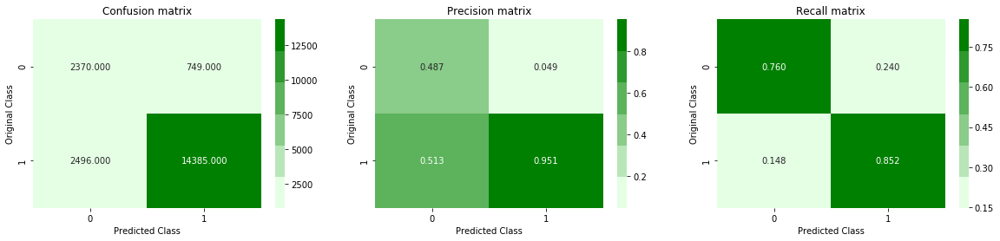

In [38]:
print('GridSearch')
print("F1 Score: ",f1_score(y_test,pred))
print("******************************************")
plot_confusion_matrix(y_test, pred)

#### Predicting probabilities

In [39]:
test_point_in = 0
predicted_cls = rf_w2v.predict(test_sent_vectors[test_point_in].reshape(1,-1))
print("Actual Class :", y_test[test_point_in])
print("Predicted Class :", predicted_cls[0])
print("Predicted Class Probabilities:", np.round(rf_w2v.predict_proba(test_sent_vectors[test_point_in].reshape(1,-1)),4))

Actual Class : 1
Predicted Class : 1
Predicted Class Probabilities: [[0.0844 0.9156]]


#### AUC

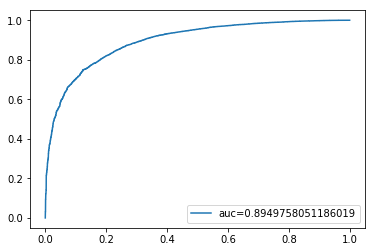

In [40]:
y_pred_proba = rf_w2v.predict_proba(test_sent_vectors)[::,1]
fpr, tpr, _ = metrics.roc_curve(y_test,  y_pred_proba)
auc = metrics.roc_auc_score(y_test, y_pred_proba)
plt.plot(fpr,tpr,label="auc="+str(auc))
plt.legend(loc=4)
plt.show()

In [41]:
important_features_dict = {}
for x,i in enumerate(rf_w2v.feature_importances_):
    important_features_dict[x]=i


important_features_list = sorted(important_features_dict,
                                 key=important_features_dict.get,
                                 reverse=True)

print( 'Most important features: %s' %important_features_list)

Most important features: [44, 8, 0, 11, 6, 18, 21, 16, 19, 5, 26, 13, 9, 36, 32, 43, 30, 10, 17, 27, 46, 35, 48, 22, 42, 34, 1, 31, 3, 47, 20, 23, 38, 15, 40, 24, 37, 39, 29, 49, 45, 2, 12, 41, 25, 33, 28, 4, 7, 14]


## Observations:

1.Accuarcy and loss is good as compare to tfidf and bow.

2.Need need to improve it more

# -----------------------------------------------------------------------------------------------------

# GBDT

In [42]:
w2v_gb = GradientBoostingClassifier()
w2v_gb.fit(train_sent_vectors,y_train)

pred = w2v_gb.predict(train_sent_vectors)
# evaluate accuracy
acc = accuracy_score(y_train, pred) * 100
print('\nThe Train accuracy of the gbdt classifier is %f%%' % (acc))
# predict the response
pred = w2v_gb.predict(test_sent_vectors)
# evaluate accuracy
acc = accuracy_score(y_test, pred) * 100
print('\nThe Test accuracy of the gbdt classifier is %f%%' % (acc))


The Train accuracy of the gbdt classifier is 89.422500%

The Test accuracy of the gbdt classifier is 89.095000%


In [43]:
print('************Log Loss**************')
predict_y = w2v_gb.predict_proba(train_sent_vectors)
print("The train log loss is:",log_loss(y_train, predict_y, labels=w2v_gb.classes_, eps=1e-15))
predict_y = w2v_gb.predict_proba(test_sent_vectors)
print("The test log loss is:",log_loss(y_test, predict_y, labels=w2v_gb.classes_, eps=1e-15))

************Log Loss**************
The train log loss is: 0.25491516419917887
The test log loss is: 0.26459230596263267


GridSearch
F1 Score:  0.9379004014692065
******************************************


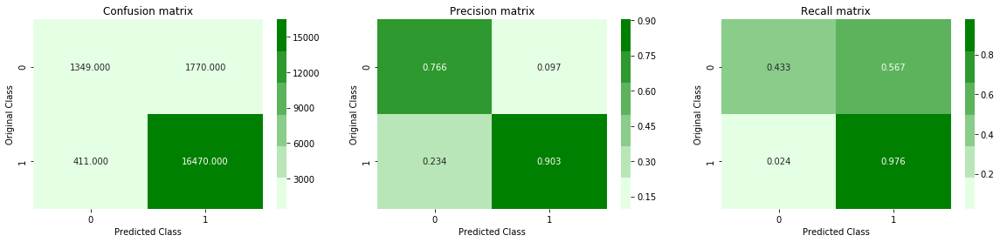

In [44]:
print('GridSearch')
print("F1 Score: ",f1_score(y_test,pred))
print("******************************************")
plot_confusion_matrix(y_test, pred)

#### GridSearch on learning rate and subsample

In [45]:
clf= GradientBoostingClassifier()
grid_parameters = {'learning_rate':[0.001,0.01,0.1],'subsample':[0.6,0.8,1.0]}
grid_search = GridSearchCV(clf, grid_parameters, cv=3,scoring="neg_log_loss",n_jobs=-1)
grid_result = grid_search.fit(train_sent_vectors,y_train)

#### HeatMap learning rate vs subsample

Best: 0.264780 using {'learning_rate': 0.1, 'subsample': 0.6}
0.418914 (0.000052) with: {'learning_rate': 0.001, 'subsample': 0.6}
0.418984 (0.000070) with: {'learning_rate': 0.001, 'subsample': 0.8}
0.419061 (0.000072) with: {'learning_rate': 0.001, 'subsample': 1.0}
0.356032 (0.000450) with: {'learning_rate': 0.01, 'subsample': 0.6}
0.356552 (0.000416) with: {'learning_rate': 0.01, 'subsample': 0.8}
0.357071 (0.000500) with: {'learning_rate': 0.01, 'subsample': 1.0}
0.264780 (0.000920) with: {'learning_rate': 0.1, 'subsample': 0.6}
0.265604 (0.001069) with: {'learning_rate': 0.1, 'subsample': 0.8}
0.266006 (0.001146) with: {'learning_rate': 0.1, 'subsample': 1.0}


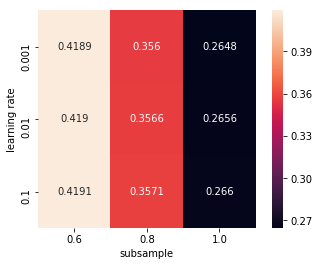

In [46]:
# summarize results
print("Best: %f using %s" % (-grid_result.best_score_, grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (-mean, stdev, param))

learning_rate=[0.001,0.01,0.1]
subsample = [0.6,0.8,1.0]
data = pd.DataFrame(-means.reshape(3,3), columns=learning_rate, index = subsample)
# plot heatmap
ax = sns.heatmap(data.T,annot=True, square=True,fmt='.4g')
plt.xlabel('subsample')
plt.ylabel('learning rate')
plt.show()

### Training model on best parameter

#### Accuarcy and loss

In [47]:
gbdt = GradientBoostingClassifier(learning_rate=0.1,subsample=0.6)
gbdt.fit(train_sent_vectors,y_train)
pred = gbdt.predict(train_sent_vectors)

# evaluate accuracy
acc = accuracy_score(y_train, pred) * 100
print('\nThe Train accuracy of the RF classifier is %f%%' % (acc))
# predict the response
pred = gbdt.predict(test_sent_vectors)
# evaluate accuracy
acc = accuracy_score(y_test, pred) * 100
print('\nThe Test accuracy of the RF classifier is %f%%' % (acc))
print('************Log Loss**************')
predict_y = gbdt.predict_proba(train_sent_vectors)
print("The train log loss is:",log_loss(y_train, predict_y, labels=gbdt.classes_, eps=1e-15))
predict_y = gbdt.predict_proba(test_sent_vectors)
print("The test log loss is:",log_loss(y_test, predict_y, labels=gbdt.classes_, eps=1e-15))


The Train accuracy of the RF classifier is 89.543750%

The Test accuracy of the RF classifier is 89.030000%
************Log Loss**************
The train log loss is: 0.2544248785093646
The test log loss is: 0.2630453259909758


#### F1 Score and Confusion matrix

GridSearch
F1 Score:  0.9373786961981961
******************************************


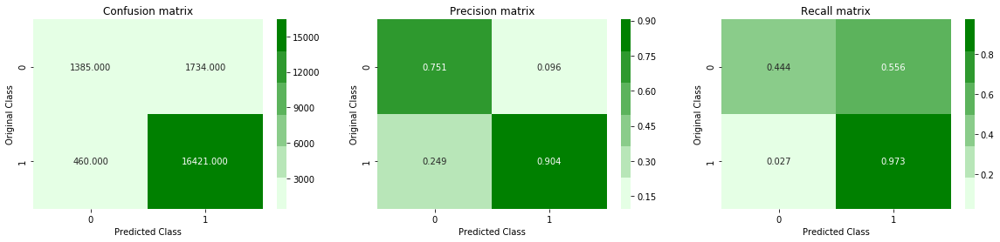

In [48]:
print('GridSearch')
print("F1 Score: ",f1_score(y_test,pred))
print("******************************************")
plot_confusion_matrix(y_test, pred)

#### predicting Probabilities

In [49]:
test_point_in = 0
predicted_cls = gbdt.predict(test_sent_vectors[test_point_in].reshape(1,-1))
print("Actual Class :", y_test[test_point_in])
print("Predicted Class :", predicted_cls[0])
print("Predicted Class Probabilities:", np.round(gbdt.predict_proba(test_sent_vectors[test_point_in].reshape(1,-1)),4))


Actual Class : 1
Predicted Class : 1
Predicted Class Probabilities: [[0.0123 0.9877]]


#### AUC

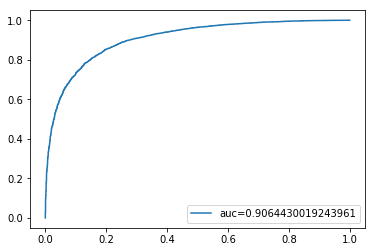

In [50]:
y_pred_proba = gbdt.predict_proba(test_sent_vectors)[::,1]
fpr, tpr, _ = metrics.roc_curve(y_test,  y_pred_proba)
auc = metrics.roc_auc_score(y_test, y_pred_proba)
plt.plot(fpr,tpr,label="auc="+str(auc))
plt.legend(loc=4)
plt.show()

## Observations:

1.Accuaracy and loss both are good.

2.Precision is good for class 0 but recall is not good.

# ---------------------------------------------------------------------------------------------------------

## XGBOOST

### Training model 

#### Accuracy and Loss

In [51]:
xgb = xgb.XGBClassifier().fit(train_sent_vectors,y_train)
pred = xgb.predict(train_sent_vectors)
# evaluate accuracy
acc = accuracy_score(y_train, pred) * 100
print('\nThe Train accuracy of the xgbdt classifier is %f%%' % (acc))
# predict the response
pred = xgb.predict(test_sent_vectors)
# evaluate accuracy
acc = accuracy_score(y_test, pred) * 100
print('\nThe Test accuracy of the xgbdt classifier is %f%%' % (acc))
print('************Log Loss**************')
predict_y = xgb.predict_proba(train_sent_vectors)
print("The train log loss is:",log_loss(y_train, predict_y, labels=xgb.classes_, eps=1e-15))
predict_y = xgb.predict_proba(test_sent_vectors)
print("The test log loss is:",log_loss(y_test, predict_y, labels=xgb.classes_, eps=1e-15))


The Train accuracy of the xgbdt classifier is 89.293750%

The Test accuracy of the xgbdt classifier is 88.905000%
************Log Loss**************
The train log loss is: 0.25670221602332166
The test log loss is: 0.2658120418433042


#### F1 Score and Confusion matrix

GridSearch
F1 Score:  0.9369190095801233
******************************************


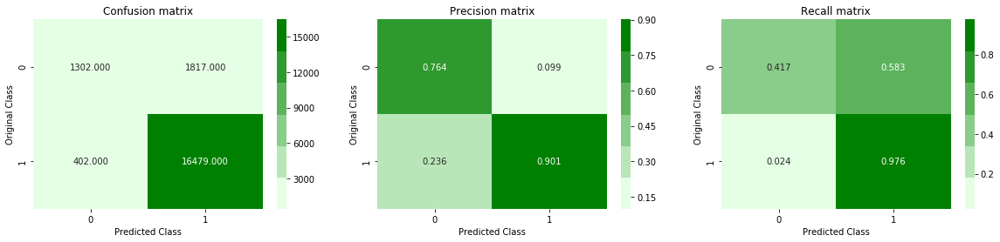

In [52]:
print('GridSearch')
print("F1 Score: ",f1_score(y_test,pred))
print("******************************************")
plot_confusion_matrix(y_test, pred)

#### Predicting Probabilities

In [53]:
test_point_in = 0
predicted_cls = xgb.predict(test_sent_vectors[test_point_in].reshape(1,-1))
print("Predicted Class :", predicted_cls[0])
print("Predicted Class Probabilities:", np.round(xgb.predict_proba(test_sent_vectors[test_point_in].reshape(1,-1)),4))
print("Actual Class :", y_test[test_point_in])

Predicted Class : 1
Predicted Class Probabilities: [[0.007 0.993]]
Actual Class : 1


#### AUC

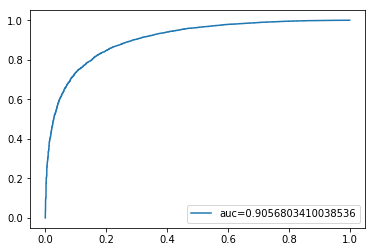

In [54]:
y_pred_proba = xgb.predict_proba(test_sent_vectors)[::,1]
fpr, tpr, _ = metrics.roc_curve(y_test,  y_pred_proba)
auc = metrics.roc_auc_score(y_test, y_pred_proba)
plt.plot(fpr,tpr,label="auc="+str(auc))
plt.legend(loc=4)
plt.show()

## Observations:

1.Accurarcy and loss is good

2.precision for class 0 is good but recall is bad

# ----------------------------------------------------------------------------------------------------

## Linear SVM

#### Gridseach on C

In [27]:
from sklearn.svm import LinearSVC
svm_clf = LinearSVC(loss = 'hinge',class_weight ='balanced')
start= time.time()
grid_parameters = {'C':[10**-3,10**-2,10**0,10**2,10**3]}
gridSearchModel = GridSearchCV(svm_clf, grid_parameters, cv=5,n_jobs=-1)
gridSearchModel.fit(train_sent_vectors, y_train)
print(gridSearchModel.best_params_)
print('GridSearch Time: ',(time.time() - start))

{'C': 1000}
GridSearch Time:  132.14169120788574


### Training model on best parameter

#### Accuracy and loss

In [28]:
lr_svm = LinearSVC( C=gridSearchModel.best_params_['C'],class_weight='balanced',penalty='l2')
lr_svm.fit(train_sent_vectors, y_train)
tr_score = lr_svm.score(train_sent_vectors, y_train)
print("GridSearch")
print("Training Accuracy :",tr_score)
tr_score = lr_svm.score(test_sent_vectors, y_test)
print("Test Accuracy :",tr_score)
print('******************Hinge Loss***************')
print("Train loss :",hinge_loss(y_train,lr_svm.predict(train_sent_vectors)))
print("Test loss :",hinge_loss(y_test,lr_svm.predict(test_sent_vectors)))

GridSearch
Training Accuracy : 0.865225
Test Accuracy : 0.86645
******************Hinge Loss***************
Train loss : 0.2907375
Test loss : 0.2895


#### F1 Score and Confusion matrix

F1 Score:  0.9221305501297339
******************************************


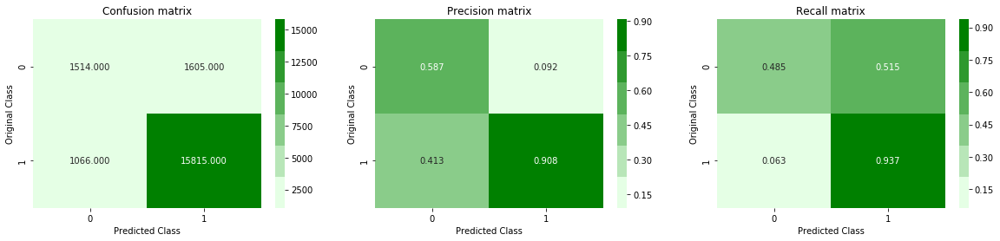

In [29]:
print("F1 Score: ",f1_score(y_test,lr_svm.predict(test_sent_vectors)))
print("******************************************")
plot_confusion_matrix(y_test, lr_svm.predict(test_sent_vectors))

## Observations:

1.Accuaracy and loss both are good.

2.Precision is good for class 0 but recall is not good.

# -------------------------------------------------------------------------------------------------

## RBF-SVM

#### GridSearch on C

#### Accuracy and Loss

In [30]:
svm_clf = svm.SVC()
grid_parameters = {'C':[10**-2,10**0,10**2],'gamma':[10**-1,10**0,10**1]}
gridSearchModel = GridSearchCV(svm_clf, grid_parameters, cv=3,n_jobs=-1)
gridSearchModel.fit(train_sent_vectors, y_train)
print("GridSearch:",gridSearchModel.best_params_)

svm = svm.SVC(gamma=gridSearchModel.best_params_['gamma'], C=gridSearchModel.best_params_['C'],probability=True,class_weight='balanced')
svm.fit(train_sent_vectors, y_train)
tr_score = svm.score(train_sent_vectors, y_train)
print("Training Accuracy :",tr_score)
tr_score = svm.score(test_sent_vectors, y_test)
print("Test Accuracy :",tr_score)

GridSearch: {'C': 100, 'gamma': 0.1}
Training Accuracy : 0.999975
Test Accuracy : 0.89245


In [31]:
print('***************Log Loss***************')
predict_y = svm.predict_proba(train_sent_vectors)
print('GridSearch')
print("The train log loss is:",log_loss(y_train, predict_y, labels=svm.classes_, eps=1e-15))
predict_y = svm.predict_proba(test_sent_vectors)
print("The test log loss is:",log_loss(y_test, predict_y, labels=svm.classes_, eps=1e-15))

***************Log Loss***************
GridSearch
The train log loss is: 0.03582332773913689
The test log loss is: 0.2674624252166264


#### F1 Score and Confusion matrix

F1 Score:  0.9385867237687366
******************************************


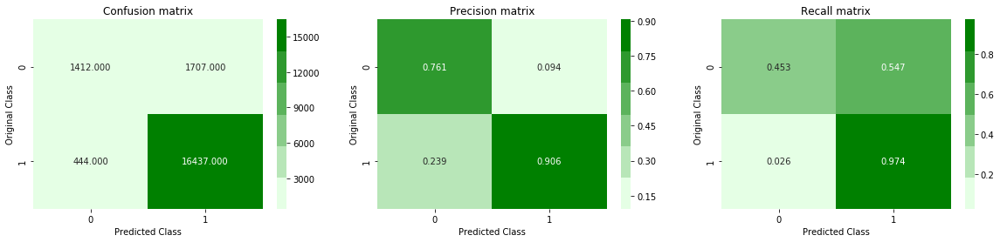

In [32]:
print("F1 Score: ",f1_score(y_test,svm.predict(test_sent_vectors)))
print("******************************************")
plot_confusion_matrix(y_test, svm.predict(test_sent_vectors))

#### Predicting Probabilities

In [33]:
test_point_in = 0
predicted_cls = svm.predict(test_sent_vectors[test_point_in].reshape(1,-1))
print("Predicted Class :", predicted_cls[0])
print("Predicted Class Probabilities:", np.round(svm.predict_proba(test_sent_vectors[test_point_in].reshape(1,-1)),4))
print("Actual Class :", y_test[test_point_in])

Predicted Class : 1
Predicted Class Probabilities: [[0.0759 0.9241]]
Actual Class : 1


#### Auc

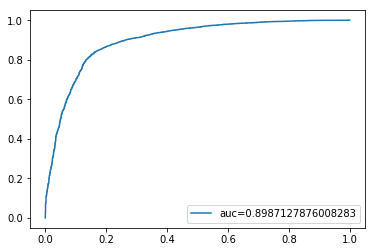

In [34]:
y_pred_proba = svm.predict_proba(test_sent_vectors)[::,1]
fpr, tpr, _ = metrics.roc_curve(y_test,  y_pred_proba)
auc = metrics.roc_auc_score(y_test, y_pred_proba)
plt.plot(fpr,tpr,label="auc="+str(auc))
plt.legend(loc=4)
plt.show()

## Observations:

1.Training accuracy is high and test accuarcy is low .

2.Train loss is low but test low is high  our model is overfitting.

# ----------------------------------------------------------------------------------------------------

## KNN 

#### gridsearch on Nearest neighbours

In [35]:
start=time.time()
clf = KNeighborsClassifier(n_jobs = -1)
grid_parameters = {'n_neighbors':[3,5,7,9]}
grid_search = GridSearchCV(clf, grid_parameters, cv=3,scoring="neg_log_loss",n_jobs=-1)
grid_result = grid_search.fit(train_sent_vectors,y_train)
print('GridSearch Time: ',(time.time() - start))

GridSearch Time:  2410.4489221572876


#### No. of neighbours vs Loss

Best: 0.707122 using {'n_neighbors': 9}
1.840405 (0.023453) with: {'n_neighbors': 3}
1.181527 (0.026462) with: {'n_neighbors': 5}
0.880494 (0.013621) with: {'n_neighbors': 7}
0.707122 (0.024004) with: {'n_neighbors': 9}


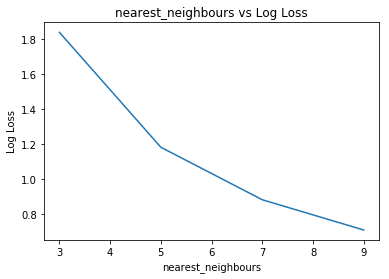

In [36]:
# summarize results
print("Best: %f using %s" % (-grid_result.best_score_, grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (-mean, stdev, param))
# plot
plt.errorbar([3,5,7,9], -means)
plt.title("nearest_neighbours vs Log Loss")
plt.xlabel('nearest_neighbours')
plt.ylabel('Log Loss')
plt.show()

### Training on best paremeter

##### Accuracy and loss

In [37]:
knn = KNeighborsClassifier(n_neighbors = 9)
knn.fit(train_sent_vectors,y_train)
pred = knn.predict(train_sent_vectors)
# evaluate accuracy
acc = accuracy_score(y_train, pred) * 100
print('\nThe Train accuracy of the DT classifier is %f%%' % (acc))
# predict the response
pred = knn.predict(test_sent_vectors)
# evaluate accuracy
acc = accuracy_score(y_test, pred) * 100
print('\nThe Test accuracy of the DT classifier is %f%%' % (acc))
print('GridSearch')
predict_y = knn.predict_proba(train_sent_vectors)
print("The train log loss is:",log_loss(y_train, predict_y, labels=knn.classes_, eps=1e-15))
predict_y = knn.predict_proba(test_sent_vectors)
print("The test log loss is:",log_loss(y_test, predict_y, labels=knn.classes_, eps=1e-15))


The Train accuracy of the DT classifier is 90.098750%

The Test accuracy of the DT classifier is 88.555000%
GridSearch
The train log loss is: 0.2157392607888979
The test log loss is: 0.6724966262889406


#### F1 Score and Confusion matrix

GridSearch
F1 Score:  0.9352493564538484
******************************************


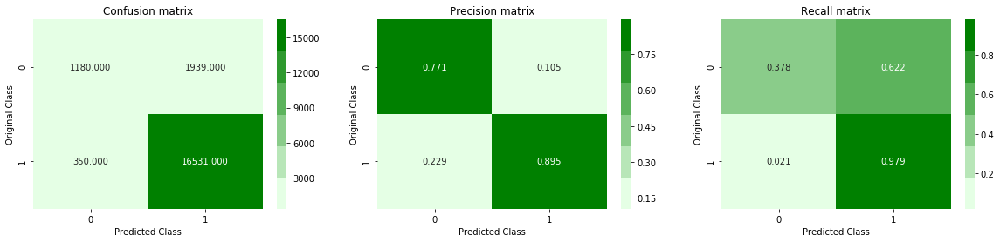

In [38]:
print('GridSearch')
print("F1 Score: ",f1_score(y_test,pred))
print("******************************************")
plot_confusion_matrix(y_test, pred)

In [77]:
del train_sent_vectors,clf,dt,xgb,knn,clf_i,svm,lr_svm,gbdt

## Observations:

1.There is large difference between train and test loss so our model is overfitting.

In [2]:
y = PrettyTable(['W2V'])
print(y)
x  =PrettyTable(["Model", "Test Accuracy", "Train Loss",'Test Loss','F1 Score'])
x.add_row(['Gaussian Naive Bayes',84.72,0.42,0.42,0.906])
x.add_row(['Logistic Reg',89.99,0.24 , 0.24,0.942])
x.add_row(['DT',86.09,0.32,0.33,0.921])
x.add_row(['Random Forest',83.77,0.37,0.40,0.898])
x.add_row(['GBDT',89.03,0.25,0.26,0.937])
x.add_row(['XGBOOST',88.90,0.25,0.26,0.936])
x.add_row(['Linear SVM',86.64,0.29,0.28,0.922])
x.add_row(['RBF SVM',89.24,0.03,0.26,0.938])
x.add_row(['KNN',88.55,0.21,0.67,0.935])

print(x)

+-----+
| W2V |
+-----+
+-----+
+----------------------+---------------+------------+-----------+----------+
|        Model         | Test Accuracy | Train Loss | Test Loss | F1 Score |
+----------------------+---------------+------------+-----------+----------+
| Gaussian Naive Bayes |     84.72     |    0.42    |    0.42   |  0.906   |
|     Logistic Reg     |     89.99     |    0.24    |    0.24   |  0.942   |
|          DT          |     86.09     |    0.32    |    0.33   |  0.921   |
|    Random Forest     |     83.77     |    0.37    |    0.4    |  0.898   |
|         GBDT         |     89.03     |    0.25    |    0.26   |  0.937   |
|       XGBOOST        |      88.9     |    0.25    |    0.26   |  0.936   |
|      Linear SVM      |     86.64     |    0.29    |    0.28   |  0.922   |
|       RBF SVM        |     89.24     |    0.03    |    0.26   |  0.938   |
|         KNN          |     88.55     |    0.21    |    0.67   |  0.935   |
+----------------------+---------------+----

## Overall Observation of Different Models:

1.Naive bayes are not goood for less no. of features

2.Decision tree is improved ascompare to BOW nad Tfidf 

3.KNN is not good in W2v


# -----------------------------///////////////////////\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\-----------------------------------

# Tfidf-Weighted-W2V

In [15]:
tf_idf_vectorizer = TfidfVectorizer(min_df = 5)
train_tfidf = tf_idf_vectorizer.fit_transform(X_train['NewCleanedText'])
# we use the same vectorizer that was trained on train data
test_tfidf = tf_idf_vectorizer.transform(X_test['NewCleanedText'])
print("the shape of out train text TFIDF vectorizer ",train_tfidf.get_shape())
print("the shape of out test text TFIDF vectorizer ",test_tfidf.get_shape())



the shape of out train text TFIDF vectorizer  (80000, 10700)
the shape of out test text TFIDF vectorizer  (20000, 10700)


In [25]:
import pickle
import os
if not os.path.isfile('test_tfidf_sent_vectors'):
    

    tfidf_feat = tf_idf_vectorizer.get_feature_names() # tfidf words/col-names
    # final_tf_idf is the sparse matrix with row= sentence, col=word and cell_val = tfidf
    test_tfidf_sent_vectors = []; # the tfidf-w2v for each sentence/review is stored in this list
    row=0;
    for sent in list_of_test_sent: # for each review/sentence 
        sent_vec = np.zeros(50) # as word vectors are of zero length
        weight_sum =0; # num of words with a valid vector in the sentence/review
        for word in sent:
            try:
                if word in w2v_words:    # obtain the tf_idfidf of a word in a sentence/review
                
                    vec = w2v_model.wv[word]
                
                    tf_idf = test_tfidf[row, tfidf_feat.index(word)]
                    sent_vec += (vec * tf_idf)
                    weight_sum += tf_idf
                    # for each word in a review/sentence
            
            except:
                pass
        if weight_sum != 0:
            sent_vec /= weight_sum
        test_tfidf_sent_vectors.append(sent_vec)
        row += 1
        # saving vector list
    with open("test_tfidf_sent_vectors", "wb") as fp:   #Pickling
        pickle.dump(test_tfidf_sent_vectors, fp)

    print(len(test_tfidf_sent_vectors))
    print(len(test_tfidf_sent_vectors[0]))
print("**************************************")
if not os.path.isfile('train_tfidf_sent_vectors'):
    
    tfidf_feat = tf_idf_vectorizer.get_feature_names()
    train_tfidf_sent_vectors = []; # the tfidf-w2v for each sentence/review is stored in this list
    row=0;
    for sent in list_of_train_sent: # for each review/sentence 
        sent_vec = np.zeros(50) # as word vectors are of zero length
        weight_sum =0; # num of words with a valid vector in the sentence/review
        for word in sent:
            try:
                if word in w2v_words:    # obtain the tf_idfidf of a word in a sentence/review
                
                    vec = w2v_model.wv[word]
                
                    tf_idf = train_tfidf[row, tfidf_feat.index(word)]
                    sent_vec += (vec * tf_idf)
                    weight_sum += tf_idf
                    # for each word in a review/sentence
            
            except:
                pass
        if weight_sum != 0:
            sent_vec /= weight_sum
        train_tfidf_sent_vectors.append(sent_vec)
        row += 1
        # saving vector list
    with open("train_tfidf_sent_vectors", "wb") as fp:   #Pickling
        pickle.dump(train_tfidf_sent_vectors, fp)

    print(len(train_tfidf_sent_vectors))
    print(len(train_tfidf_sent_vectors[0]))
with open("train_tfidf_sent_vectors", "rb") as fp:   # Unpickling
    train_tfidf_sent_vectors = pickle.load(fp)
print(len(train_tfidf_sent_vectors))
print(len(train_tfidf_sent_vectors[0]))
print('------------------------------')
with open("test_tfidf_sent_vectors", "rb") as fp:   # Unpickling
    test_tfidf_sent_vectors = pickle.load(fp)
print(len(test_tfidf_sent_vectors))
print(len(test_tfidf_sent_vectors[0]))

**************************************
80000
50
------------------------------
20000
50


In [28]:
# Standardize
train_tfidf_sent_vectors = StandardScaler(with_mean=True).fit_transform(train_tfidf_sent_vectors)
test_tfidf_sent_vectors = StandardScaler(with_mean=True).fit_transform(test_tfidf_sent_vectors)

## Log-Reg

#### GridSearch on C and Penalty

In [20]:
log_reg = LogisticRegression(solver = 'liblinear')
grid_parameters = {'C':[10**-2, 10**-1, 1, 10, 100],'penalty':['l1','l2']}
gridSearchModel = GridSearchCV(log_reg, grid_parameters, cv=5,n_jobs = -1)
gridSearchModel.fit(train_tfidf_sent_vectors, y_train)
print("GridSearch:",gridSearchModel.best_params_)

GridSearch: {'C': 1, 'penalty': 'l1'}


### Training model on best parameters

#### Accuracy and loss

In [21]:
clf_log_reg_gs = LogisticRegression(class_weight='balanced',penalty=gridSearchModel.best_params_['penalty'], C=gridSearchModel.best_params_['C'],solver = 'liblinear',n_jobs = -1)
clf_log_reg_gs.fit(train_tfidf_sent_vectors, y_train)
tr_score = clf_log_reg_gs.score(train_tfidf_sent_vectors, y_train)
print("GridSearch")
print("Training Accuracy :",tr_score)
tr_score = clf_log_reg_gs.score(test_tfidf_sent_vectors, y_test)
print("Test Accuracy :",tr_score)
print("*************************************")
print("Log Loss")
print("*************************************")
predict_y = clf_log_reg_gs.predict_proba(train_tfidf_sent_vectors)
print('GridSearch')
print("The train log loss is:",log_loss(y_train, predict_y, labels=clf_log_reg_gs.classes_, eps=1e-15))
predict_y = clf_log_reg_gs.predict_proba(test_tfidf_sent_vectors)
print("The test log loss is:",log_loss(y_test, predict_y, labels=clf_log_reg_gs.classes_, eps=1e-15))


GridSearch
Training Accuracy : 0.8134
Test Accuracy : 0.81315
*************************************
Log Loss
*************************************
GridSearch
The train log loss is: 0.418363671465109
The test log loss is: 0.4165027220761317


#### F1 Score and Confusion Matrix

GridSearch
F1 Score:  0.8798662680425627
******************************************


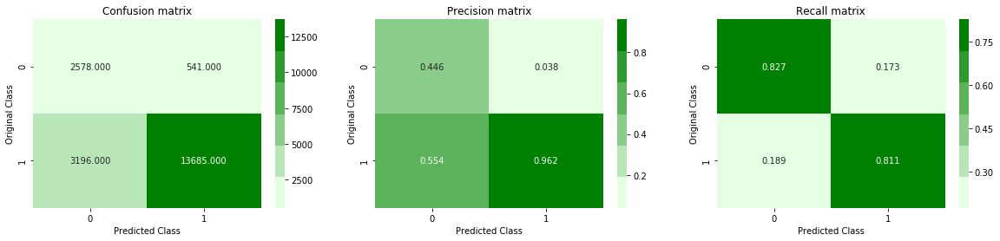

In [22]:
print('GridSearch')
print("F1 Score: ",f1_score(y_test,clf_log_reg_gs.predict(test_tfidf_sent_vectors)))
print("******************************************")
plot_confusion_matrix(y_test, clf_log_reg_gs.predict(test_tfidf_sent_vectors))

#### Predicting Probabilities

In [23]:
test_point_in = 0
print("Actual Class :", y_test[test_point_in])
print('----------------------------------------------------')
predicted_cls = clf_log_reg_gs.predict(test_tfidf_sent_vectors[test_point_in].reshape(1,-1))
print('GridSearch')
print("Predicted Class :", predicted_cls[0])
print("Predicted Class Probabilities:", np.round(clf_log_reg_gs.predict_proba(test_tfidf_sent_vectors[test_point_in].reshape(1,-1)),4))


Actual Class : 1
----------------------------------------------------
GridSearch
Predicted Class : 1
Predicted Class Probabilities: [[0.0043 0.9957]]


## Observations:

1.Both train and test loss is high.

2.Precision for clas 0 is bad but recall is good.

# -----------------------------------------------------------------------------------------------------

##  DT

#### GridSearch on max_depth

Best: 0.361743 using {'max_depth': 6}
0.411264 (0.001515) with: {'max_depth': 1}
0.394627 (0.000919) with: {'max_depth': 2}
0.382104 (0.001650) with: {'max_depth': 3}
0.372326 (0.002221) with: {'max_depth': 4}
0.364433 (0.002834) with: {'max_depth': 5}
0.361743 (0.003252) with: {'max_depth': 6}
0.368633 (0.002882) with: {'max_depth': 7}


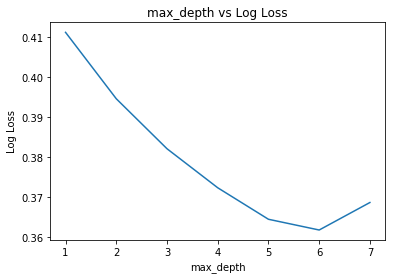

In [24]:
dt = tree.DecisionTreeClassifier()
grid_parameters = {"max_depth": range(1,8)}
grid_search = GridSearchCV(dt, grid_parameters, cv=5,scoring="neg_log_loss",n_jobs = -1)
grid_result = grid_search.fit(train_tfidf_sent_vectors,y_train)

# summarize results
print("Best: %f using %s" % (-grid_result.best_score_, grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (-mean, stdev, param))
# plot
plt.errorbar([1,2,3,4,5,6,7], -means)
plt.title("max_depth vs Log Loss")
plt.xlabel('max_depth')
plt.ylabel('Log Loss')
plt.show()

### Training Model on best parameter

#### Accuracy and Loss

In [25]:
dt = tree.DecisionTreeClassifier(max_depth = 6)
dt = dt.fit(train_tfidf_sent_vectors,y_train)
pred = dt.predict(train_tfidf_sent_vectors)
# evaluate accuracy
acc = accuracy_score(y_train, pred) * 100
print('\nThe Train accuracy of the DT classifier is %f%%' % (acc))
# predict the response
pred = dt.predict(test_tfidf_sent_vectors)
# evaluate accuracy
acc = accuracy_score(y_test, pred) * 100
print('\nThe Test accuracy of the DT classifier is %f%%' % (acc))


The Train accuracy of the DT classifier is 85.846250%

The Test accuracy of the DT classifier is 85.420000%


In [26]:
print("Log Loss")
predict_y = dt.predict_proba(train_tfidf_sent_vectors)
print('GridSearch')
print("The train log loss is:",log_loss(y_train, predict_y, labels=dt.classes_, eps=1e-15))
predict_y = dt.predict_proba(test_tfidf_sent_vectors)
print("The test log loss is:",log_loss(y_test, predict_y, labels=dt.classes_, eps=1e-15))

Log Loss
GridSearch
The train log loss is: 0.34645284772597595
The test log loss is: 0.3556290073651745


#### F1 score and Confusion matrix

GridSearch
F1 Score:  0.9185656836461127
******************************************


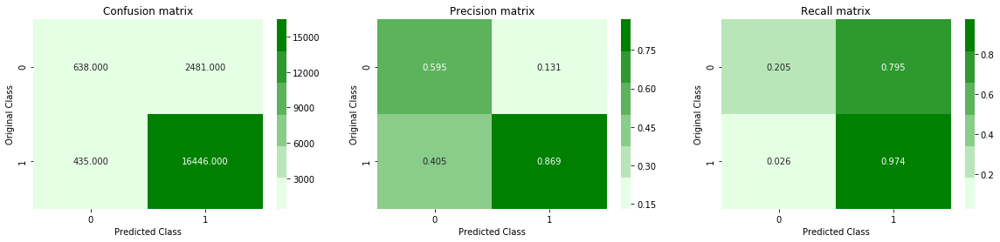

In [27]:
print('GridSearch')
print("F1 Score: ",f1_score(y_test,pred))
print("******************************************")
plot_confusion_matrix(y_test, pred)

## Obseravations:

1.Training and Test loss is good as compare to bow and tfidf.

2.Precision and recall are not good for class 0.

3.Need more improvement.

# -----------------------------------------------------------------------------------------------------------

## RF

In [28]:
clf = RandomForestClassifier(n_estimators = 90,n_jobs=-1)
clf.fit(train_tfidf_sent_vectors,y_train)
pred = clf.predict(train_tfidf_sent_vectors)

# evaluate accuracy
acc = accuracy_score(y_train, pred) * 100
print('\nThe Train accuracy of the RF classifier is %f%%' % (acc))
# predict the response
pred = clf.predict(test_tfidf_sent_vectors)
# evaluate accuracy
acc = accuracy_score(y_test, pred) * 100
print('\nThe Test accuracy of the RF classifier is %f%%' % (acc))


The Train accuracy of the RF classifier is 99.997500%

The Test accuracy of the RF classifier is 87.775000%


#### GridSearch on no. of estimators and max_depth

In [29]:
clf= RandomForestClassifier(n_jobs=-1)
grid_parameters = {"n_estimators": range(20,100,10),'max_depth':[3,5,7]}
grid_search = GridSearchCV(clf, grid_parameters, cv=5,scoring="neg_log_loss",n_jobs=-1)
grid_result = grid_search.fit(train_tfidf_sent_vectors,y_train)

# summarize results
print("Best: %f using %s" % (-grid_result.best_score_, grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (-mean, stdev, param))


Best: 0.334787 using {'max_depth': 7, 'n_estimators': 90}
0.376934 (0.001271) with: {'max_depth': 3, 'n_estimators': 20}
0.376810 (0.000862) with: {'max_depth': 3, 'n_estimators': 30}
0.376966 (0.001237) with: {'max_depth': 3, 'n_estimators': 40}
0.376454 (0.001711) with: {'max_depth': 3, 'n_estimators': 50}
0.376361 (0.001631) with: {'max_depth': 3, 'n_estimators': 60}
0.376554 (0.000549) with: {'max_depth': 3, 'n_estimators': 70}
0.376436 (0.000520) with: {'max_depth': 3, 'n_estimators': 80}
0.376682 (0.000715) with: {'max_depth': 3, 'n_estimators': 90}
0.354646 (0.001821) with: {'max_depth': 5, 'n_estimators': 20}
0.353527 (0.001652) with: {'max_depth': 5, 'n_estimators': 30}
0.353640 (0.000625) with: {'max_depth': 5, 'n_estimators': 40}
0.353008 (0.000902) with: {'max_depth': 5, 'n_estimators': 50}
0.353286 (0.001065) with: {'max_depth': 5, 'n_estimators': 60}
0.353544 (0.000923) with: {'max_depth': 5, 'n_estimators': 70}
0.353008 (0.001022) with: {'max_depth': 5, 'n_estimators': 8

#### Heatmap

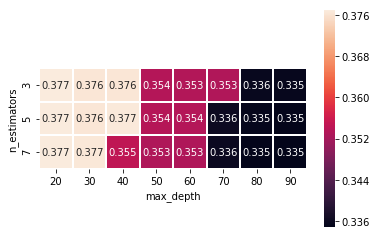

In [37]:
n_estimators=range(20,100,10)
max_depth = [3,5,7]
data = pd.DataFrame(-means.reshape(8,3), columns=max_depth, index = n_estimators)
# plot heatmap
ax = sns.heatmap(data.T,annot=True, square=True,fmt='.3g',linewidths=1)
plt.xlabel('max_depth')
plt.ylabel('n_estimators')
plt.show()

### Training model on best parameters

#### Accuracy and Loss

In [47]:
clf = RandomForestClassifier(n_estimators = 200,max_depth=9,n_jobs=-1)
clf.fit(train_tfidf_sent_vectors,y_train)
pred = clf.predict(train_tfidf_sent_vectors)

# evaluate accuracy
acc = accuracy_score(y_train, pred) * 100
print('\nThe Train accuracy of the RF classifier is %f%%' % (acc))
# predict the response
pred = clf.predict(test_tfidf_sent_vectors)
# evaluate accuracy
acc = accuracy_score(y_test, pred) * 100
print('\nThe Test accuracy of the RF classifier is %f%%' % (acc))


The Train accuracy of the RF classifier is 87.548750%

The Test accuracy of the RF classifier is 86.470000%


In [48]:
print("Log Loss")
predict_y = clf.predict_proba(train_tfidf_sent_vectors)
print('GridSearch')
print("The train log loss is:",log_loss(y_train, predict_y, labels=clf.classes_, eps=1e-15))
predict_y = clf.predict_proba(test_tfidf_sent_vectors)
print("The test log loss is:",log_loss(y_test, predict_y, labels=clf.classes_, eps=1e-15))

Log Loss
GridSearch
The train log loss is: 0.28575095410965784
The test log loss is: 0.31859384577965155


#### F1 Score and Confusion matrix

GridSearch
F1 Score:  0.925289895085588
******************************************


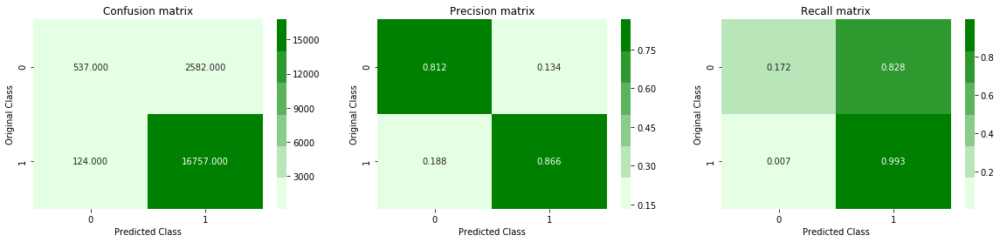

In [49]:
print('GridSearch')
print("F1 Score: ",f1_score(y_test,pred))
print("******************************************")
plot_confusion_matrix(y_test, pred)

## Observations:

1.Loss is good as comppare tobow and tfidf model.

2.Precision is good for class 0 but recall is bad

3.need more improvement.

# ---------------------------------------------------------------------------------------------------------

## GBDT

#### GridSearch on no. of estimators and subsample

In [97]:
clf= GradientBoostingClassifier()
grid_parameters = {'n_estimators':[150,300,500],'subsample':[0.6,0.8,1.0]}
grid_search = GridSearchCV(clf, grid_parameters, cv=3,scoring="neg_log_loss",n_jobs=-1)
grid_result = grid_search.fit(train_tfidf_sent_vectors,y_train)

#### HeatMap

Best: 0.269407 using {'n_estimators': 500, 'subsample': 0.8}
0.285738 (0.002413) with: {'n_estimators': 150, 'subsample': 0.6}
0.286213 (0.002383) with: {'n_estimators': 150, 'subsample': 0.8}
0.286731 (0.002203) with: {'n_estimators': 150, 'subsample': 1.0}
0.275387 (0.002088) with: {'n_estimators': 300, 'subsample': 0.6}
0.274758 (0.002952) with: {'n_estimators': 300, 'subsample': 0.8}
0.275588 (0.003354) with: {'n_estimators': 300, 'subsample': 1.0}
0.270213 (0.003741) with: {'n_estimators': 500, 'subsample': 0.6}
0.269407 (0.002193) with: {'n_estimators': 500, 'subsample': 0.8}
0.270268 (0.003407) with: {'n_estimators': 500, 'subsample': 1.0}


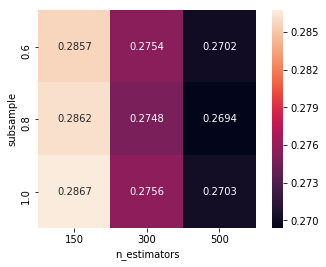

In [98]:
# summarize results
print("Best: %f using %s" % (-grid_result.best_score_, grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (-mean, stdev, param))

n_estimators=[150,300,500]
subsample = [0.6,0.8,1.0]
data = pd.DataFrame(-means.reshape(3,3), columns=subsample, index = n_estimators)
# plot heatmap
ax = sns.heatmap(data.T,annot=True, square=True,fmt='.4g')
plt.xlabel('n_estimators')
plt.ylabel('subsample')
plt.show()

### Training Model on best parameters

#### Accuracy and Loss

In [50]:
clf_gb = GradientBoostingClassifier(subsample = 0.8,n_estimators=500)
clf_gb.fit(train_tfidf_sent_vectors,y_train)

pred = clf_gb.predict(train_tfidf_sent_vectors)
# evaluate accuracy
acc = accuracy_score(y_train, pred) * 100
print('\nThe Train accuracy of the gbdt classifier is %f%%' % (acc))
# predict the response
pred = clf_gb.predict(test_tfidf_sent_vectors)
# evaluate accuracy
acc = accuracy_score(y_test, pred) * 100
print('\nThe Test accuracy of the gbdt classifier is %f%%' % (acc))


The Train accuracy of the gbdt classifier is 90.285000%

The Test accuracy of the gbdt classifier is 88.910000%


In [51]:
print("Log Loss")
predict_y = clf_gb.predict_proba(train_tfidf_sent_vectors)
print('GridSearch')
print("The train log loss is:",log_loss(y_train, predict_y, labels=clf_gb.classes_, eps=1e-15))
predict_y = clf_gb.predict_proba(test_tfidf_sent_vectors)
print("The test log loss is:",log_loss(y_test, predict_y, labels=clf_gb.classes_, eps=1e-15))

Log Loss
GridSearch
The train log loss is: 0.23448320906770978
The test log loss is: 0.2674053107131827


#### F1 Score and Confusion matrix

GridSearch
F1 Score:  0.9366140832190215
******************************************


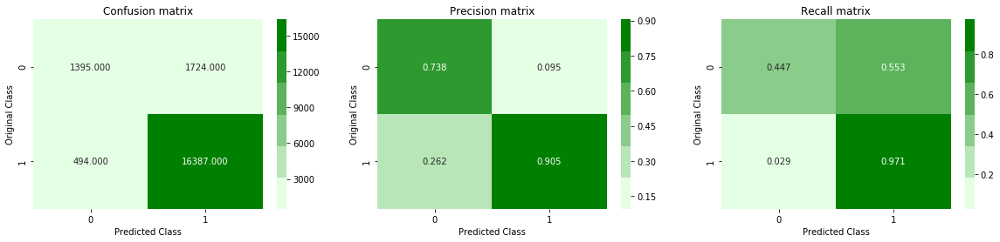

In [52]:
print('GridSearch')
print("F1 Score: ",f1_score(y_test,pred))
print("******************************************")
plot_confusion_matrix(y_test, pred)

## Observations:

1.Both accuaracy and loss is good .

2.Precision for classs 0 is good but recall is bad.

# -----------------------------------------------------------------------------------------------------

## XgBoost

In [53]:
import xgboost as xgb
xgb = xgb.XGBClassifier(n_estimators=500,subsample=0.8).fit(train_tfidf_sent_vectors,y_train)
pred = xgb.predict(train_tfidf_sent_vectors)

# evaluate accuracy
acc = accuracy_score(y_train, pred) * 100
print('\nThe Train accuracy of the xgbdt classifier is %f%%' % (acc))
# predict the response
pred = xgb.predict(test_tfidf_sent_vectors)
# evaluate accuracy
acc = accuracy_score(y_test, pred) * 100
print('\nThe Test accuracy of the xgbdt classifier is %f%%' % (acc))


The Train accuracy of the xgbdt classifier is 90.301250%

The Test accuracy of the xgbdt classifier is 89.090000%


In [54]:
print("Log Loss")
predict_y = xgb.predict_proba(train_tfidf_sent_vectors)
print('GridSearch')
print("The train log loss is:",log_loss(y_train, predict_y, labels=xgb.classes_, eps=1e-15))
predict_y = xgb.predict_proba(test_tfidf_sent_vectors)
print("The test log loss is:",log_loss(y_test, predict_y, labels=xgb.classes_, eps=1e-15))

Log Loss
GridSearch
The train log loss is: 0.23279880514413417
The test log loss is: 0.2632302750069698


GridSearch
F1 Score:  0.937657142857143
******************************************


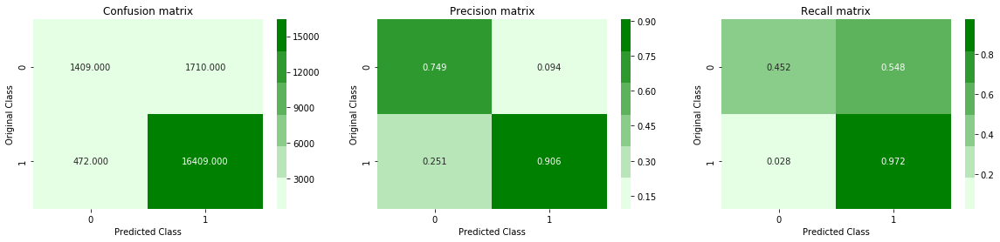

In [55]:
print('GridSearch')
print("F1 Score: ",f1_score(y_test,pred))
print("******************************************")
plot_confusion_matrix(y_test, pred)

## observations:

1.Accuarcy and loss is good.

2.Precision ifor class 0 is ok but recall is bad.

# ----------------------------------------------------------------------------------------------------------

## Linear SVM

#### GridSearch on C

In [56]:
from sklearn.svm import LinearSVC
svm_clf = LinearSVC(loss = 'hinge',class_weight ='balanced')
start= time.time()
grid_parameters = {'C':[10**-3,10**-2,10**0,10**2,10**3]}
gridSearchModel = GridSearchCV(svm_clf, grid_parameters, cv=10,n_jobs=-1)
gridSearchModel.fit(train_tfidf_sent_vectors, y_train)
print(gridSearchModel.best_params_)
print('GridSearch Time: ',(time.time() - start))

{'C': 1000}
GridSearch Time:  279.1997790336609


## Training model on best Parameter

#### Accuracy and Loss

In [57]:
lr_svm = LinearSVC( C=gridSearchModel.best_params_['C'],class_weight='balanced',penalty='l2')
lr_svm.fit(train_tfidf_sent_vectors, y_train)
tr_score = lr_svm.score(train_tfidf_sent_vectors, y_train)
print("GridSearch")
print("Training Accuracy :",tr_score)
tr_score = lr_svm.score(test_tfidf_sent_vectors, y_test)
print("Test Accuracy :",tr_score)
print('******************Hinge Loss***************')
print("Train loss :",hinge_loss(y_train,lr_svm.predict(train_tfidf_sent_vectors)))
print("Test loss :",hinge_loss(y_test,lr_svm.predict(test_tfidf_sent_vectors)))

GridSearch
Training Accuracy : 0.8013125
Test Accuracy : 0.8019
******************Hinge Loss***************
Train loss : 0.35465
Test loss : 0.35405


#### F1 Score and Confusion matrix

F1 Score:  0.886547162247294
******************************************


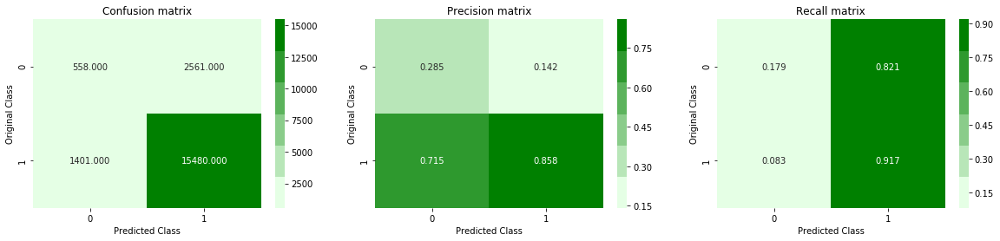

In [58]:
print("F1 Score: ",f1_score(y_test,lr_svm.predict(test_tfidf_sent_vectors)))
print("******************************************")
plot_confusion_matrix(y_test, lr_svm.predict(test_tfidf_sent_vectors))

## Observations:

1.Loss is not as compare to bow anf tfidf model.

2.model is predicting class  1 maximum time.

# ------------------------------------------------------------------------------------------------

## RBF SVM

#### GridSeach on C and Gamma

### Training model on best parameter

#### Accuracy and loss

In [30]:
svm_clf = svm.SVC()

grid_parameters = {'C':[10**-2,10**0,10**2],'gamma':[10**-1,10**0,10**1]}
gridSearchModel = GridSearchCV(svm_clf, grid_parameters, cv=3,n_jobs=-1)
gridSearchModel.fit(train_tfidf_sent_vectors, y_train)
print("GridSearch:",gridSearchModel.best_params_)

svm = svm.SVC(gamma=gridSearchModel.best_params_['gamma'], C=gridSearchModel.best_params_['C'],probability=True,class_weight='balanced')
svm.fit(train_tfidf_sent_vectors, y_train)
tr_score = svm.score(train_tfidf_sent_vectors, y_train)
print("Training Accuracy :",tr_score)
tr_score = svm.score(test_tfidf_sent_vectors, y_test)
print("Test Accuracy :",tr_score)

GridSearch: {'C': 1, 'gamma': 0.1}
Training Accuracy : 0.976725
Test Accuracy : 0.8777


In [31]:
print('***************Log Loss***************')
predict_y = svm.predict_proba(train_tfidf_sent_vectors)
print('GridSearch')
print("The train log loss is:",log_loss(y_train, predict_y, labels=svm.classes_, eps=1e-15))
predict_y = svm.predict_proba(test_tfidf_sent_vectors)
print("The test log loss is:",log_loss(y_test, predict_y, labels=svm.classes_, eps=1e-15))

***************Log Loss***************
GridSearch
The train log loss is: 0.0932488111423858
The test log loss is: 0.28113070393058415


#### F1 Score and Confusion matrix

F1 Score:  0.9282024186920277
******************************************


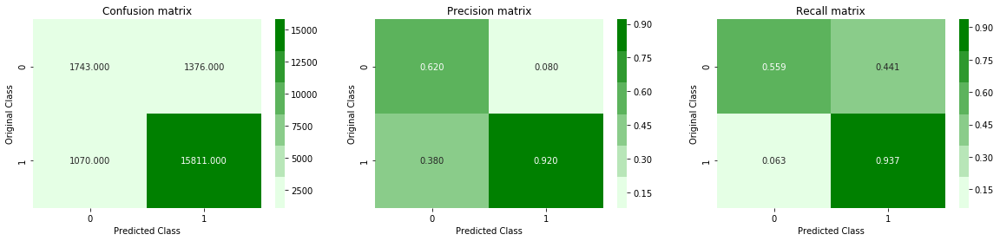

In [32]:
print("F1 Score: ",f1_score(y_test,svm.predict(test_tfidf_sent_vectors)))
print("******************************************")
plot_confusion_matrix(y_test, svm.predict(test_tfidf_sent_vectors))

## Observations:

1.Training Accuracy is high and test accuracy is less as compare to it.

2.Training Loss is very low but test loss is high so our model is overfitting.

3.Both precision and recall is bad for class 0.

# ------------------------------------------------------------------------------------------------------

## KNN

#### GridSearch on no.of nearest neighbours

In [109]:
start=time.time()
clf = KNeighborsClassifier(n_jobs = -1)
grid_parameters = {'n_neighbors':[3,5,7,9]}
grid_search = GridSearchCV(clf, grid_parameters, cv=3,scoring="neg_log_loss",n_jobs=-1)
grid_result = grid_search.fit(train_tfidf_sent_vectors,y_train)
print('GridSearch Time: ',(time.time() - start))

GridSearch Time:  2001.6462678909302


Best: 0.794311 using {'n_neighbors': 9}
2.049523 (0.034587) with: {'n_neighbors': 3}
1.324025 (0.019045) with: {'n_neighbors': 5}
0.987063 (0.019341) with: {'n_neighbors': 7}
0.794311 (0.015252) with: {'n_neighbors': 9}


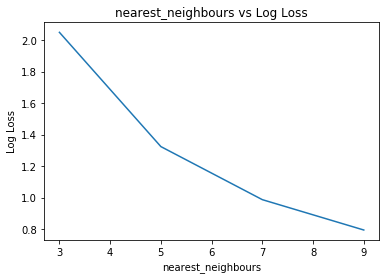

In [110]:
# summarize results
print("Best: %f using %s" % (-grid_result.best_score_, grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (-mean, stdev, param))
# plot
plt.errorbar([3,5,7,9], -means)
plt.title("nearest_neighbours vs Log Loss")
plt.xlabel('nearest_neighbours')
plt.ylabel('Log Loss')
plt.show()

### Training Model on Best parameter

#### Accuracy and loss

In [33]:
knn = KNeighborsClassifier(n_neighbors = 7,n_jobs = -1)
knn.fit(train_tfidf_sent_vectors,y_train)
pred = knn.predict(train_tfidf_sent_vectors)
# evaluate accuracy
acc = accuracy_score(y_train, pred) * 100
print('\nThe Train accuracy of the DT classifier is %f%%' % (acc))
# predict the response
pred = knn.predict(test_tfidf_sent_vectors)
# evaluate accuracy
acc = accuracy_score(y_test, pred) * 100
print('\nThe Test accuracy of the knn classifier is %f%%' % (acc))
print('GridSearch')
predict_y = knn.predict_proba(train_tfidf_sent_vectors)
print("The train log loss is:",log_loss(y_train, predict_y, labels=knn.classes_, eps=1e-15))
predict_y = knn.predict_proba(test_tfidf_sent_vectors)
print("The test log loss is:",log_loss(y_test, predict_y, labels=knn.classes_, eps=1e-15))


The Train accuracy of the DT classifier is 89.530000%

The Test accuracy of the knn classifier is 87.355000%
GridSearch
The train log loss is: 0.2293436164330075
The test log loss is: 0.962391842563659


#### F1 Score and Confusion matrix

GridSearch
F1 Score:  0.9285492301172482
******************************************


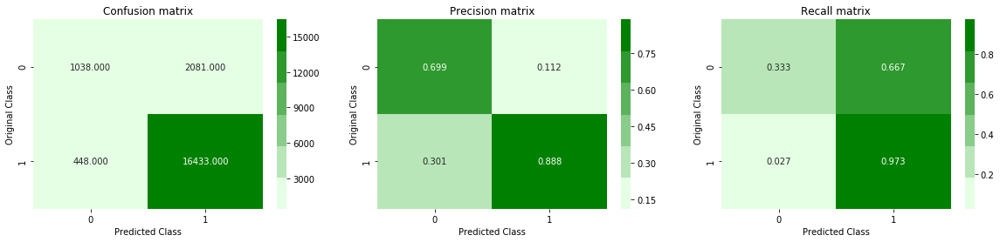

In [35]:
print('GridSearch')
print("F1 Score: ",f1_score(y_test,pred))
print("******************************************")
plot_confusion_matrix(y_test, pred)

## Observations:

1.Train and Test loss have high difference. test loss is very bad

In [38]:
y = PrettyTable(['Tfidf-Wighted-W2V'])
print(y)
x  =PrettyTable(["Model", "Test Accuracy", "Train Loss",'Test Loss','F1 Score'])
x.add_row(['Logistic Reg',81.31,0.41 , 0.41,0.879])
x.add_row(['DT',85.42,0.34,0.35,0.918])
x.add_row(['Random Forest',86.47,0.28,0.31,0.925])
x.add_row(['GBDT',88.91,0.23,0.26,0.936])
x.add_row(['XGBOOST',89.09,0.23,0.26,0.937])
x.add_row(['Linear SVM',80.19,0.35,0.35,0.886])
x.add_row(['RBF SVM',87.77,0.09,0.28,0.928])
x.add_row(['KNN',87.35,0.22,0.96,0.928])

print(x)

+-------------------+
| Tfidf-Wighted-W2V |
+-------------------+
+-------------------+
+---------------+---------------+------------+-----------+----------+
|     Model     | Test Accuracy | Train Loss | Test Loss | F1 Score |
+---------------+---------------+------------+-----------+----------+
|  Logistic Reg |     81.31     |    0.41    |    0.41   |  0.879   |
|       DT      |     85.42     |    0.34    |    0.35   |  0.918   |
| Random Forest |     86.47     |    0.28    |    0.31   |  0.925   |
|      GBDT     |     88.91     |    0.23    |    0.26   |  0.936   |
|    XGBOOST    |     89.09     |    0.23    |    0.26   |  0.937   |
|   Linear SVM  |     80.19     |    0.35    |    0.35   |  0.886   |
|    RBF SVM    |     87.77     |    0.09    |    0.28   |  0.928   |
|      KNN      |     87.35     |    0.22    |    0.96   |  0.928   |
+---------------+---------------+------------+-----------+----------+


# ----------------------------////////////////////////////////////////////\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\--------------------------

# LSTM

In [59]:
from keras.preprocessing import sequence
from keras.models import Sequential
from keras.layers import Dense, Dropout, Activation
from keras.layers import Embedding
from keras.layers import LSTM
from keras.layers import Conv1D, MaxPooling1D
from sklearn.feature_extraction.text import CountVectorizer
from keras.preprocessing.text import Tokenizer
from keras.preprocessing.sequence import pad_sequences
from keras.models import Sequential
from keras.layers import Dense, Embedding, LSTM
from sklearn.model_selection import train_test_split
from keras.utils.np_utils import to_categorical
from keras.callbacks import EarlyStopping
from keras.callbacks import ModelCheckpoint
from keras.models import model_from_json
import re
import warnings 
warnings.filterwarnings('ignore')
from subprocess import check_output

Using TensorFlow backend.


In [60]:
# Embedding
max_features = 5000
maxlen = 600
embedding_size = 32

# Convolution
kernel_size = 5
filters = 32
pool_size = 4

# LSTM
lstm_output_size = 70

# Training
batch_size = 64
epochs = 5

In [64]:
tokenizer = Tokenizer(num_words = 10000, split=' ')
tokenizer.fit_on_texts(final_100k['Text'].values)
X = tokenizer.texts_to_sequences(final_100k['Text'].values)
X = pad_sequences(X, maxlen = 600)

In [65]:
Y = pd.get_dummies(final_100k['Score']).values
X_train, X_test, Y_train, Y_test = train_test_split(X,Y, test_size = 0.20, random_state = 123)
print(X_train.shape,Y_train.shape)
print(X_test.shape,Y_test.shape)

(80000, 600) (80000, 2)
(20000, 600) (20000, 2)


In [66]:
# create the model
embedding_vecor_length = 32
model = Sequential()
model.add(Embedding(10000, embedding_vecor_length, input_length=600))
model.add(LSTM(100))
model.add(Dense(2, activation='sigmoid'))
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])
print(model.summary())

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_1 (Embedding)      (None, 600, 32)           320000    
_________________________________________________________________
lstm_1 (LSTM)                (None, 100)               53200     
_________________________________________________________________
dense_1 (Dense)              (None, 2)                 202       
Total params: 373,402
Trainable params: 373,402
Non-trainable params: 0
_________________________________________________________________
None


In [67]:
model.fit(X_train, Y_train, epochs=10, batch_size=64)
# Final evaluation of the model
scores = model.evaluate(X_test, Y_test, verbose=0)
print("Accuracy: %.2f%%" % (scores[1]*100))

Epoch 1/10
80000/80000 [==============================] - 694s 9ms/step - loss: 0.2562 - acc: 0.8996
Epoch 2/10
80000/80000 [==============================] - 685s 9ms/step - loss: 0.1727 - acc: 0.9344
Epoch 3/10
80000/80000 [==============================] - 693s 9ms/step - loss: 0.1463 - acc: 0.9445
Epoch 4/10
80000/80000 [==============================] - 690s 9ms/step - loss: 0.1220 - acc: 0.9548
Epoch 5/10
80000/80000 [==============================] - 696s 9ms/step - loss: 0.1021 - acc: 0.9622
Epoch 6/10
80000/80000 [==============================] - 696s 9ms/step - loss: 0.0839 - acc: 0.9701
Epoch 7/10
80000/80000 [==============================] - 700s 9ms/step - loss: 0.0715 - acc: 0.9752
Epoch 8/10
80000/80000 [==============================] - 703s 9ms/step - loss: 0.0608 - acc: 0.9793
Epoch 9/10
80000/80000 [==============================] - 704s 9ms/step - loss: 0.0484 - acc: 0.9842
Epoch 10/10
80000/80000 [==============================] - 702s 9ms/step - loss: 0.0425 - a

# CNN + LSTM

In [70]:
print('Build model...')

model = Sequential()
model.add(Embedding(10000, embedding_size, input_length=maxlen))
model.add(Dropout(0.25))
model.add(Conv1D(filters, kernel_size, padding='valid', activation='relu', strides=1))
model.add(MaxPooling1D(pool_size=pool_size))
model.add(LSTM(lstm_output_size))
model.add(Dense(2,activation='softmax'))
model.compile(loss = 'categorical_crossentropy', optimizer='adam',metrics = ['accuracy'])
print(model.summary())

Build model...
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_3 (Embedding)      (None, 600, 32)           320000    
_________________________________________________________________
dropout_2 (Dropout)          (None, 600, 32)           0         
_________________________________________________________________
conv1d_2 (Conv1D)            (None, 596, 32)           5152      
_________________________________________________________________
max_pooling1d_2 (MaxPooling1 (None, 149, 32)           0         
_________________________________________________________________
lstm_3 (LSTM)                (None, 70)                28840     
_________________________________________________________________
dense_3 (Dense)              (None, 2)                 142       
Total params: 354,134
Trainable params: 354,134
Non-trainable params: 0
_______________________________________________________

In [71]:
print('Train...')
model.fit(X_train, Y_train, batch_size=batch_size, epochs=epochs,shuffle=True, validation_data=(X_test, Y_test))
scores = model.evaluate(X_test, Y_test, verbose=0)
print("Accuracy: %.2f%%" % (scores[1]*100))

Train...
Train on 80000 samples, validate on 20000 samples
Epoch 1/5
80000/80000 [==============================] - 1715s 21ms/step - loss: 0.2329 - acc: 0.9064 - val_loss: 0.1682 - val_acc: 0.9347
Epoch 2/5
80000/80000 [==============================] - 1763s 22ms/step - loss: 0.1474 - acc: 0.9430 - val_loss: 0.1600 - val_acc: 0.9366
Epoch 3/5
80000/80000 [==============================] - 2079s 26ms/step - loss: 0.1168 - acc: 0.9563 - val_loss: 0.1793 - val_acc: 0.9291
Epoch 4/5
80000/80000 [==============================] - 1801s 23ms/step - loss: 0.0928 - acc: 0.9652 - val_loss: 0.1760 - val_acc: 0.9328
Epoch 5/5
80000/80000 [==============================] - 1742s 22ms/step - loss: 0.0727 - acc: 0.9737 - val_loss: 0.1938 - val_acc: 0.9364
Accuracy: 93.64%


## Observations:

1.Training Accuracy is very high and test accuracy is slightly less than it.

2.Training loss is very low and Train and test loss have large difference.our model is oveerfitting.

3.we need to use more dropout rate reduce the overfitting.

# ---------------------///////////////////////////////////\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\--------------------------

# Kmean on Bag Of Words

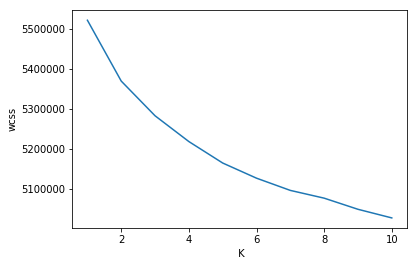

Kmean time Taken:  9392.707403182983


In [8]:
from sklearn.cluster import KMeans
start = time.time()
bow_vectorizer = CountVectorizer(min_df = 10,max_features = 2000)
kmean_bow= bow_vectorizer.fit_transform(df_100k['NewCleanedText'])

wcss=[]
for i in range(1, 11):
    kmeans = KMeans(n_clusters = i, init = 'k-means++', random_state = 123,n_jobs=-1)
    kmeans.fit(kmean_bow)
    wcss.append(kmeans.inertia_)

plt.plot(range(1, 11), wcss)


plt.xlabel(' K')
plt.ylabel('wcss')
plt.show()
end=time.time()
print("Kmean time Taken: ",(end-start))

Top terms per cluster:
Cluster 0: not like tast flavor one use product good tri water make would get sugar also drink dont chocol time much
Cluster 1: not product one good like would tast get tri amazon order love buy flavor great time eat box price make
Cluster 2: tea flavor not tast like drink bag green tri good one love make cup use great get box time ice
Cluster 3: coffe not tast flavor like cup good tri one great drink use love make roast get price strong buy brew
Cluster 4: coffe not like flavor cup tast use roast one brew good tri drink bean make would starbuck get bag pod
Cluster 5: like tast flavor not good tri one realli great chocol love dont eat get would make product drink sweet much
Cluster 6: tea not green flavor tast like bag drink use one cup make tri good black water brew get also time
Cluster 7: food dog cat not eat like one love get tri treat would feed dri good use time well also product
Cluster 8: use product make not like great one good tri tast oil also flavor g

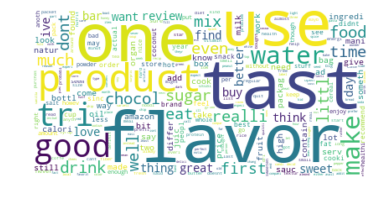

Cluster 1: 
Feature importance WordClouds


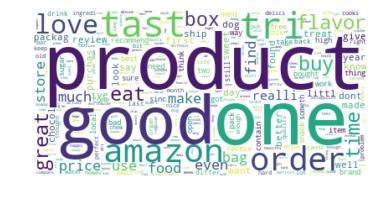

Cluster 2: 
Feature importance WordClouds


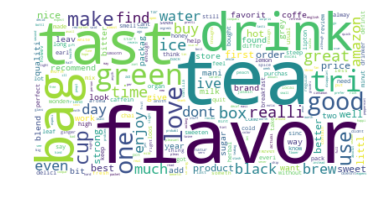

Cluster 3: 
Feature importance WordClouds


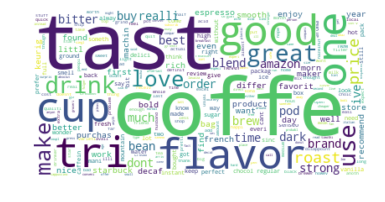

Cluster 4: 
Feature importance WordClouds


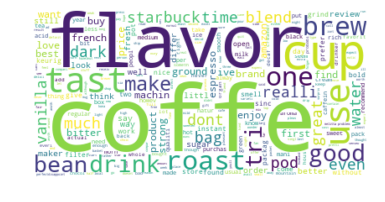

Cluster 5: 
Feature importance WordClouds


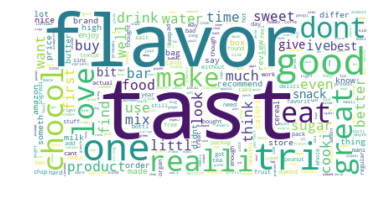

Cluster 6: 
Feature importance WordClouds


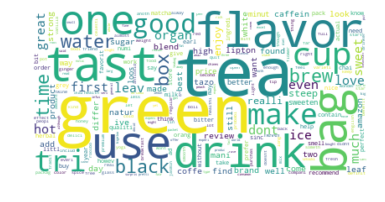

Cluster 7: 
Feature importance WordClouds


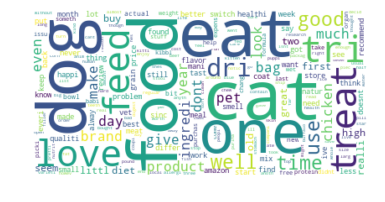

Cluster 8: 
Feature importance WordClouds


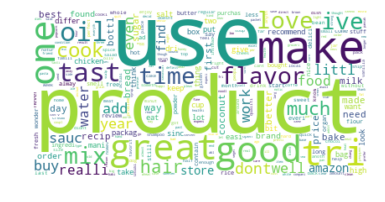

Cluster 9: 
Feature importance WordClouds


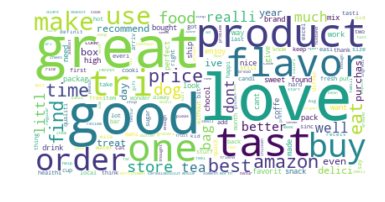

In [20]:
print("Top terms per cluster:")
order_centroids = kmeans.cluster_centers_.argsort()[:, ::-1]
terms = bow_vectorizer.get_feature_names()
for i in range(10):
    top_ten_words = [terms[ind] for ind in order_centroids[i, :20]]
    print("Cluster {}: {}".format(i, ' '.join(top_ten_words)))
print("-------------------------------------------------------------------")
print("WordCloud")
for i in range(10):
    top_ten_words = [terms[ind] for ind in order_centroids[i, :]]
    text =' '.join(top_ten_words)
    print("Cluster {}: ".format(i))
    wc = WordCloud(background_color="white", max_words=len(text))
    wc.generate(text)
    print ("Feature importance WordClouds")
    plt.imshow(wc, interpolation='bilinear')
    plt.axis("off")
    plt.show()
    

## Observations:

### Cluster 0:

It looks like that it is about taste or flovour of food.and it is consisting of negative reviews.

### Cluster 1:

It is about product .it is also consisto of neagative reviews.

### Cluster 2:

It is mainly consist more thing about tea and its taste and flovour.

### Cluster 3:

It is about Coffee taste and flovour.

### Cluster 4:

It is also about coffee

### Cluster 5:

It is about taste and flovour of chocolate.

### Cluster 6:

it is about green tea,drink and bag

### Cluster 7:

this cluster consist about animal food.

### Cluster 8:

This cluster is about product use.

### Cluster 9:

This cluster of positive reviews which are very happy with Amazon.

## Tfidf

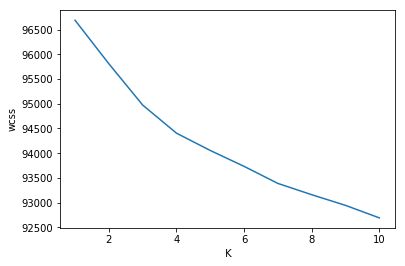

Kmean time Taken:  11568.455049991608


In [21]:
start = time.time()
tfidf_vectorizer = TfidfVectorizer(min_df = 10,max_features = 2000)
kmean_tfidf= tfidf_vectorizer.fit_transform(df_100k['NewCleanedText'])

wcss=[]
for i in range(1, 11):
    kmeans = KMeans(n_clusters = i, init = 'k-means++', random_state = 123,n_jobs=-1)
    kmeans.fit(kmean_tfidf)
    wcss.append(kmeans.inertia_)

plt.plot(range(1, 11), wcss)


plt.xlabel(' K')
plt.ylabel('wcss')
plt.show()
end=time.time()
print("Kmean time Taken: ",(end-start))

Top terms per cluster:
Cluster 0: sauc pasta hot not tast use flavor like cook great tri noodl good make heat love chicken add spici tomato
Cluster 1: use make oil product mix great bread cook not tast good like tri flavor recip bake add easi love also
Cluster 2: tast like not flavor good love great tri one eat realli get product drink snack would sweet littl dont make
Cluster 3: chocol bar tast not dark like good flavor love one great snack eat sweet candi milk tri cocoa granola hot
Cluster 4: cat food eat love treat like one not get can dri feed kitti pet tri chicken product well vet give
Cluster 5: product order amazon price store find great buy ship not love local box good time purchas arriv get thank item
Cluster 6: dog treat food love chew one like eat not get product bone give teeth good great feed small would bag
Cluster 7: cooki chocol tast like love not good chip soft great one eat oatmeal box tri sweet flavor delici gluten make
Cluster 8: coffe cup flavor tast not like roast

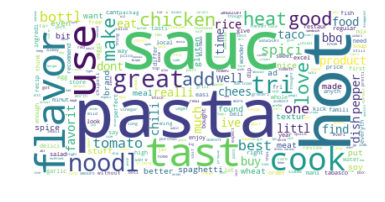

Cluster 1: 
Feature importance WordClouds


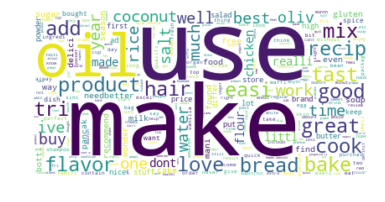

Cluster 2: 
Feature importance WordClouds


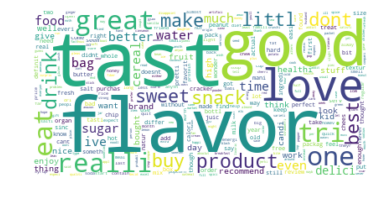

Cluster 3: 
Feature importance WordClouds


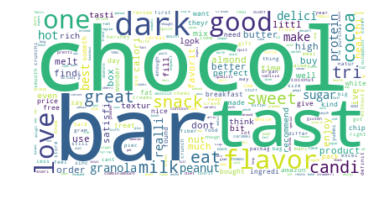

Cluster 4: 
Feature importance WordClouds


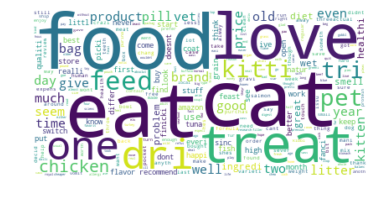

Cluster 5: 
Feature importance WordClouds


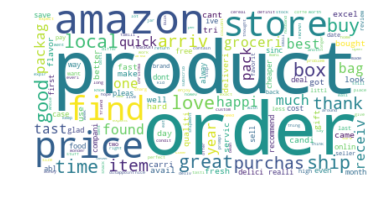

Cluster 6: 
Feature importance WordClouds


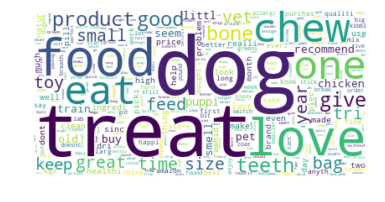

Cluster 7: 
Feature importance WordClouds


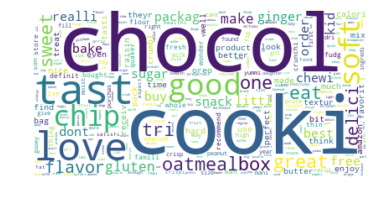

Cluster 8: 
Feature importance WordClouds


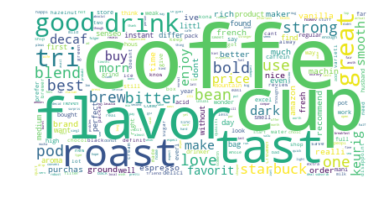

Cluster 9: 
Feature importance WordClouds


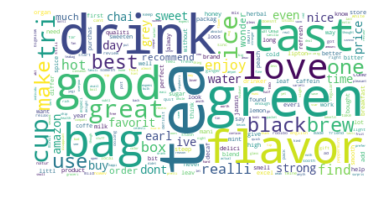

In [22]:
print("Top terms per cluster:")
order_centroids = kmeans.cluster_centers_.argsort()[:, ::-1]
terms = tfidf_vectorizer.get_feature_names()
for i in range(10):
    top_ten_words = [terms[ind] for ind in order_centroids[i, :20]]
    print("Cluster {}: {}".format(i, ' '.join(top_ten_words)))
print("-------------------------------------------------------------------")
print("WordCloud")
for i in range(10):
    top_ten_words = [terms[ind] for ind in order_centroids[i, :]]
    text =' '.join(top_ten_words)
    print("Cluster {}: ".format(i))
    wc = WordCloud(background_color="white", max_words=len(text))
    wc.generate(text)
    print ("Feature importance WordClouds")
    plt.imshow(wc, interpolation='bilinear')
    plt.axis("off")
    plt.show()
    

## Observations:

### Cluster 0:

It looks like that it is about sauce, pasta and noodles. it means it consist of fast food reviews.

### Cluster 1:

It is about Recipie making or say cooking it consist of words like oil,bread ,mix,cook

### Cluster 2:

It is mainly consist more thing about snacks and drink and its taste and flovour. means about breakfast food.

### Cluster 3:

It is about Chocolate and its flovour and color.

### Cluster 4:

It is about animal food.

### Cluster 5:

It is about product order and customer reviews on it

### Cluster 6:

it is about animal food for dog mainly.

### Cluster 7:

this cluster consist about chocolate ,cookie and oatmeal

### Cluster 8:

This cluster is about Coffee.

### Cluster 9:

This cluster of consist of reviews about green tea and Coffee.

## W2V

In [6]:
import gensim
i=0
list_of_sent=[]
for sent in df_100k['NewCleanedText']:
    filtered_sentence=[]
    sent=cleanhtml(sent.decode('utf-8'))
    for w in sent.split():
        for cleaned_words in cleanpunc(w).split():
            if(cleaned_words.isalpha()):    
                filtered_sentence.append(cleaned_words.lower())
            else:
                continue 
    list_of_sent.append(filtered_sentence)   

In [9]:
import pickle
import os
if not os.path.isfile('sent_vectors'):
    # average Word2Vec
    # compute average word2vec for each review.
    sent_vectors = [];                           # the avg-w2v for each sentence/review is stored in this list
    for sent in list_of_sent:                    # for each review/sentence
        sent_vec = np.zeros(50)                        # as word vectors are of zero length
        cnt_words =0;                                  # num of words with a valid vector in the sentence/review
        for word in sent:                              # for each word in a review/sentence
            if word in w2v_words:
                vec = w2v_model.wv[word]
                sent_vec += vec
                cnt_words += 1
        if cnt_words != 0:
            sent_vec /= cnt_words
        sent_vectors.append(sent_vec)
    print(len(sent_vectors))
    print(len(sent_vectors[0]))
    # saving vector list
    with open("sent_vectors", "wb") as fp:   #Pickling
        pickle.dump(sent_vectors, fp)



    
with open("sent_vectors", "rb") as fp:   # Unpickling
    sent_vectors = pickle.load(fp)
print(len(sent_vectors))
print(len(sent_vectors[0]))


100000
50


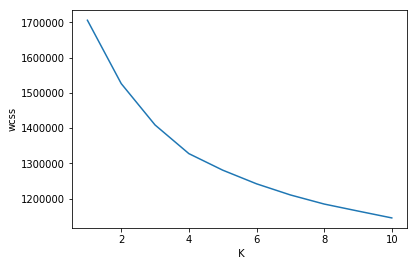

Kmean time Taken:  148.41334652900696


In [12]:
start = time.time()
wcss=[]
for i in range(1, 11):
    kmeans = KMeans(n_clusters = i, init = 'k-means++', random_state = 123,n_jobs=-1)
    kmeans.fit(sent_vectors)
    wcss.append(kmeans.inertia_)

plt.plot(range(1, 11), wcss)


plt.xlabel(' K')
plt.ylabel('wcss')
plt.show()
end=time.time()
print("Kmean time Taken: ",(end-start))

In [15]:
print("Top terms per cluster:")
order_centroids = kmeans.cluster_centers_.argsort()[:, ::-1]
for i in range(10):
    top_ten_words = [w2v_model.wv.index2word[ind] for ind in order_centroids[i, :20]]
    print("Cluster {}: {}".format(i, ' '.join(top_ten_words)))



Top terms per cluster:
Cluster 0: year love well one tast would time first water store coffe amazon drink recommend eat dont ive order flavor price
Cluster 1: amazon eat love ive flavor year great realli tea product like littl dont well drink chocol water tast recommend would
Cluster 2: well amazon would love year like littl realli flavor dont order ive eat day coffe good product great recommend bag
Cluster 3: amazon water packag year product tast ive also well make dog time want great flavor first mix love much recommend
Cluster 4: year tast price order first recommend water well ive find one better dont product chocol much would also mix eat
Cluster 5: product store coffe first flavor eat tast one realli dont chocol drink even love year also look would well water
Cluster 6: product store chocol one drink coffe love eat year first look time also littl dont flavor would great realli tri
Cluster 7: product flavor amazon price well first eat year love would order dont water dog tast find

-------------------------------------------------------------------
WordCloud
Cluster 0: 
Feature importance WordClouds


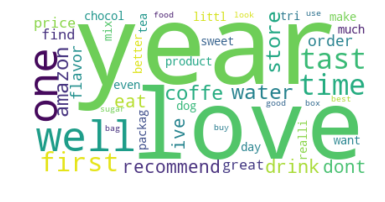

Cluster 1: 
Feature importance WordClouds


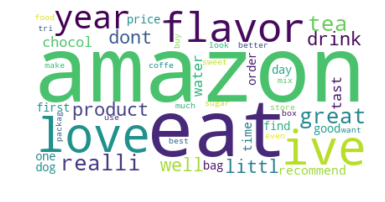

Cluster 2: 
Feature importance WordClouds


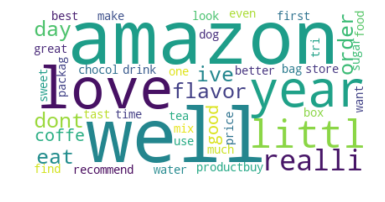

Cluster 3: 
Feature importance WordClouds


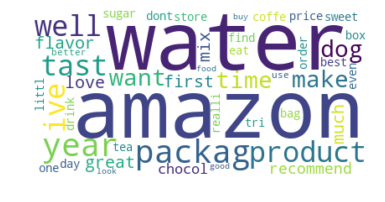

Cluster 4: 
Feature importance WordClouds


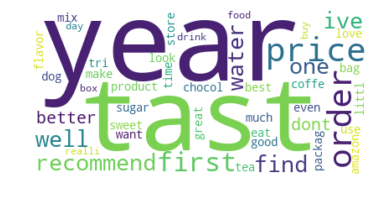

Cluster 5: 
Feature importance WordClouds


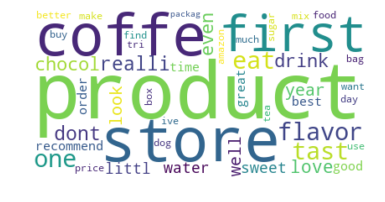

Cluster 6: 
Feature importance WordClouds


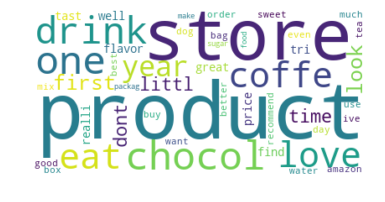

Cluster 7: 
Feature importance WordClouds


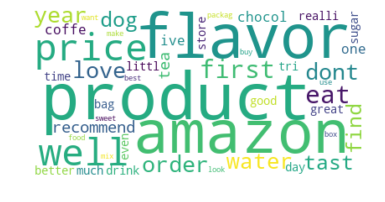

Cluster 8: 
Feature importance WordClouds


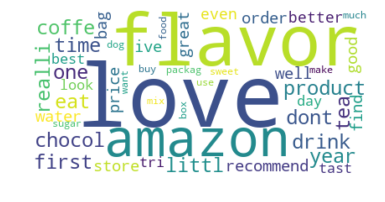

Cluster 9: 
Feature importance WordClouds


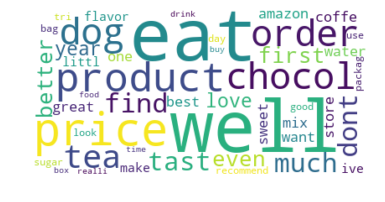

In [16]:
print("-------------------------------------------------------------------")
print("WordCloud")
for i in range(10):
    top_ten_words = [w2v_model.wv.index2word[ind] for ind in order_centroids[i, :]]
    text =' '.join(top_ten_words)
    print("Cluster {}: ".format(i))
    wc = WordCloud(background_color="white", max_words=len(text))
    wc.generate(text)
    print ("Feature importance WordClouds")
    plt.imshow(wc, interpolation='bilinear')
    plt.axis("off")
    plt.show()

## Observations:

### Cluster 0:

This cluster consist reviews about coffee and itds store

### Cluster 1:

It is about tea product .

### Cluster 2:

It is mainly consist positive reviews for amazon.

### Cluster 3:

It is about recommend product

### Cluster 4:

It is also about coffee

### Cluster 5:

It is about coffee product store.

### Cluster 6:

it is about cofffee and its flovour.

### Cluster 7:

this cluster consist about price .

### Cluster 8:

This cluster is love to coffe, tea and chocolate.

### Cluster 9:

This cluster of chocolate eating .

## TFidf Weighted W2V

In [17]:
tf_idf_vectorizer = TfidfVectorizer(min_df = 10,max_features = 2000)
train_tfidf = tf_idf_vectorizer.fit_transform(df_100k['NewCleanedText'])


In [19]:
if not os.path.isfile('tfidf_sent_vectors'):
    
    tfidf_feat = tf_idf_vectorizer.get_feature_names()
    tfidf_sent_vectors = []; # the tfidf-w2v for each sentence/review is stored in this list
    row=0;
    for sent in list_of_sent: # for each review/sentence 
        sent_vec = np.zeros(50) # as word vectors are of zero length
        weight_sum =0; # num of words with a valid vector in the sentence/review
        for word in sent:
            try:
                if word in w2v_words:    # obtain the tf_idfidf of a word in a sentence/review
                
                    vec = w2v_model.wv[word]
                
                    tf_idf = train_tfidf[row, tfidf_feat.index(word)]
                    sent_vec += (vec * tf_idf)
                    weight_sum += tf_idf
                    # for each word in a review/sentence
            
            except:
                pass
        if weight_sum != 0:
            sent_vec /= weight_sum
        tfidf_sent_vectors.append(sent_vec)
        row += 1
        # saving vector list
    with open("tfidf_sent_vectors", "wb") as fp:   #Pickling
        pickle.dump(tfidf_sent_vectors, fp)

with open("tfidf_sent_vectors", "rb") as fp:   # Unpickling
    tfidf_sent_vectors = pickle.load(fp)
print(len(tfidf_sent_vectors))
print(len(tfidf_sent_vectors[0]))

100000
50


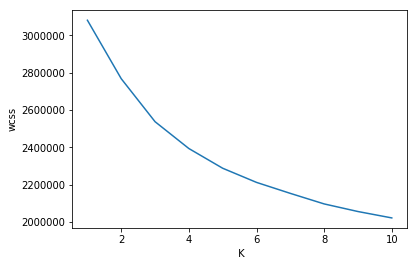

Kmean time Taken:  138.93650937080383


In [20]:
start = time.time()
wcss=[]
for i in range(1, 11):
    kmeans = KMeans(n_clusters = i, init = 'k-means++', random_state = 123,n_jobs=-1)
    kmeans.fit(tfidf_sent_vectors)
    wcss.append(kmeans.inertia_)

plt.plot(range(1, 11), wcss)


plt.xlabel(' K')
plt.ylabel('wcss')
plt.show()
end=time.time()
print("Kmean time Taken: ",(end-start))

In [21]:
print("Top terms per cluster:")
order_centroids = kmeans.cluster_centers_.argsort()[:, ::-1]
for i in range(10):
    top_ten_words = [w2v_model.wv.index2word[ind] for ind in order_centroids[i, :20]]
    print("Cluster {}: {}".format(i, ' '.join(top_ten_words)))



Top terms per cluster:
Cluster 0: year tast price first recommend order ive well water better one find mix also product would chocol much dont tea
Cluster 1: amazon ive flavor eat realli love chocol tea littl year tast recommend drink product like well water good great price
Cluster 2: product chocol store one coffe look drink year eat littl tri also love time first sweet want tast realli best
Cluster 3: tast coffe store first product one realli eat chocol drink even flavor look dont also sweet littl year day best
Cluster 4: amazon water packag year make also product mix want tast ive dog time day much well first chocol great get
Cluster 5: love drink chocol product amazon flavor coffe eat time one dont realli tea would first year littl store ive price
Cluster 6: amazon littl eat like year ive flavor would bag realli recommend well love find day tea one order drink tast
Cluster 7: well amazon would day like good year littl better order realli love product coffe ive dont great also get 

-------------------------------------------------------------------
WordCloud
Cluster 0: 
Feature importance WordClouds


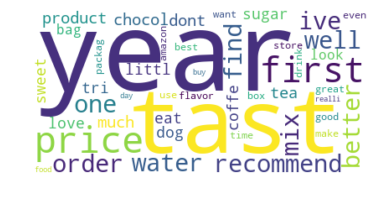

Cluster 1: 
Feature importance WordClouds


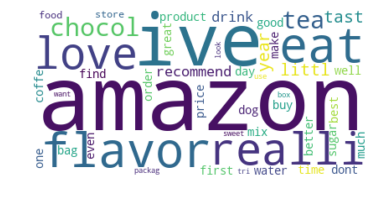

Cluster 2: 
Feature importance WordClouds


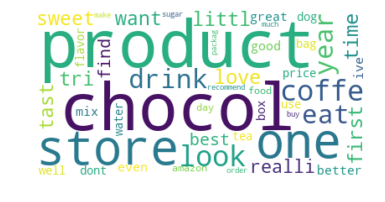

Cluster 3: 
Feature importance WordClouds


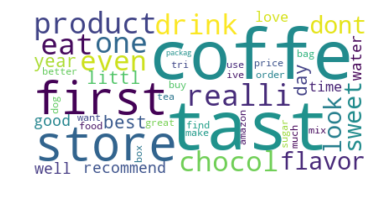

Cluster 4: 
Feature importance WordClouds


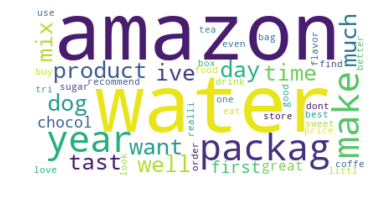

Cluster 5: 
Feature importance WordClouds


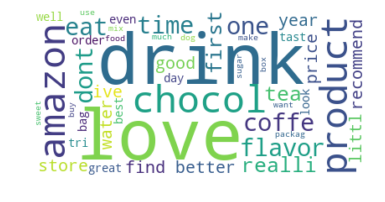

Cluster 6: 
Feature importance WordClouds


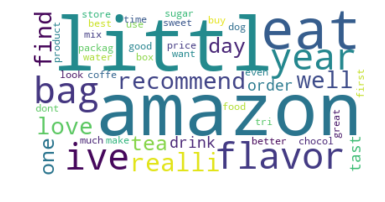

Cluster 7: 
Feature importance WordClouds


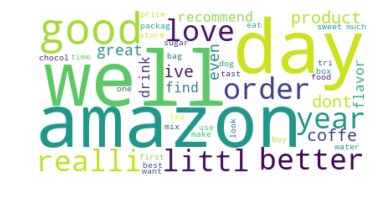

Cluster 8: 
Feature importance WordClouds


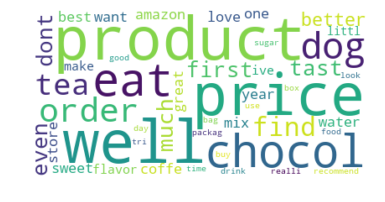

Cluster 9: 
Feature importance WordClouds


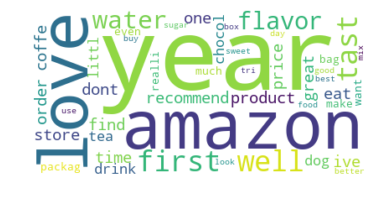

In [22]:
print("-------------------------------------------------------------------")
print("WordCloud")
for i in range(10):
    top_ten_words = [w2v_model.wv.index2word[ind] for ind in order_centroids[i, :]]
    text =' '.join(top_ten_words)
    print("Cluster {}: ".format(i))
    wc = WordCloud(background_color="white", max_words=len(text))
    wc.generate(text)
    print ("Feature importance WordClouds")
    plt.imshow(wc, interpolation='bilinear')
    plt.axis("off")
    plt.show()

## Observations:

### Cluster 0:

It looks like that it is about taste or flovour of food.and it is consisting of negative reviews.

### Cluster 1:

It is about product .it is also consisto of neagative reviews.

### Cluster 2:

It is mainly consist more thing about chocolate and its taste and flovour.

### Cluster 3:

It is about Coffee taste and flovour.

### Cluster 4:

It is also about package and water

### Cluster 5:

It is about drink coffee and eat chocolate.

### Cluster 6:

it is about recommending 

### Cluster 7:

this cluster consist about happiness of customer with amazon.

### Cluster 8:

This cluster is about product price vs taste.

### Cluster 9:

This cluster of love toward amazon.

# -----------------------//////////////////////////////////\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\-------------------------------

# Agglomerative Clustering: 

In [12]:
df_5k = final.sample(n = 5000,random_state = 123)
final_5k = df_5k.sort_values('Time')               # sorting according to time for Time based spliting
print(final_5k['Score'].value_counts())
y = final_5k['Score'].values
final_5k.head(1)

positive    4256
negative     744
Name: Score, dtype: int64


,index,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text,NewCleanedText,NewCleanedSummary
2215,28086,30629,B00008RCMI,A19E94CF5O1LY7,Andrew Arnold,0,0,positive,1067040000,"I've chewed this gum many times, but used?","Nothing against the product, but it does bothe...",b'noth product bother link top page buy use ch...,b'ive chew gum mani time use'


In [17]:
bow_vectorizer = CountVectorizer()
agg_clus_bow= bow_vectorizer.fit_transform(df_5k['NewCleanedText'])

In [18]:

clustering = AgglomerativeClustering(n_clusters=2).fit(agg_clus_bow.toarray())

In [8]:
y_hat = clustering.labels_
         # importing label encoder to encode our y values as 0 or 1
labelencoder_X=LabelEncoder()                          # creating object of label encoder
y = labelencoder_X.fit_transform(y) 
y_in = []
for i in y:
    if i==1:
        y_in.append(0)
    else:
        y_in.append(1)      

In [19]:
final_5k['Clustering_label'] = clustering.labels_
final_5k.head(3)

,index,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text,NewCleanedText,NewCleanedSummary,Clustering_label
2215,28086,30629,B00008RCMI,A19E94CF5O1LY7,Andrew Arnold,0,0,positive,1067040000,"I've chewed this gum many times, but used?","Nothing against the product, but it does bothe...",b'noth product bother link top page buy use ch...,b'ive chew gum mani time use',0
163001,422107,456525,B001D6C13O,A281NPSIMI1C2R,"Rebecca of Amazon ""The Rebecca Review""",2,2,positive,1074988800,Organic Darjeeling best with Organic Sucanat,"""Sitting on the porch of a bungalow on a tea p...",b'sit porch bungalow tea plantat darjeel see p...,b'organ darjeel best organ sucanat',0
15120,391217,423000,B0002CEVP6,A31QTHLL2MK8LF,Gina,3,3,positive,1086998400,Coffee Cake,"Yummy, This was the best I ever had!! Great ...",b'yummi best ever great servic fresh',b'coffe cake',0


In [22]:
print(final_5k['Clustering_label'].value_counts())
final_5k[final_5k['Clustering_label']==1]

0    4999
1       1
Name: Clustering_label, dtype: int64


,index,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text,NewCleanedText,NewCleanedSummary,Clustering_label
194559,201462,218311,B001FXPNY4,AE23TVGWVLJIX,S. Larsen,0,1,positive,1299628800,Love it,I think it tastes great with some almond milk ...,b'think tast great almond milk fit well low ca...,b'love',1


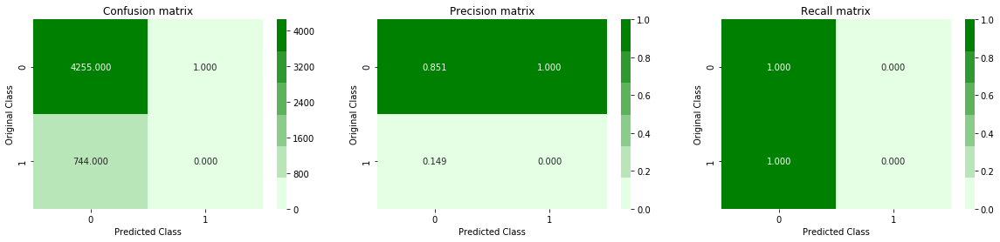

In [10]:
plot_confusion_matrix(y_in, y_hat)

In [9]:
from sklearn.metrics import confusion_matrix
confusion_matrix(y_in,y_hat)

array([[4255,    1],
       [ 744,    0]], dtype=int64)

# -------------------------//////////////////////////////\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\-------------------------------

## Truncated SVD

In [24]:
tf_idf_vectorizer = TfidfVectorizer(max_features = 2000)
train_tfidf = tf_idf_vectorizer.fit_transform(df_100k['NewCleanedText'])

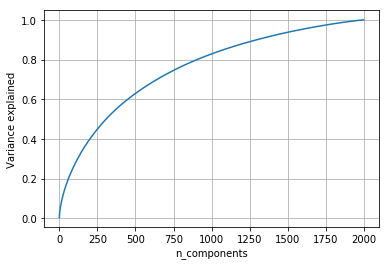

0.9999602151860465

In [26]:
from sklearn.decomposition import TruncatedSVD
svdT = TruncatedSVD(n_components=1999)
svdTFit = svdT.fit_transform(train_tfidf)


explained_var = svdT.explained_variance_ratio_

e = np.cumsum(explained_var)

plt.plot(e)
plt.xlabel('n_components')
plt.grid()
plt.ylabel('Variance explained')
plt.show()

explained_var.sum()


In [27]:
from sklearn.decomposition import TruncatedSVD
svdT = TruncatedSVD(n_components=1500)
svdTFit = svdT.fit_transform(train_tfidf)

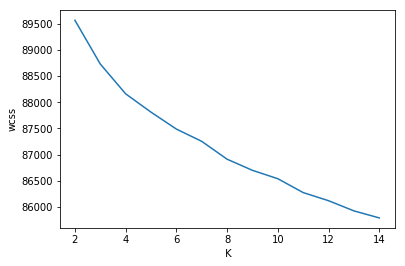

NameError: name 'start' is not defined

In [28]:
start =time.time()
wcss=[]
for i in range(2, 15):
    kmeans = KMeans(n_clusters = i, init = 'k-means++', random_state = 123,n_jobs=-1)
    kmeans.fit(svdTFit)
    wcss.append(kmeans.inertia_)

plt.plot(range(2, 15), wcss)


plt.xlabel(' K')
plt.ylabel('wcss')
plt.show()
end=time.time()
print("Kmean time Taken: ",(end-start))

Top terms per cluster:
Cluster 2: absolut abl acai across ad acquir access acid accept admit alot ahead advis also afterward altern afraid avail apart although
Cluster 3: acid abl acai acquir advertis advis act addict across add activ actual affect among allergi age alon anyon afternoon although
Cluster 4: abl accord across acid afterward aftertast ahead ador advertis ad along allerg anni appli alcohol altern artifici appreci answer appeal
Cluster 5: abl act accept addit agav ador addict adopt appl anoth alway almond allow access afternoon amaz afterward adult amount ad
Cluster 6: abl across access addict activ afford adult acid afraid advertis ahead absorb afterward adopt answer allergi asian alcohol among altern
Cluster 7: abl adopt addict admit advis agre activ accord air affect almond afraid act apricot alcohol aspartam around arriv approxim acid
Cluster 8: abl access across air advis adjust acid ad allerg age alon aftertast along acquir allow american alway artifici appli anyway
C

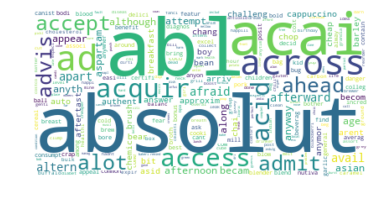

Cluster 3: 
Feature importance WordClouds


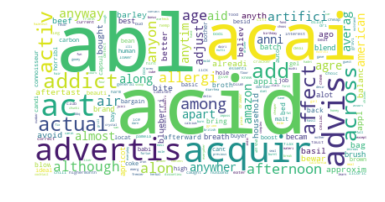

Cluster 4: 
Feature importance WordClouds


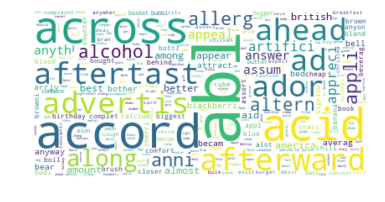

Cluster 5: 
Feature importance WordClouds


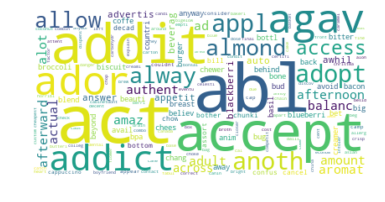

Cluster 6: 
Feature importance WordClouds


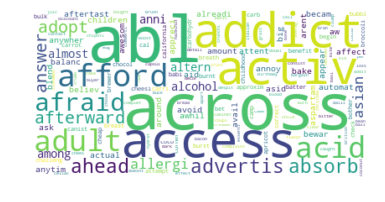

Cluster 7: 
Feature importance WordClouds


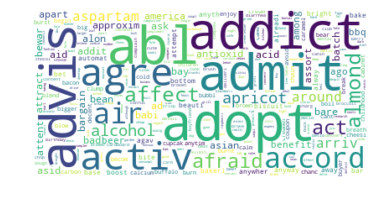

Cluster 8: 
Feature importance WordClouds


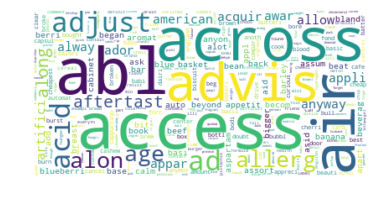

Cluster 9: 
Feature importance WordClouds


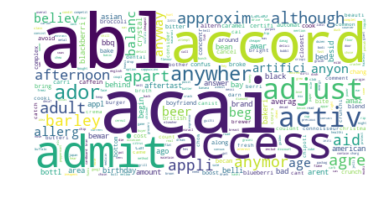

Cluster 10: 
Feature importance WordClouds


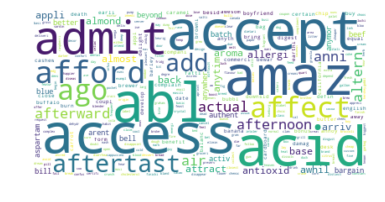

Cluster 11: 
Feature importance WordClouds


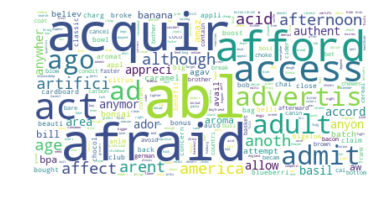

Cluster 12: 
Feature importance WordClouds


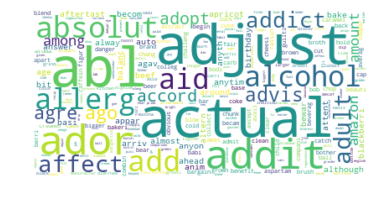

Cluster 13: 
Feature importance WordClouds


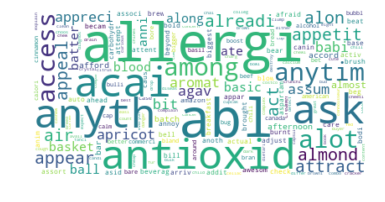

In [32]:
print("Top terms per cluster:")
order_centroids = kmeans.cluster_centers_.argsort()[:, ::-1]
terms = tf_idf_vectorizer.get_feature_names()
for i in range(2,14):
    top_ten_words = [terms[ind] for ind in order_centroids[i, :20]]
    print("Cluster {}: {}".format(i, ' '.join(top_ten_words)))
print("-------------------------------------------------------------------")
print("WordCloud")
for i in range(2,14):
    top_ten_words = [terms[ind] for ind in order_centroids[i, :]]
    text =' '.join(top_ten_words)
    print("Cluster {}: ".format(i))
    wc = WordCloud(background_color="white", max_words=len(text))
    wc.generate(text)
    print ("Feature importance WordClouds")
    plt.imshow(wc, interpolation='bilinear')
    plt.axis("off")
    plt.show()
    

## Observations:

Maximum cluster are about medicine and theire uses

## Co-occurrence matrix

In [33]:
type(train_tfidf)

scipy.sparse.csr.csr_matrix

In [36]:
cooc = (train_tfidf.T ) * (train_tfidf)
cooc.setdiag(0) # reset diagonal
print(cooc.todense()) # to print co-occurence matrix in dense format

[[0.         1.99803701 0.14839576 ... 1.86593202 0.36363759 0.25211637]
 [1.99803701 0.         0.16187388 ... 2.73470728 0.86743583 0.35677192]
 [0.14839576 0.16187388 0.         ... 0.10102129 0.17316476 0.        ]
 ...
 [1.86593202 2.73470728 0.10102129 ... 0.         0.17905735 0.33145053]
 [0.36363759 0.86743583 0.17316476 ... 0.17905735 0.         0.11362697]
 [0.25211637 0.35677192 0.         ... 0.33145053 0.11362697 0.        ]]
